In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis
from itertools import combinations

In [3]:
import scipy.stats as stats
import math

In [4]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [5]:
l = [0.01,0.1,0.2,0.3,0.5]
livetime = [25,20,10,8,5,4,2,1] * u.h
n_obs = [40,50,100,125,200,250,500,1000]
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 31), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [6]:
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
rows, cols = (8, 6) 
model = [[0 for i in range(cols)] for j in range(rows)]
print(model) 

[[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]]


In [8]:
for i in range(8):
    model_simu = PowerLawSpectralModel(
        index=2.22,
        amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
        reference=1 * u.TeV,
    )
    print(model_simu) 
    mod = SkyModel(spectral_model=model_simu)
    model[i][0]=mod

PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --

In [9]:
simu = []
for j in range(5):
    for i in range(8):
        sim = ExpCutoffPowerLawSpectralModel(
            index=2.22,
            amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
            reference=1 * u.TeV,
            lambda_=l[j] * u.Unit("TeV-1"),
            alpha = 1,
        )
        mod = SkyModel(spectral_model=sim)
        model[i][j+1]=mod
    simu.append(sim)
    print(simu[j])

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.000e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.000e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    inde

In [10]:
obs = [[0 for i in range(cols)] for j in range(rows)]
for j in range(6):
    for i in range(8):
        obs[i][j]=Observation.create(pointing=pointing, livetime=livetime[i], irfs=irfs)
        print(obs[i][j])

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 90000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 72000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 36000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 28800.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 18000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 14400.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 7200.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 3600.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 90000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 72000.0 s

Info for OBS


Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 3600.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 90000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 72000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 36000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 28800.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 18000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 14400.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 7200.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 3600.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 90000.0 s

Info for OBS

In [11]:
dataset = [[0 for i in range(cols)] for j in range(rows)]
for j in range(6):
    for i in range(8):
        dataset_empty = SpectrumDataset.create(
            e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
        )
        maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
        dataset[i][j]=maker.run(dataset_empty, obs[i][j])
        print(dataset[i][j])

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 10577.82

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 9.00e+04 s

    Number of total bins            : 0 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 8462.25

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 7.20e+04 s

    Number of total bins            : 0 
    Number of fit bins 

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 10577.82

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 9.00e+04 s

    Number of total bins            : 0 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 8462.25

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 7.20e+04 s

    Number of total bins            : 0 
    Number of fit bins 

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 423.11

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 3.60e+03 s

    Number of total bins            : 0 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 10577.82

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 9.00e+04 s

    Number of total bins            : 0 
    Number of fit bins  

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 846.23

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 7.20e+03 s

    Number of total bins            : 0 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 423.11

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 3.60e+03 s

    Number of total bins            : 0 
    Number of fit bins    

In [12]:
data = [[0 for i in range(cols)] for j in range(rows)]
for j in range(6):
    for i in range(8):
        dataset[i][j].model = model[i][j]
        dataset[i][j].fake(random_state=42)
        print(dataset[i][j])
        data[i][j]=dataset[i][j]

SpectrumDataset

    Name                            : 1 

    Total counts                    : 10556 
    Total predicted counts          : nan
    Total background counts         : 10577.82

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 9.00e+04 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : 8444 
    Total predicted counts          : nan
    Total background counts         : 8462.25

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 7.20e+04 s

    Number of total bins            : 9 
    Number of fit bi

SpectrumDataset

    Name                            : 1 

    Total counts                    : 10556 
    Total predicted counts          : nan
    Total background counts         : 10577.82

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 9.00e+04 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : 8444 
    Total predicted counts          : nan
    Total background counts         : 8462.25

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 7.20e+04 s

    Number of total bins            : 9 
    Number of fit bi

In [13]:
data_onoff = [[0 for i in range(cols)] for j in range(rows)]
for j in range(6):
    for i in range(8):
        dataset_onoff = SpectrumDatasetOnOff(
            aeff=data[i][j].aeff,
            edisp=data[i][j].edisp,
            models=model[i][j],
            livetime=livetime[i],
            acceptance=1,
            acceptance_off=5,
        )
        dataset_onoff.fake(background_model=data[i][j].background)
        print(dataset_onoff)
        data_onoff[i][j]=dataset_onoff

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 19581 
    Total predicted counts          : 19456.39
    Total off counts                : 53204.00

    Total background counts         : 10640.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 2.50e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.20

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 15708 
    Total predicted counts          : 15536.07
    Total off counts                : 42418.00

    Total background counts         : 8483.60

    E

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 1586 
    Total predicted counts          : 1539.81
    Total off counts                : 4218.00

    Total background counts         : 843.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 724 
    Total predicted counts          : 755.91
    Total off counts                : 2039.00

    Total background counts         : 407.80

    Effective ar

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 3622 
    Total predicted counts          : 3650.05
    Total off counts                : 10647.00

    Total background counts         : 2129.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 5.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 2938 
    Total predicted counts          : 2930.32
    Total off counts                : 8569.00

    Total background counts         : 1713.80

    Effecti

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 5569 
    Total predicted counts          : 5517.51
    Total off counts                : 16813.00

    Total background counts         : 3362.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 8.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 3430 
    Total predicted counts          : 3410.82
    Total off counts                : 10320.00

    Total background counts         : 2064.00

    Effect

In [14]:
%%time
datas = [[0 for i in range(cols)] for j in range(rows)]
for j in range(6):
    for i in range(8):
        datasets = []
        for idx in range(n_obs[i]):
            data_onoff[i][j].fake(random_state=idx, background_model=data[i][j].background)
            data_onoff[i][j].name = f"obs_{idx}"
            datasets.append(data_onoff[i][j].copy())
        datas[i][j]=datasets

CPU times: user 52.4 s, sys: 297 ms, total: 52.7 s
Wall time: 52.7 s


In [15]:
print(*datas[0][0], sep = "\n")
print(*datas[7][5], sep = "\n")

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 19366 
    Total predicted counts          : 19317.59
    Total off counts                : 52510.00

    Total background counts         : 10502.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 2.50e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.28

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 19217 
    Total predicted counts          : 19351.39
    Total off counts                : 52679.00

    Total background counts         : 105

SpectrumDatasetOnOff

    Name                            : obs_26 

    Total counts                    : 19510 
    Total predicted counts          : 19422.99
    Total off counts                : 53037.00

    Total background counts         : 10607.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 2.50e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.60

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_27 

    Total counts                    : 19312 
    Total predicted counts          : 19373.19
    Total off counts                : 52788.00

    Total background counts         : 10

SpectrumDatasetOnOff

    Name                            : obs_12 

    Total counts                    : 717 
    Total predicted counts          : 676.96
    Total off counts                : 2038.00

    Total background counts         : 407.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_13 

    Total counts                    : 655 
    Total predicted counts          : 687.76
    Total off counts                : 2092.00

    Total background counts         : 418.40

    E

SpectrumDatasetOnOff

    Name                            : obs_38 

    Total counts                    : 703 
    Total predicted counts          : 679.16
    Total off counts                : 2049.00

    Total background counts         : 409.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_39 

    Total counts                    : 718 
    Total predicted counts          : 679.76
    Total off counts                : 2052.00

    Total background counts         : 410.40

    Ef

SpectrumDatasetOnOff

    Name                            : obs_68 

    Total counts                    : 707 
    Total predicted counts          : 688.16
    Total off counts                : 2094.00

    Total background counts         : 418.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_69 

    Total counts                    : 671 
    Total predicted counts          : 685.36
    Total off counts                : 2080.00

    Total background counts         : 416.00

    Ef

SpectrumDatasetOnOff

    Name                            : obs_93 

    Total counts                    : 664 
    Total predicted counts          : 687.16
    Total off counts                : 2089.00

    Total background counts         : 417.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_94 

    Total counts                    : 702 
    Total predicted counts          : 711.56
    Total off counts                : 2211.00

    Total background counts         : 442.20

    Ef

SpectrumDatasetOnOff

    Name                            : obs_115 

    Total counts                    : 682 
    Total predicted counts          : 681.16
    Total off counts                : 2059.00

    Total background counts         : 411.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_116 

    Total counts                    : 701 
    Total predicted counts          : 696.96
    Total off counts                : 2138.00

    Total background counts         : 427.60

    

SpectrumDatasetOnOff

    Name                            : obs_142 

    Total counts                    : 702 
    Total predicted counts          : 679.56
    Total off counts                : 2051.00

    Total background counts         : 410.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_143 

    Total counts                    : 675 
    Total predicted counts          : 697.36
    Total off counts                : 2140.00

    Total background counts         : 428.00

    

SpectrumDatasetOnOff

    Name                            : obs_168 

    Total counts                    : 739 
    Total predicted counts          : 685.36
    Total off counts                : 2080.00

    Total background counts         : 416.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_169 

    Total counts                    : 683 
    Total predicted counts          : 673.56
    Total off counts                : 2021.00

    Total background counts         : 404.20

    

SpectrumDatasetOnOff

    Name                            : obs_200 

    Total counts                    : 729 
    Total predicted counts          : 697.96
    Total off counts                : 2143.00

    Total background counts         : 428.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_201 

    Total counts                    : 697 
    Total predicted counts          : 677.76
    Total off counts                : 2042.00

    Total background counts         : 408.40

    

SpectrumDatasetOnOff

    Name                            : obs_228 

    Total counts                    : 679 
    Total predicted counts          : 692.16
    Total off counts                : 2114.00

    Total background counts         : 422.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_229 

    Total counts                    : 692 
    Total predicted counts          : 689.36
    Total off counts                : 2100.00

    Total background counts         : 420.00

    

SpectrumDatasetOnOff

    Name                            : obs_239 

    Total counts                    : 727 
    Total predicted counts          : 679.36
    Total off counts                : 2050.00

    Total background counts         : 410.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_240 

    Total counts                    : 728 
    Total predicted counts          : 686.96
    Total off counts                : 2088.00

    Total background counts         : 417.60

    

SpectrumDatasetOnOff

    Name                            : obs_255 

    Total counts                    : 690 
    Total predicted counts          : 677.16
    Total off counts                : 2039.00

    Total background counts         : 407.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_256 

    Total counts                    : 670 
    Total predicted counts          : 681.16
    Total off counts                : 2059.00

    Total background counts         : 411.80

    

SpectrumDatasetOnOff

    Name                            : obs_283 

    Total counts                    : 705 
    Total predicted counts          : 685.36
    Total off counts                : 2080.00

    Total background counts         : 416.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_284 

    Total counts                    : 677 
    Total predicted counts          : 686.76
    Total off counts                : 2087.00

    Total background counts         : 417.40

    

SpectrumDatasetOnOff

    Name                            : obs_312 

    Total counts                    : 677 
    Total predicted counts          : 685.56
    Total off counts                : 2081.00

    Total background counts         : 416.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_313 

    Total counts                    : 709 
    Total predicted counts          : 687.56
    Total off counts                : 2091.00

    Total background counts         : 418.20

   

SpectrumDatasetOnOff

    Name                            : obs_342 

    Total counts                    : 697 
    Total predicted counts          : 681.96
    Total off counts                : 2063.00

    Total background counts         : 412.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_343 

    Total counts                    : 680 
    Total predicted counts          : 675.96
    Total off counts                : 2033.00

    Total background counts         : 406.60

    

SpectrumDatasetOnOff

    Name                            : obs_370 

    Total counts                    : 745 
    Total predicted counts          : 688.36
    Total off counts                : 2095.00

    Total background counts         : 419.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_371 

    Total counts                    : 698 
    Total predicted counts          : 687.76
    Total off counts                : 2092.00

    Total background counts         : 418.40

    

SpectrumDatasetOnOff

    Name                            : obs_396 

    Total counts                    : 674 
    Total predicted counts          : 687.56
    Total off counts                : 2091.00

    Total background counts         : 418.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_397 

    Total counts                    : 663 
    Total predicted counts          : 694.36
    Total off counts                : 2125.00

    Total background counts         : 425.00

    

SpectrumDatasetOnOff

    Name                            : obs_423 

    Total counts                    : 701 
    Total predicted counts          : 707.76
    Total off counts                : 2192.00

    Total background counts         : 438.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_424 

    Total counts                    : 684 
    Total predicted counts          : 691.96
    Total off counts                : 2113.00

    Total background counts         : 422.60

    

SpectrumDatasetOnOff

    Name                            : obs_453 

    Total counts                    : 749 
    Total predicted counts          : 698.96
    Total off counts                : 2148.00

    Total background counts         : 429.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_454 

    Total counts                    : 741 
    Total predicted counts          : 703.96
    Total off counts                : 2173.00

    Total background counts         : 434.60

   

SpectrumDatasetOnOff

    Name                            : obs_484 

    Total counts                    : 748 
    Total predicted counts          : 683.96
    Total off counts                : 2073.00

    Total background counts         : 414.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_485 

    Total counts                    : 720 
    Total predicted counts          : 714.76
    Total off counts                : 2227.00

    Total background counts         : 445.40

   

SpectrumDatasetOnOff

    Name                            : obs_514 

    Total counts                    : 677 
    Total predicted counts          : 690.96
    Total off counts                : 2108.00

    Total background counts         : 421.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_515 

    Total counts                    : 701 
    Total predicted counts          : 691.36
    Total off counts                : 2110.00

    Total background counts         : 422.00

    

SpectrumDatasetOnOff

    Name                            : obs_540 

    Total counts                    : 721 
    Total predicted counts          : 695.16
    Total off counts                : 2129.00

    Total background counts         : 425.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_541 

    Total counts                    : 710 
    Total predicted counts          : 686.76
    Total off counts                : 2087.00

    Total background counts         : 417.40

   

SpectrumDatasetOnOff

    Name                            : obs_566 

    Total counts                    : 691 
    Total predicted counts          : 692.76
    Total off counts                : 2117.00

    Total background counts         : 423.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_567 

    Total counts                    : 732 
    Total predicted counts          : 674.56
    Total off counts                : 2026.00

    Total background counts         : 405.20

    

SpectrumDatasetOnOff

    Name                            : obs_588 

    Total counts                    : 687 
    Total predicted counts          : 690.96
    Total off counts                : 2108.00

    Total background counts         : 421.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_589 

    Total counts                    : 716 
    Total predicted counts          : 697.56
    Total off counts                : 2141.00

    Total background counts         : 428.20

    

SpectrumDatasetOnOff

    Name                            : obs_611 

    Total counts                    : 672 
    Total predicted counts          : 700.56
    Total off counts                : 2156.00

    Total background counts         : 431.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_612 

    Total counts                    : 719 
    Total predicted counts          : 693.96
    Total off counts                : 2123.00

    Total background counts         : 424.60

    

SpectrumDatasetOnOff

    Name                            : obs_629 

    Total counts                    : 656 
    Total predicted counts          : 681.96
    Total off counts                : 2063.00

    Total background counts         : 412.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_630 

    Total counts                    : 647 
    Total predicted counts          : 706.16
    Total off counts                : 2184.00

    Total background counts         : 436.80

    

SpectrumDatasetOnOff

    Name                            : obs_655 

    Total counts                    : 702 
    Total predicted counts          : 687.36
    Total off counts                : 2090.00

    Total background counts         : 418.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_656 

    Total counts                    : 676 
    Total predicted counts          : 705.56
    Total off counts                : 2181.00

    Total background counts         : 436.20

    

SpectrumDatasetOnOff

    Name                            : obs_688 

    Total counts                    : 690 
    Total predicted counts          : 693.36
    Total off counts                : 2120.00

    Total background counts         : 424.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_689 

    Total counts                    : 725 
    Total predicted counts          : 697.36
    Total off counts                : 2140.00

    Total background counts         : 428.00

    

SpectrumDatasetOnOff

    Name                            : obs_721 

    Total counts                    : 670 
    Total predicted counts          : 699.56
    Total off counts                : 2151.00

    Total background counts         : 430.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_722 

    Total counts                    : 662 
    Total predicted counts          : 689.56
    Total off counts                : 2101.00

    Total background counts         : 420.20

    

SpectrumDatasetOnOff

    Name                            : obs_754 

    Total counts                    : 729 
    Total predicted counts          : 697.36
    Total off counts                : 2140.00

    Total background counts         : 428.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_755 

    Total counts                    : 726 
    Total predicted counts          : 707.96
    Total off counts                : 2193.00

    Total background counts         : 438.60

    

SpectrumDatasetOnOff

    Name                            : obs_785 

    Total counts                    : 650 
    Total predicted counts          : 692.76
    Total off counts                : 2117.00

    Total background counts         : 423.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_786 

    Total counts                    : 740 
    Total predicted counts          : 690.16
    Total off counts                : 2104.00

    Total background counts         : 420.80

   

SpectrumDatasetOnOff

    Name                            : obs_816 

    Total counts                    : 648 
    Total predicted counts          : 683.56
    Total off counts                : 2071.00

    Total background counts         : 414.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_817 

    Total counts                    : 685 
    Total predicted counts          : 705.16
    Total off counts                : 2179.00

    Total background counts         : 435.80

    

SpectrumDatasetOnOff

    Name                            : obs_850 

    Total counts                    : 647 
    Total predicted counts          : 701.16
    Total off counts                : 2159.00

    Total background counts         : 431.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_851 

    Total counts                    : 694 
    Total predicted counts          : 690.56
    Total off counts                : 2106.00

    Total background counts         : 421.20

    

SpectrumDatasetOnOff

    Name                            : obs_884 

    Total counts                    : 657 
    Total predicted counts          : 686.96
    Total off counts                : 2088.00

    Total background counts         : 417.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_885 

    Total counts                    : 702 
    Total predicted counts          : 686.56
    Total off counts                : 2086.00

    Total background counts         : 417.20

    

SpectrumDatasetOnOff

    Name                            : obs_918 

    Total counts                    : 709 
    Total predicted counts          : 702.76
    Total off counts                : 2167.00

    Total background counts         : 433.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_919 

    Total counts                    : 668 
    Total predicted counts          : 709.56
    Total off counts                : 2201.00

    Total background counts         : 440.20

    

SpectrumDatasetOnOff

    Name                            : obs_951 

    Total counts                    : 689 
    Total predicted counts          : 709.36
    Total off counts                : 2200.00

    Total background counts         : 440.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_952 

    Total counts                    : 684 
    Total predicted counts          : 688.96
    Total off counts                : 2098.00

    Total background counts         : 419.60

    

SpectrumDatasetOnOff

    Name                            : obs_985 

    Total counts                    : 686 
    Total predicted counts          : 707.16
    Total off counts                : 2189.00

    Total background counts         : 437.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_986 

    Total counts                    : 702 
    Total predicted counts          : 679.36
    Total off counts                : 2050.00

    Total background counts         : 410.00

    

/home/rishank/anaconda2/envs/gammapy-0.15/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


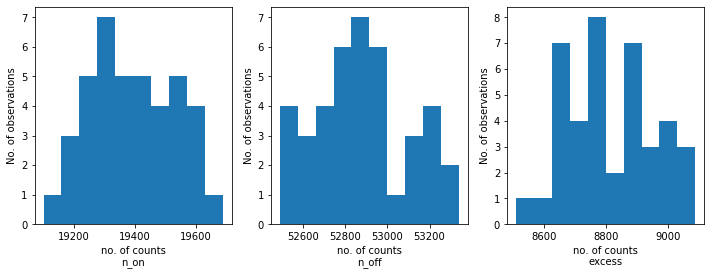

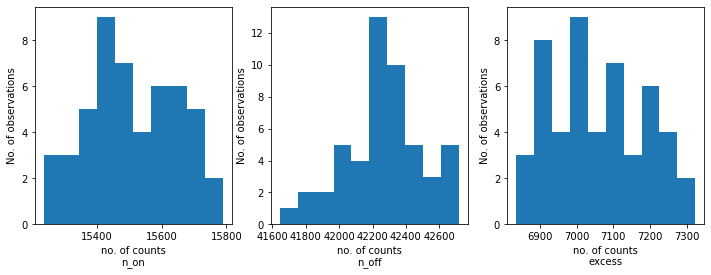

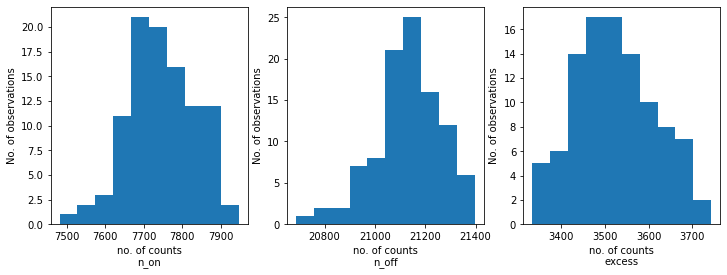

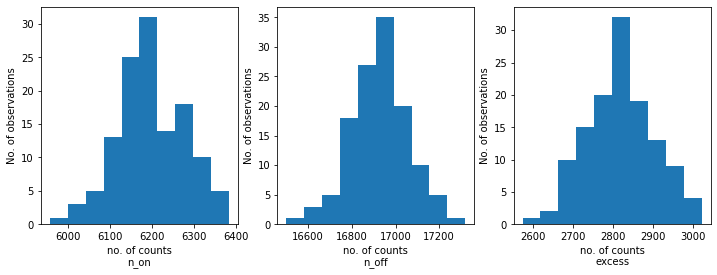

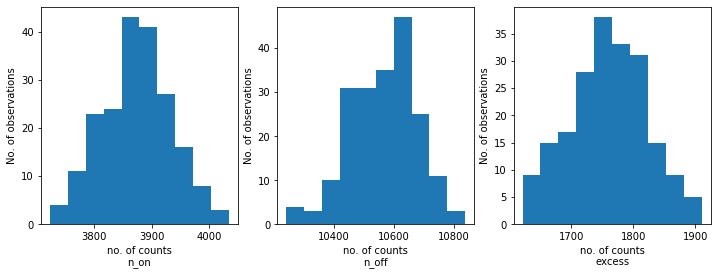

...

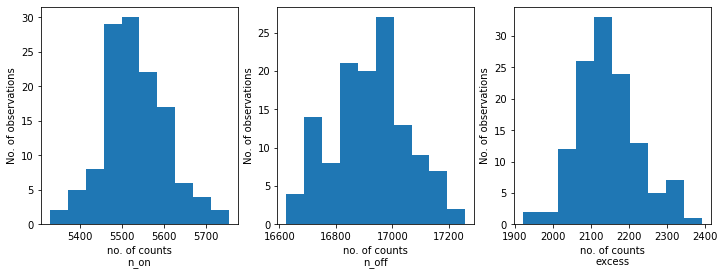

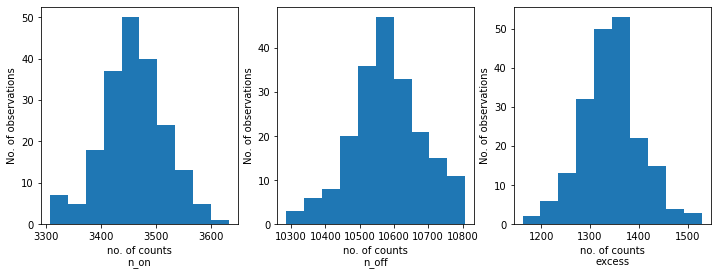

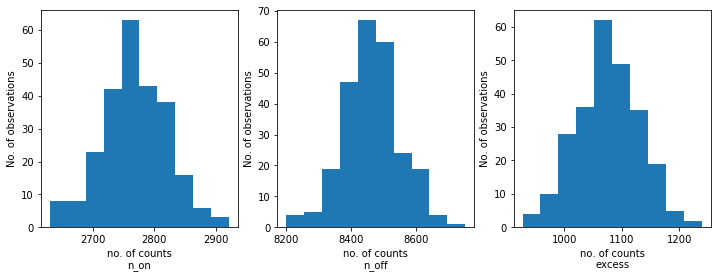

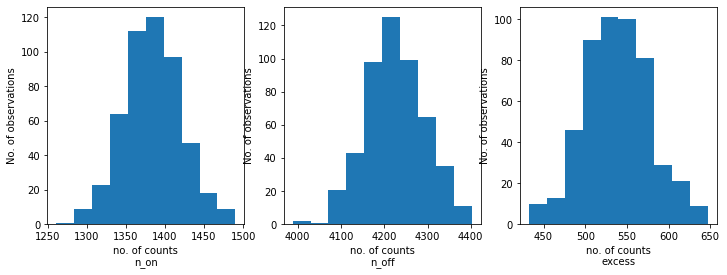

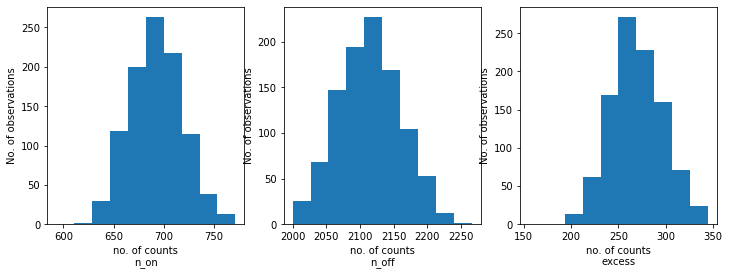

In [16]:
for j in range(6):
    for i in range(8):
        n_on = [dataset.counts.data.sum() for dataset in datas[i][j]]
        n_off = [dataset.counts_off.data.sum() for dataset in datas[i][j]]
        excess = [dataset.excess.data.sum() for dataset in datas[i][j]]
        
        fix, axes = plt.subplots(1, 3, figsize=(12, 4))
        axes[0].hist(n_on)
        axes[0].set_xlabel("no. of counts\nn_on")
        axes[0].set_ylabel("No. of observations")
        axes[1].hist(n_off)
        axes[1].set_xlabel("no. of counts\nn_off")
        axes[1].set_ylabel("No. of observations")
        axes[2].hist(excess)
        axes[2].set_xlabel("no. of counts\nexcess");
        axes[2].set_ylabel("No. of observations")

In [17]:
%%time
res = [[0 for i in range(cols)] for j in range(rows)]
for i in range(8):
    results = []
    for dataset in datas[i][0]:
        dataset.models = model[i][0].copy()
        fit = Fit([dataset])
        result = fit.optimize()
        results.append(
            {
                "index": result.parameters["index"].value,
                "amplitude": result.parameters["amplitude"].value,
                "reference":result.parameters["reference"].value,
            }
        )
        print(result.parameters.to_table())
    res[i][0]=results

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.315e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.246e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.312e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.350e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.295e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.261e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.294e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.326e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.327e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.275e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.296e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.297e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.287e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.244e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.209e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.352e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.301e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.262e+00   nan                nan nan  False
amplitude 1.253e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.270e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.291e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.167e+00   nan                nan nan  False
amplitude 1.296e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.197e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.343e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.331e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.222e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.322e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.295e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.334e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.276e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.260e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.228e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.256e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.182e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.253e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.317e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.267e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.252e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.347e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.237e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.347e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.344e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.336e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.199e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.317e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.218e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.217e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.314e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.386e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.141e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.395e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.272e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.345e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.214e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.314e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.173e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.199e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.170e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.331e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.380e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.355e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.383e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.252e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.453e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.264e+00   nan                nan nan  False
amplitude 1.291e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.326e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.367e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.260e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.296e+00   nan                nan nan  False
amplitude 1.233e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.234e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.134e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.135e+00   nan                nan nan  False
amplitude 1.357e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.264e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.359e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.183e+00   nan                nan nan  False
amplitude 1.181e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.371e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.357e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.253e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.153e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.335e+00   nan                nan nan  False
amplitude 1.200e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.280e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.327e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.138e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.239e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.300e+00   nan                nan nan  False
amplitude 1.192e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan  False
amplitude 1.206e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.325e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.281e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.113e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.356e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.149e+00   nan                nan nan  False
amplitude 1.387e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.176e+00   nan                nan nan  False
amplitude 1.376e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.194e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.305e+00   nan                nan nan  False
amplitude 1.175e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.248e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.204e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.197e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.427e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.156e+00   nan                nan nan  False
amplitude 1.436e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.354e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.144e+00   nan                nan nan  False
amplitude 1.496e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.410e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.502e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.104e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.317e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.275e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.235e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.179e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.175e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.269e+00   nan                nan nan  False
amplitude 1.172e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.126e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.199e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.432e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.175e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.237e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.300e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.170e+00   nan                nan nan  False
amplitude 1.430e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.270e+00   nan                nan nan  False
amplitude 1.218e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.176e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.234e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.305e+00   nan                nan nan  False
amplitude 1.132e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.131e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.123e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.271e+00   nan                nan nan  False
amplitude 1.275e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.290e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.348e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.309e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.354e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.161e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.345e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.254e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.373e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.348e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.324e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.289e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.344e+00   nan                nan nan  False
amplitude 1.100e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.280e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.170e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.295e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.444e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.325e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.158e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.117e+00   nan                nan nan  False
amplitude 1.248e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.164e+00   nan                nan nan  False
amplitude 1.357e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.243e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.159e+00   nan                nan nan  False
amplitude 1.106e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.520e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.463e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.242e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.279e+00   nan                nan nan  False
amplitude 1.058e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.416e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.164e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.206e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.262e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.302e+00   nan                nan nan  False
amplitude 1.209e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.249e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.296e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.301e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.259e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.305e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.349e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.370e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.314e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.281e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.208e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.423e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.256e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.244e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.312e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.190e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan

In [18]:
for j in range(5):
    for i in range(8):
        results = []
        for dataset in datas[i][j+1]:
            dataset.models = model[i][j+1].copy()
            fit = Fit([dataset])
            result = fit.optimize()
            results.append(
                {
                    "index": result.parameters["index"].value,
                    "amplitude": result.parameters["amplitude"].value,
                    "lambda_": result.parameters["lambda_"].value,
                    "reference":result.parameters["reference"].value,
                    "alpha":result.parameters["alpha"].value,
                }
            )
            print(result.parameters.to_table())
        res[i][j+1]=results

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.353e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.759e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.273e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.385e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.243e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.716e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.275e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.128e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.239e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.514e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.271e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.100e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.272e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.758e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.296e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.871e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.308e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.300e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.155e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.306e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.444e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.267e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.276e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.286e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.219e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.253e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.292e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.231e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.270e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.607e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.258e+00   nan                nan nan  False
amplitude  1.208e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.261e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.760e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.492e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.096e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.383e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.359e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.291e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.407e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.869e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.286e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.751e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.256e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.211e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.059e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.561e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.199e+00   nan                nan nan  False
amplitude  1.271e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.344e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.295e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.332e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.734e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.714e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.364e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.915e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.356e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.922e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.261e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.317e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.277e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.389e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.228e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.238e+00   nan                nan nan  False
amplitude  1.249e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.180e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.155e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.355e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.264e+00   nan                nan nan  False
amplitude 1.219e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.036e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.678e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.330e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.380e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.200e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.262e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.292e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.185e+00   nan                nan nan  False
amplitude 1.350e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.228e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.338e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.271e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.788e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.414e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.145e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.323e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.215e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.052e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.166e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.815e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.377e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.172e+00   nan                nan nan  False
amplitude 1.325e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.424e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.533e-04   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.240e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.246e+00   nan                nan nan  False
amplitude  1.241e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -5.197e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.638e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.274e+00   nan                nan nan  False
amplitude  1.178e-12   nan cm-2 s-1 Te

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.399e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.987e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.255e+00   nan                nan nan  False
amplitude  1.155e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -2.117e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.216e+00   nan                nan nan  False
amplitude  1.284e-12   nan cm-2 s-1 Te

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.274e+00   nan                nan nan  False
amplitude  1.262e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -5.238e-04   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.202e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.257e+00   nan                nan nan  False
amplitude  1.224e-12   nan cm-2 s-1 Te

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.242e+00   nan                nan nan  False
amplitude  1.259e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.231e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.447e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.429e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.250e+00   nan                nan nan  False
amplitude  1.155e-12   nan cm-2 s-1 Te

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.237e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.150e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.441e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.315e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.308e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.432e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.324e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.291e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.909e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.307e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.281e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.452e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.930e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.248e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.215e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.386e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.471e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.378e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.794e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.142e+00   nan                nan nan  False
amplitude 1.441e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.420e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.919e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.234e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.343e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.888e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.922e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.271e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.354e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.458e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.315e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.878e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.268e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.251e+00   nan                nan nan  False
amplitude  1.257e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.892e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.351e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.522e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.818e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.306e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.518e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.291e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.277e+00   nan                nan nan  False
amplitude  1.257e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -4.983e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.265e+00   nan                nan nan  False
amplitude  1.193e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.211e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.274e+00   nan                nan nan  False
amplitude  1.207e-12   nan cm-2

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.180e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.221e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.048e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.369e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.112e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.291e+00   nan                nan nan  False
amplitude  1.092e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.592e-02   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.179e+00   nan                nan nan  False
amplitude 1.379e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.160e+00   nan                nan nan  False
amplitude 1.252e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.887e-04   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.183e+00   nan                nan nan  False
amplitude 1.390e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.723e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.152e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.280e+00   nan                nan nan  False
amplitude  1.131e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.015e-02   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.345e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.144e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.279e+00   nan                nan nan  False
amplitude  1.153e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.332e-02   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.288e+00   nan                nan nan  False
amplitude  1.228e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.635e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.172e+00   nan                nan nan  False
amplitude 1.431e-12   nan cm-2 s-1

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.289e+00   nan                nan nan  False
amplitude  1.130e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -5.805e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.176e+00   nan                nan nan  False
amplitude 1.383e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.359e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.239e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.170e+00   nan                nan nan  False
amplitude 1.394e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.936e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.280e+00   nan                nan nan  False
amplitude  1.161e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.015e-02   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.386e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.169e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.306e+00   nan                nan nan  False
amplitude  1.101e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.455e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.139e+00   nan                nan nan  False
amplitude 1.354e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.247e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.195e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.290e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.869e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.264e+00   nan                nan nan  False
amplitude  1.156e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.139e+00   nan                nan nan  False
amplitude 1.353e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.968e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.179e+00   nan                nan nan  False
amplitude 1.412e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.805e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.340e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.317e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.904e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.256e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.470e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.221e+00   nan                nan nan  False
amplitude  1.281e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.257e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.970e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.268e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.190e-04   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.111e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.267e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.797e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.159e+00   nan                nan nan  False
amplitude 1.386e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.128e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.098e+00   nan                nan nan  False
amplitude 1.669e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.256e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.517e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.415e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.353e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.365e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.539e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.797e-04   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.256e+00   nan                nan nan  False
amplitude  1.262e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.351e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.115e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.248e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.111e+00   nan                nan nan  False
amplitude 1.340e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.497e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.180e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.032e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.517e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.401e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.122e+00   nan                nan nan  False
amplitude 1.469e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.708e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.293e+00   nan                nan nan  False
amplitude 1.237e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.357e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.930e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.844e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.153e+00   nan                nan nan  False
amplitude 1.371e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.355e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.305e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.174e+00   nan                nan nan  False
amplitude 1.295e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.086e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.204e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.436e-04   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.206e+00   nan                nan nan  False
amplitude  1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -3.410e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.149e+00   nan                nan nan  False
amplitude 1.268e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.698e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.249e+00   nan                nan nan  False
amplitude  1.127e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -3.486e-04   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.341e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.078e+00   nan                nan nan  False
amplitude 1.349e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.670e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.308e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.636e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.298e+00   nan                nan nan  False
amplitude  1.251e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.153e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.515e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.372e+00   nan                nan nan  False
amplitude  1.118e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.187e-02   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.335e-12   nan cm-2 s-1 TeV-1 

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.272e+00   nan                nan nan  False
amplitude  1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -8.120e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.098e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.367e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.325e+00   nan                nan nan  False
amplitude  1.127e-12   nan cm-2 s-1 Te

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.248e+00   nan                nan nan  False
amplitude  1.226e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.291e-02   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.438e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.787e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.284e+00   nan                nan nan  False
amplitude  1.115e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -9.963e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.497e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.479e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.232e+00   nan                nan nan  False
amplitude  1.099e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.912e-02   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan  False
amplitude 1.238e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.429e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.233e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.030e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.152e+00   nan                nan nan  False
amplitude 1.220e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.801e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.179e+00   nan                nan nan  False
amplitude  1.298e-12   nan cm-2 s-1 TeV-1 nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.192e+00   nan                nan nan  False
amplitude  1.355e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -8.536e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.782e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.210e+00   nan                nan nan  False
amplitude  1.374e-12   nan cm-2 s-1 Te

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.167e+00   nan                nan nan  False
amplitude 1.470e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.289e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.214e+00   nan                nan nan  False
amplitude  1.410e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -3.485e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.411e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.620e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.336e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.644e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.338e+00   nan                nan nan  False
amplitude  1.125e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.147e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.153e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.283e+00   nan                nan nan  False
amplitude  1.117e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -2.397e-02   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.130e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.176e+00   nan                nan nan  False
amplitude  1.322e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -3.247e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.151e+00   nan                nan nan  False
amplitude 1.425e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.043e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.301e+00   nan                nan nan  False
amplitude  1.174e-12   nan cm-2 s-1 Te

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.179e+00   nan                nan nan  False
amplitude 1.309e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.599e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.294e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.122e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.364e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.312e+00   nan                nan nan  False
amplitude 1.121e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.318e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.298e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.055e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.401e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.418e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.340e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.540e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan  False
amplitude 1.183e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.298e+00   nan                nan nan  False
amplitude  1.334e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -2.419e-02   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.294e+00   nan                nan nan  False
amplitude 1.178e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.628e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.565e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.371e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.503e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.002e+00   nan                nan nan  False
amplitude 1.840e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.418e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.200e+00   nan                nan nan  False
amplitude  1.420e-12   nan cm-2 s-1 TeV-1 nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.295e+00   nan                nan nan  False
amplitude  1.115e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -9.644e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.520e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.357e+00   nan                nan nan  False
amplitude  1.095e-12   nan cm-2 s-1 Te

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.264e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.240e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.324e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.212e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.172e+00   nan                nan nan  False
amplitude 1.335e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.168e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.311e+00   nan                nan nan  False
amplitude 1.165e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.366e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.082e+00   nan                nan nan  False
amplitude 1.596e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.214e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.112e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.271e+00   nan                nan nan  False
amplitude  1.221e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.641e-02   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.289e+00   nan                nan nan  False
amplitude  9.778e-13   nan cm-2 s-1 Te

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.384e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.125e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.577e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.860e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.239e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.819e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.208e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.415e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.465e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.101e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.283e+00   nan                nan nan  False
amplitude 1.202e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.099e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.463e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.098e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.865e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.147e+00   nan                nan nan  False
amplitude 1.390e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.038e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.432e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.164e+00   nan                nan nan  False
amplitude 1.639e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.642e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.965e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.429e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.146e+00   nan                nan nan  False
amplitude 1.507e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.560e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.268e+00   nan                nan nan  False
amplitude 1.203e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.511e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.359e+00   nan                nan nan  False
amplitude  1.042e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -2.854e-02   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.362e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.306e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.128e+00   nan                nan nan  False
amplitude 1.462e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.270e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.087e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.260e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.945e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.521e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.449e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.478e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.176e+00   nan                nan nan  False
amplitude 1.533e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.572e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.405e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.253e+00   nan                nan nan  False
amplitude  1.307e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -6.910e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.223e+00   nan                nan nan  False
amplitude  1.273e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -5.519e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.207e+00   nan                nan nan  False
amplitude  1.250e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.094e-02   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.099e+00   nan                nan nan  False
amplitude 1.401e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.301e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.327e+00   nan                nan nan  False
amplitude  1.049e-12   nan cm-2 s-1 Te

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.111e+00   nan                nan nan  False
amplitude 1.570e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.347e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.504e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.142e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.132e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan  False
amplitude 1.538e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.384e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.175e+00   nan                nan nan  False
amplitude  1.320e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -5.487e-04   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.298e+00   nan                nan nan  False
amplitude 1.206e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.122e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.131e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.320e+00   nan                nan nan  False
amplitude 1.208e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.796e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.371e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.456e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.082e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.138e+00   nan                nan nan  False
amplitude 1.448e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.023e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.330e+00   nan                nan nan  False
amplitude  1.043e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -7.752e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.398e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.723e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.141e+00   nan                nan nan  False
amplitude 1.422e-12   nan cm-2 s-1 TeV-1 

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.316e+00   nan                nan nan  False
amplitude  1.231e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.431e-02   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.454e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.050e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.344e-12   nan cm-2 s-1 TeV-1 

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.253e+00   nan                nan nan  False
amplitude  1.172e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.967e-03   nan          TeV-1 nan nan  False
    alpha  1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.383e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.502e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.280e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.608e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.044e+00   nan                nan nan  False
amplitude 1.347e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.079e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.280e+00   nan                nan nan  False
amplitude  9.531e-13   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.257e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.761e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.194e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.598e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.153e+00   nan                nan nan  False
amplitude 1.215e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.174e+00   nan                nan nan  False
amplitude 1.252e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.392e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.289e+00   nan                nan nan  False
amplitude 1.177e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.227e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.434e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.239e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.012e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.075e+00   nan                nan nan  False
amplitude 1.376e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.562e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.324e+00   nan                nan nan  False
amplitude 1.160e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan  False
amplitude 1.404e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.158e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.131e+00   nan                nan nan  False
amplitude 1.473e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.678e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.084e+00   nan                nan nan  False
amplitude 1.432e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.315e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.961e-03   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.049e+00   nan                nan nan  False
amplitude 1.529e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.210e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.641e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.199e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.385e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.166e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.227e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.292e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.000e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.372e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.247e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.322e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.277e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.633e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.341e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.129e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.257e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.280e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.205e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.478e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.327e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.217e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.891e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.100e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.156e+00   nan                nan nan  False
amplitude 1.452e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.243e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.253e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.966e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.150e+00   nan                nan nan  False
amplitude 1.407e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.361e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.424e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.301e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.243e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.390e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.617e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.593e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan  False
amplitude 1.207e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.242e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.132e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.210e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.482e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.239e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.189e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.286e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.814e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.191e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.176e+00   nan                nan nan  False
amplitude 1.368e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.357e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.336e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.289e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.254e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.239e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.172e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.340e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.196e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.287e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.324e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.068e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.085e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.976e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.382e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.235e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.271e+00   nan                nan nan  False
amplitude 1.259e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.158e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.136e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.241e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.216e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.396e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.374e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.164e+00   nan                nan nan  False
amplitude 1.403e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.260e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.277e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.168e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.328e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.052e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.344e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.384e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.316e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.323e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.093e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.232e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.242e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.052e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.387e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.228e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.403e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.367e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.204e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.425e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.506e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.077e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.133e+00   nan                nan nan  False
amplitude 1.472e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.583e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.359e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.376e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.211e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.164e+00   nan                nan nan  False
amplitude 1.511e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.510e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.125e+00   nan                nan nan  False
amplitude 1.510e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.538e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.355e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.170e+00   nan                nan nan  False
amplitude 1.435e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.521e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.215e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.133e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.145e+00   nan                nan nan  False
amplitude 1.430e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.246e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.162e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.187e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.507e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.271e+00   nan                nan nan  False
amplitude 1.261e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.216e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.050e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.228e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.390e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.204e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.694e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.426e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.432e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.174e+00   nan                nan nan  False
amplitude 1.449e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.247e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.149e+00   nan                nan nan  False
amplitude 1.398e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.460e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.391e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.224e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.091e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.136e+00   nan                nan nan  False
amplitude 1.517e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.572e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.003e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.262e+00   nan                nan nan  False
amplitude 1.280e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.984e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.371e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.430e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.814e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.231e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.630e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.119e+00   nan                nan nan  False
amplitude 1.488e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.163e+00   nan                nan nan  False
amplitude 1.335e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.461e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.409e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.138e+00   nan                nan nan  False
amplitude 1.518e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.279e+00   nan                nan nan  False
amplitude 1.210e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.094e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.345e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.324e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan  False
amplitude 1.447e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.272e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.308e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.136e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.302e+00   nan                nan nan  False
amplitude 1.173e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.511e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.054e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.164e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.133e+00   nan                nan nan  False
amplitude 1.491e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.746e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.355e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.064e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.165e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.901e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.217e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.214e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.299e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.344e+00   nan                nan nan  False
amplitude 1.081e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.960e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.460e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.451e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.265e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.402e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.325e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.323e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.131e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.218e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.289e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.334e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.173e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.326e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.400e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.274e+00   nan                nan nan  False
amplitude 1.046e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.136e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.448e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.069e+00   nan                nan nan  False
amplitude 1.532e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.838e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.124e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.142e+00   nan                nan nan  False
amplitude 1.520e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.309e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.298e+00   nan                nan nan  False
amplitude 1.164e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.118e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.363e+00   nan                nan nan  False
amplitude 9.814e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.096e+00   nan                nan nan  False
amplitude 1.580e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.346e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.281e+00   nan                nan nan  False
amplitude 1.180e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.761e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.167e+00   nan                nan nan  False
amplitude 1.406e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.189e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.829e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.315e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.227e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.315e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.294e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.363e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.140e+00   nan                nan nan  False
amplitude 1.497e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.398e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.088e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.079e+00   nan                nan nan  False
amplitude 1.640e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.974e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.307e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.763e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.103e+00   nan                nan nan  False
amplitude 1.405e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.487e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.632e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.149e+00   nan                nan nan  False
amplitude 1.509e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.217e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.134e+00   nan                nan nan  False
amplitude 1.423e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.341e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.901e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.127e+00   nan                nan nan  False
amplitude 1.400e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.540e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.154e+00   nan                nan nan  False
amplitude 1.465e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.212e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.282e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.234e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.158e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.356e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.214e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.010e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.361e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.910e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.148e+00   nan                nan nan  False
amplitude 1.345e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.301e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.115e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.112e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.172e+00   nan                nan nan  False
amplitude 1.378e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.159e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.581e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.038e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.183e+00   nan                nan nan  False
amplitude 1.398e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.737e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.290e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.401e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.247e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.118e+00   nan                nan nan  False
amplitude 1.646e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.457e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.294e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.170e+00   nan                nan nan  False
amplitude 1.351e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.262e+00   nan                nan nan  False
amplitude 1.172e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.593e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.047e+00   nan                nan nan  False
amplitude 1.847e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.437e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.149e+00   nan                nan nan  False
amplitude 1.589e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.309e+00   nan                nan nan  False
amplitude 1.179e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.186e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.127e+00   nan                nan nan  False
amplitude 1.386e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.094e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.347e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.322e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.183e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.275e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.893e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.184e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.276e+00   nan                nan nan  False
amplitude 1.204e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.555e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.097e+00   nan                nan nan  False
amplitude 1.574e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.988e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.182e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.386e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.598e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.323e+00   nan                nan nan  False
amplitude 1.207e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.708e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.141e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.395e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.452e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.107e+00   nan                nan nan  False
amplitude 1.447e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.768e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.164e+00   nan                nan nan  False
amplitude 1.373e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.461e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.300e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.188e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.852e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.323e+00   nan                nan nan  False
amplitude 1.034e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.167e+00   nan                nan nan  False
amplitude 1.317e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.418e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.137e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.251e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.137e+00   nan                nan nan  False
amplitude 1.450e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.429e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.754e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.359e+00   nan                nan nan  False
amplitude 9.548e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.933e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.148e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.050e+00   nan                nan nan  False
amplitude 1.524e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.749e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.223e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.267e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.381e+00   nan                nan nan  False
amplitude 1.073e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.949e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.409e+00   nan                nan nan  False
amplitude 9.557e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.546e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.457e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.497e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.268e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.164e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.809e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.306e+00   nan                nan nan  False
amplitude 1.126e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.374e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.391e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.163e+00   nan                nan nan  False
amplitude 1.463e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.091e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.210e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.990e+00   nan                nan nan  False
amplitude 1.696e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.100e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.064e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.266e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.151e+00   nan                nan nan  False
amplitude 1.376e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.218e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.322e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.160e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.972e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.262e+00   nan                nan nan  False
amplitude 1.365e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.154e+00   nan                nan nan  False
amplitude 1.540e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.358e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.114e+00   nan                nan nan  False
amplitude 1.464e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.987e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.476e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.678e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.034e+00   nan                nan nan  False
amplitude 1.423e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.615e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.399e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.204e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.200e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.320e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.434e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.302e+00   nan                nan nan  False
amplitude 1.134e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.659e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.341e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.299e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.099e+00   nan                nan nan  False
amplitude 1.488e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.307e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.947e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.296e+00   nan                nan nan  False
amplitude 1.280e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.526e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.428e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.248e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.477e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.336e+00   nan                nan nan  False
amplitude 1.056e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.130e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.484e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.300e+00   nan                nan nan  False
amplitude 1.106e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.368e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.144e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.116e+00   nan                nan nan  False
amplitude 1.831e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.575e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.296e+00   nan                nan nan  False
amplitude 1.184e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.078e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.154e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.358e+00   nan                nan nan  False
amplitude 1.001e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.084e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.032e+00   nan                nan nan  False
amplitude 1.923e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.785e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.645e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.097e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.919e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.380e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.618e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.934e+00   nan                nan nan  False
amplitude 1.991e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.906e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.122e+00   nan                nan nan  False
amplitude 1.307e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.080e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.063e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.301e+00   nan                nan nan  False
amplitude 1.167e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.430e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.298e+00   nan                nan nan  False
amplitude 1.132e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.142e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.183e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.298e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.730e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.629e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.808e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.138e+00   nan                nan nan  False
amplitude 1.404e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.487e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.499e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.074e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.299e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.222e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.285e+00   nan                nan nan  False
amplitude 1.157e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.368e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.370e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.424e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.497e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.106e+00   nan                nan nan  False
amplitude 1.377e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.540e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.385e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.225e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.133e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.408e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.024e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.097e+00   nan                nan nan  False
amplitude 1.629e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.943e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.186e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.069e+00   nan                nan nan  False
amplitude 1.538e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.188e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.285e+00   nan                nan nan  False
amplitude 9.937e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.758e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.428e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.079e+00   nan                nan nan  False
amplitude 1.394e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.449e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.313e+00   nan                nan nan  False
amplitude 1.144e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.853e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.133e+00   nan                nan nan  False
amplitude 1.465e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.276e+00   nan                nan nan  False
amplitude 1.067e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.983e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.179e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.659e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.163e+00   nan                nan nan  False
amplitude 1.328e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.163e+00   nan                nan nan  False
amplitude 1.672e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.643e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.363e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.033e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.119e+00   nan                nan nan  False
amplitude 1.501e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.312e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.400e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.211e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.452e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.337e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.418e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.750e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.352e+00   nan                nan nan  False
amplitude 9.928e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.159e+00   nan                nan nan  False
amplitude 1.158e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.040e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.109e+00   nan                nan nan  False
amplitude 1.490e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.575e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.869e+00   nan                nan nan  False
amplitude 2.033e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.062e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.283e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.152e+00   nan                nan nan  False
amplitude 1.325e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.654e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.186e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.112e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.103e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.149e+00   nan                nan nan  False
amplitude 1.547e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.974e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.936e+00   nan                nan nan  False
amplitude 1.815e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.075e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.152e+00   nan                nan nan  False
amplitude 1.435e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.664e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan  False
amplitude 1.190e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.567e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.587e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.208e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.152e+00   nan                nan nan  False
amplitude 1.246e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.152e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.241e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.282e+00   nan                nan nan  False
amplitude 1.232e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.526e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.135e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.297e+00   nan                nan nan  False
amplitude 1.126e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.466e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.714e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.140e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.008e+00   nan                nan nan  False
amplitude 1.799e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.537e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.180e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.187e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.430e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.423e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.256e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.433e+00   nan                nan nan  False
amplitude 1.119e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.375e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.067e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.370e+00   nan                nan nan  False
amplitude 9.333e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.794e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.302e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.575e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.422e+00   nan                nan nan  False
amplitude 9.746e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.322e+00   nan                nan nan  False
amplitude 1.102e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.383e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.146e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.344e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.259e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.042e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.877e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.254e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.275e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.933e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.198e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.350e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.211e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.628e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.914e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.260e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.114e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.183e+00   nan                nan nan  False
amplitude 1.421e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.551e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.298e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan  False
amplitude 1.427e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.411e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.222e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.926e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.249e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.672e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.262e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.774e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.226e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.704e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.316e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.070e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.166e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.426e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.870e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.173e+00   nan                nan nan  False
amplitude 1.391e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.518e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.354e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.863e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.230e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.862e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.179e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.468e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.439e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.412e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.108e+00   nan                nan nan  False
amplitude 1.648e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.226e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.753e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.789e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.132e+00   nan                nan nan  False
amplitude 1.553e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.344e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.390e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.230e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.771e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.383e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.140e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.342e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.240e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.071e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.182e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.174e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.626e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.292e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.920e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.234e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.849e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.428e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.408e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.218e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.183e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.608e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.284e+00   nan                nan nan  False
amplitude 1.200e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.575e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.216e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.527e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.373e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.148e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.146e+00   nan                nan nan  False
amplitude 1.590e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.009e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.212e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.439e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.269e+00   nan                nan nan  False
amplitude 1.184e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.294e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.859e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.114e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.128e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.254e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.829e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.278e+00   nan                nan nan  False
amplitude 1.167e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.976e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.314e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.132e+00   nan                nan nan  False
amplitude 1.414e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.314e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.257e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.099e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.441e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.315e+00   nan                nan nan  False
amplitude 1.144e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.385e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.371e+00   nan                nan nan  False
amplitude 1.027e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.257e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.323e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.447e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.174e+00   nan                nan nan  False
amplitude 1.404e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.502e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.308e+00   nan                nan nan  False
amplitude 1.113e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.336e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.035e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.277e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.045e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.279e+00   nan                nan nan  False
amplitude 1.158e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.315e+00   nan                nan nan  False
amplitude 1.043e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.111e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.414e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.268e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.185e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.289e+00   nan                nan nan  False
amplitude 1.104e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.258e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.315e+00   nan                nan nan  False
amplitude 1.136e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.451e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.255e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.209e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.803e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.374e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.656e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.442e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.295e+00   nan                nan nan  False
amplitude 1.231e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.082e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.220e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.155e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.301e+00   nan                nan nan  False
amplitude 1.175e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.380e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.633e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.371e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.243e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.306e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.082e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.250e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.147e+00   nan                nan nan  False
amplitude 1.365e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.766e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.141e+00   nan                nan nan  False
amplitude 1.484e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.314e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.301e+00   nan                nan nan  False
amplitude 1.203e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.162e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.958e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.128e+00   nan                nan nan  False
amplitude 1.538e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.512e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.342e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.234e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.834e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.195e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.687e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.355e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.276e+00   nan                nan nan  False
amplitude 1.200e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.715e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.443e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.130e+00   nan                nan nan  False
amplitude 1.442e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.179e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.885e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.048e+00   nan                nan nan  False
amplitude 1.695e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.645e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.202e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.209e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.536e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.257e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.939e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.137e+00   nan                nan nan  False
amplitude 1.328e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.307e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.665e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.064e+00   nan                nan nan  False
amplitude 1.725e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.549e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.151e+00   nan                nan nan  False
amplitude 1.685e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.297e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.346e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.776e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.253e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.335e+00   nan                nan nan  False
amplitude 1.067e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.438e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.104e+00   nan                nan nan  False
amplitude 1.449e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.779e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.122e+00   nan                nan nan  False
amplitude 1.573e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.423e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.518e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.237e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.407e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.331e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.008e+00   nan                nan nan  False
amplitude 1.983e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.636e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.307e+00   nan                nan nan  False
amplitude 9.582e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.106e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.351e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.121e+00   nan                nan nan  False
amplitude 1.722e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.955e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.347e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.171e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.314e+00   nan                nan nan  False
amplitude 1.022e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.150e+00   nan                nan nan  False
amplitude 1.322e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.852e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.295e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.608e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan  False
amplitude 1.198e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.378e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.064e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.200e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.826e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.010e+00   nan                nan nan  False
amplitude 1.744e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.234e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.075e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.397e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.717e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.275e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.341e+00   nan                nan nan  False
amplitude 1.028e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.439e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.535e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.312e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.116e+00   nan                nan nan  False
amplitude 1.504e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.717e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.516e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.981e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.301e+00   nan                nan nan  False
amplitude 1.147e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.212e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.325e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.246e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.772e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.457e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.249e+00   nan                nan nan  False
amplitude 1.357e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.027e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.567e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.092e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.296e+00   nan                nan nan  False
amplitude 1.075e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.234e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.148e+00   nan                nan nan  False
amplitude 1.435e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.324e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.534e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.406e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.575e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.354e+00   nan                nan nan  False
amplitude 8.734e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.120e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.106e+00   nan                nan nan  False
amplitude 1.652e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.515e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.672e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.149e+00   nan                nan nan  False
amplitude 1.602e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.697e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.314e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.399e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.498e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.146e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.733e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.290e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.115e+00   nan                nan nan  False
amplitude 1.709e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.101e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.127e+00   nan                nan nan  False
amplitude 1.307e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.463e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.243e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.039e+00   nan                nan nan  False
amplitude 2.028e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.272e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.335e+00   nan                nan nan  False
amplitude 1.006e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.564e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.126e+00   nan                nan nan  False
amplitude 1.480e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.185e+00   nan                nan nan  False
amplitude 1.328e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.301e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.067e+00   nan                nan nan  False
amplitude 1.661e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.974e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.329e+00   nan                nan nan  False
amplitude 9.678e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.392e+00   nan                nan nan  False
amplitude 8.893e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.245e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.312e+00   nan                nan nan  False
amplitude 1.029e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.072e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.068e+00   nan                nan nan  False
amplitude 1.795e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.121e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.443e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.432e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.467e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.317e+00   nan                nan nan  False
amplitude 1.082e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.285e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.227e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.154e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan  False
amplitude 1.189e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.319e+00   nan                nan nan  False
amplitude 1.212e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.548e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.335e+00   nan                nan nan  False
amplitude 9.571e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.584e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.320e+00   nan                nan nan  False
amplitude 1.162e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.096e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.654e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.109e+00   nan                nan nan  False
amplitude 1.621e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.536e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.163e+00   nan                nan nan  False
amplitude 1.368e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.432e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.630e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.609e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.785e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.097e+00   nan                nan nan  False
amplitude 1.559e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.410e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.538e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.284e+00   nan                nan nan  False
amplitude 1.037e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.622e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.318e+00   nan                nan nan  False
amplitude 1.108e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.339e+00   nan                nan nan  False
amplitude 1.012e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.087e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.188e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.377e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.390e+00   nan                nan nan  False
amplitude 1.033e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.005e+00   nan                nan nan  False
amplitude 1.623e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.251e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.075e+00   nan                nan nan  False
amplitude 1.492e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.290e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.254e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.000e+00   nan                nan nan  False
amplitude 1.972e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.788e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.348e+00   nan                nan nan  False
amplitude 9.873e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.141e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.149e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.440e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.644e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.002e+00   nan                nan nan  False
amplitude 1.859e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.202e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.102e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.254e+00   nan                nan nan  False
amplitude 1.463e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.471e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.347e+00   nan                nan nan  False
amplitude 1.097e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.867e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.309e+00   nan                nan nan  False
amplitude 1.319e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.424e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.415e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.326e+00   nan                nan nan  False
amplitude 1.079e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.212e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.084e+00   nan                nan nan  False
amplitude 1.434e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.055e+00   nan                nan nan  False
amplitude 1.953e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.068e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.062e+00   nan                nan nan  False
amplitude 1.521e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.945e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.464e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.183e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.594e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.359e+00   nan                nan nan  False
amplitude 8.995e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.050e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.305e+00   nan                nan nan  False
amplitude 1.076e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.269e+00   nan                nan nan  False
amplitude 1.149e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.344e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.356e+00   nan                nan nan  False
amplitude 1.053e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.247e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.384e+00   nan                nan nan  False
amplitude 1.050e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.325e+00   nan                nan nan  False
amplitude 9.838e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.697e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.160e+00   nan                nan nan  False
amplitude 1.693e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.143e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.135e+00   nan                nan nan  False
amplitude 1.598e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.145e+00   nan                nan nan  False
amplitude 1.446e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.522e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.070e+00   nan                nan nan  False
amplitude 1.588e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.732e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.517e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.342e+00   nan                nan nan  False
amplitude 1.064e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.204e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.327e+00   nan                nan nan  False
amplitude 1.187e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.586e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.160e+00   nan                nan nan  False
amplitude 1.596e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.208e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.626e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.050e+00   nan                nan nan  False
amplitude 1.753e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.905e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.445e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.024e+00   nan                nan nan  False
amplitude 1.443e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.813e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.309e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.294e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.164e+00   nan                nan nan  False
amplitude 1.233e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.228e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.190e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.063e+00   nan                nan nan  False
amplitude 1.812e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.160e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.302e+00   nan                nan nan  False
amplitude 1.151e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.109e+00   nan                nan nan  False
amplitude 1.668e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.779e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.173e+00   nan                nan nan  False
amplitude 1.464e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.989e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.339e+00   nan                nan nan  False
amplitude 9.240e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.111e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.454e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.478e+00   nan                nan nan  False
amplitude 7.882e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.969e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.907e+00   nan                nan nan  False
amplitude 2.342e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.328e+00   nan                nan nan  False
amplitude 1.031e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.182e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.991e+00   nan                nan nan  False
amplitude 2.313e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.483e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.326e+00   nan                nan nan  False
amplitude 1.006e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.014e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.291e+00   nan                nan nan  False
amplitude 1.109e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.361e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.097e+00   nan                nan nan  False
amplitude 1.601e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.104e+00   nan                nan nan  False
amplitude 1.764e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.601e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.342e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.491e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.968e+00   nan                nan nan  False
amplitude 1.941e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.147e+00   nan                nan nan  False
amplitude 1.460e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.853e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.993e+00   nan                nan nan  False
amplitude 1.711e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.201e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.376e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.339e+00   nan                nan nan  False
amplitude 1.056e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.032e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.827e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.031e+00   nan                nan nan  False
amplitude 1.611e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.248e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.250e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.063e+00   nan                nan nan  False
amplitude 1.849e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.312e+00   nan                nan nan  False
amplitude 1.046e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.269e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.056e+00   nan                nan nan  False
amplitude 1.543e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.372e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.961e+00   nan                nan nan  False
amplitude 2.144e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.347e+00   nan                nan nan  False
amplitude 1.022e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.301e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.147e+00   nan                nan nan  False
amplitude 1.401e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.403e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.117e+00   nan                nan nan  False
amplitude 1.586e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.256e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.151e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.524e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.002e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.295e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.287e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.754e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.118e+00   nan                nan nan  False
amplitude 1.778e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.135e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.299e+00   nan                nan nan  False
amplitude 1.023e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.912e+00   nan                nan nan  False
amplitude 2.092e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.713e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.354e+00   nan                nan nan  False
amplitude 1.013e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.139e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.219e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.363e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.537e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.097e+00   nan                nan nan  False
amplitude 1.563e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.093e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.064e+00   nan                nan nan  False
amplitude 1.694e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.117e+00   nan                nan nan  False
amplitude 1.585e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.550e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.292e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.926e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.040e+00   nan                nan nan  False
amplitude 1.758e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.109e+00   nan                nan nan  False
amplitude 1.423e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.343e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.286e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.584e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.054e+00   nan                nan nan  False
amplitude 1.520e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.041e+00   nan                nan nan  False
amplitude 2.045e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.075e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.296e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.120e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.059e+00   nan                nan nan  False
amplitude 1.539e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.868e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.075e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.491e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.292e+00   nan                nan nan  False
amplitude 1.164e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.207e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.592e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.274e+00   nan                nan nan  False
amplitude 1.272e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.079e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.321e+00   nan                nan nan  False
amplitude 1.071e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.175e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.286e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.120e+00   nan                nan nan  False
amplitude 1.555e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.090e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.127e+00   nan                nan nan  False
amplitude 1.510e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.331e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.186e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.098e+00   nan                nan nan  False
amplitude 1.590e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.480e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.173e+00   nan                nan nan  False
amplitude 1.449e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.167e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.533e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.070e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.259e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.133e+00   nan                nan nan  False
amplitude 1.417e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.040e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.339e+00   nan                nan nan  False
amplitude 1.146e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.012e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.075e+00   nan                nan nan  False
amplitude 1.566e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.408e+00   nan                nan nan  False
amplitude 9.489e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.598e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.112e+00   nan                nan nan  False
amplitude 1.256e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.633e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.274e+00   nan                nan nan  False
amplitude 1.301e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.187e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.512e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.391e+00   nan                nan nan  False
amplitude 1.008e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.276e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.312e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan  False
amplitude 1.378e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.813e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.145e+00   nan                nan nan  False
amplitude 1.440e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.515e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.150e+00   nan                nan nan  False
amplitude 1.510e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.223e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.852e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.049e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.353e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.206e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.351e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.254e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.327e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.324e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.130e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.276e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.851e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.296e+00   nan                nan nan  False
amplitude 1.095e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.397e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.525e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.124e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.347e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.545e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.214e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.223e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.192e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.482e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.215e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.347e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.287e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.273e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.791e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.170e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.558e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.252e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.341e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.258e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.344e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.987e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.216e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.276e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.628e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.916e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.235e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.222e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.588e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.156e+00   nan                nan nan  False
amplitude 1.452e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.755e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.105e+00   nan                nan nan  False
amplitude 1.644e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.310e+00   nan                nan nan  False
amplitude 1.127e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.470e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.388e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.302e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.133e+00   nan                nan nan  False
amplitude 1.461e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.121e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.367e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.450e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.271e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.220e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.751e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.204e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.324e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan  False
amplitude 1.056e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.319e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.749e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.238e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.671e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.282e+00   nan                nan nan  False
amplitude 1.153e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.676e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.216e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.693e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.174e+00   nan                nan nan  False
amplitude 1.468e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.151e+00   nan                nan nan  False
amplitude 1.393e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.256e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.154e+00   nan                nan nan  False
amplitude 1.387e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.262e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.398e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.247e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.094e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan  False
amplitude 1.167e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.906e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.151e+00   nan                nan nan  False
amplitude 1.468e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.163e+00   nan                nan nan  False
amplitude 1.470e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.444e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.386e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.355e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.212e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.302e+00   nan                nan nan  False
amplitude 1.135e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.492e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.249e+00   nan                nan nan  False
amplitude 1.169e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.853e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.169e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.361e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.546e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.550e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.169e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.156e+00   nan                nan nan  False
amplitude 1.469e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.949e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.115e+00   nan                nan nan  False
amplitude 1.644e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.022e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.179e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.085e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.179e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.773e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.298e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.314e+00   nan                nan nan  False
amplitude 1.048e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.386e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.176e+00   nan                nan nan  False
amplitude 1.400e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.842e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.361e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.296e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.014e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.187e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.066e+00   nan                nan nan  False
amplitude 1.651e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.637e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.322e+00   nan                nan nan  False
amplitude 1.078e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.643e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.286e+00   nan                nan nan  False
amplitude 1.226e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.185e+00   nan                nan nan  False
amplitude 1.400e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.771e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.431e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.330e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.125e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.041e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.294e+00   nan                nan nan  False
amplitude 1.069e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.309e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.960e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.488e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.440e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.123e+00   nan                nan nan  False
amplitude 1.548e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.335e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.200e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.427e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.203e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.119e+00   nan                nan nan  False
amplitude 1.531e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.415e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.287e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.120e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.331e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.146e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.580e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.436e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.281e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.125e+00   nan                nan nan  False
amplitude 1.495e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.616e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.176e+00   nan                nan nan  False
amplitude 1.340e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.152e+00   nan                nan nan  False
amplitude 1.455e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.668e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.205e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.781e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.255e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.191e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.286e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.466e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.058e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.096e+00   nan                nan nan  False
amplitude 1.531e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.358e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.580e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.084e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.993e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.348e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.347e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.923e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.297e+00   nan                nan nan  False
amplitude 1.088e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.933e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.349e+00   nan                nan nan  False
amplitude 1.033e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.351e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.412e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.017e+00   nan                nan nan  False
amplitude 1.968e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.461e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.380e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.886e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.307e+00   nan                nan nan  False
amplitude 1.158e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.635e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.171e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.516e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.143e+00   nan                nan nan  False
amplitude 1.580e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.178e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.040e+00   nan                nan nan  False
amplitude 2.114e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.202e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.587e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.332e+00   nan                nan nan  False
amplitude 9.992e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.269e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.131e+00   nan                nan nan  False
amplitude 1.387e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.152e+00   nan                nan nan  False
amplitude 1.470e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.396e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.534e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.364e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.173e+00   nan                nan nan  False
amplitude 1.621e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.210e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.143e+00   nan                nan nan  False
amplitude 1.561e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.817e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.988e+00   nan                nan nan  False
amplitude 1.739e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.953e+00   nan                nan nan  False
amplitude 2.086e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.907e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.350e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.065e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.119e+00   nan                nan nan  False
amplitude 1.688e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.307e+00   nan                nan nan  False
amplitude 1.257e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.704e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.302e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.949e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.101e+00   nan                nan nan  False
amplitude 1.708e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.294e+00   nan                nan nan  False
amplitude 1.259e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.989e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.240e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.766e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.150e+00   nan                nan nan  False
amplitude 1.571e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.252e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.409e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.329e+00   nan                nan nan  False
amplitude 9.894e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.109e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.125e+00   nan                nan nan  False
amplitude 1.456e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.638e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.748e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.387e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.440e+00   nan                nan nan  False
amplitude 8.688e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.294e+00   nan                nan nan  False
amplitude 1.070e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.358e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.301e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.981e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.174e+00   nan                nan nan  False
amplitude 1.465e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.332e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.811e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan  False
amplitude 1.219e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.232e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.368e+00   nan                nan nan  False
amplitude 1.052e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.115e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.123e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.995e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.070e+00   nan                nan nan  False
amplitude 1.930e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.075e+00   nan                nan nan  False
amplitude 1.798e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.229e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.380e+00   nan                nan nan  False
amplitude 8.365e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.517e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.141e+00   nan                nan nan  False
amplitude 1.529e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.331e+00   nan                nan nan  False
amplitude 9.516e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.437e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.134e+00   nan                nan nan  False
amplitude 1.681e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.428e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.585e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.034e+00   nan                nan nan  False
amplitude 1.695e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.558e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.425e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.606e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.278e+00   nan                nan nan  False
amplitude 1.074e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.087e+00   nan                nan nan  False
amplitude 1.588e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.994e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.031e+00   nan                nan nan  False
amplitude 1.873e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.574e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.274e+00   nan                nan nan  False
amplitude 1.158e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.165e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.656e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.911e+00   nan                nan nan  False
amplitude 2.399e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.891e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.359e+00   nan                nan nan  False
amplitude 1.005e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.014e+00   nan                nan nan  False
amplitude 1.682e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.367e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.223e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.694e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.438e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.109e+00   nan                nan nan  False
amplitude 1.528e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.081e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.442e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.947e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.458e+00   nan                nan nan  False
amplitude 7.616e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.307e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.838e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.154e+00   nan                nan nan  False
amplitude 1.475e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.450e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.341e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.458e+00   nan                nan nan  False
amplitude 9.026e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.310e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.014e+00   nan                nan nan  False
amplitude 1.795e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.357e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.141e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.762e+00   nan                nan nan  False
amplitude 3.055e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.056e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.234e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.393e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.310e+00   nan                nan nan  False
amplitude 1.203e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.297e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.246e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.609e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.590e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.493e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.963e+00   nan                nan nan  False
amplitude 2.194e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.028e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.015e+00   nan                nan nan  False
amplitude 1.788e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.209e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.335e+00   nan                nan nan  False
amplitude 9.668e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.268e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.372e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.025e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.982e+00   nan                nan nan  False
amplitude 1.750e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.476e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.137e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.440e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.057e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.083e+00   nan                nan nan  False
amplitude 1.782e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.516e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.057e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.109e+00   nan                nan nan  False
amplitude 1.400e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.328e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.314e+00   nan                nan nan  False
amplitude 1.347e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.437e+00   nan                nan nan  False
amplitude 8.714e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.505e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.365e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.470e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.016e+00   nan                nan nan  False
amplitude 2.003e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.429e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.534e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.037e+00   nan                nan nan  False
amplitude 1.952e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.447e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.273e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.113e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.072e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.337e+00   nan                nan nan  False
amplitude 1.092e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.981e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.662e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.339e+00   nan                nan nan  False
amplitude 1.006e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.887e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.504e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.062e+00   nan                nan nan  False
amplitude 1.798e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.059e+00   nan                nan nan  False
amplitude 1.379e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.034e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.981e+00   nan                nan nan  False
amplitude 1.959e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.332e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.509e+00   nan                nan nan  False
amplitude 7.651e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.943e+00   nan                nan nan  False
amplitude 2.007e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.577e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.120e+00   nan                nan nan  False
amplitude 1.287e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.215e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.249e+00   nan                nan nan  False
amplitude 1.187e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.076e+00   nan                nan nan  False
amplitude 1.768e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.186e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.012e+00   nan                nan nan  False
amplitude 2.268e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.194e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.312e+00   nan                nan nan  False
amplitude 1.255e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.940e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.328e+00   nan                nan nan  False
amplitude 1.160e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.878e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.340e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.519e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.790e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.630e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.164e+00   nan                nan nan  False
amplitude 1.859e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.124e+00   nan                nan nan  False
amplitude 1.736e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.280e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.532e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.483e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.269e+00   nan                nan nan  False
amplitude 1.262e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.479e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.207e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.917e+00   nan                nan nan  False
amplitude 2.185e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.646e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.782e+00   nan                nan nan  False
amplitude 2.629e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.576e+00   nan                nan nan  False
amplitude 3.758e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.018e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.292e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.406e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.386e+00   nan                nan nan  False
amplitude 9.995e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.068e+00   nan                nan nan  False
amplitude 1.551e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.033e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.040e+00   nan                nan nan  False
amplitude 1.478e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.461e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.143e+00   nan                nan nan  False
amplitude 1.802e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.156e+00   nan                nan nan  False
amplitude 1.267e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.447e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.268e+00   nan                nan nan  False
amplitude 1.133e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.810e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.361e+00   nan                nan nan  False
amplitude 9.780e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.173e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.711e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.282e+00   nan                nan nan  False
amplitude 1.010e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.986e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.359e+00   nan                nan nan  False
amplitude 1.066e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.112e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.937e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.139e+00   nan                nan nan  False
amplitude 1.517e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.668e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.257e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.954e+00   nan                nan nan  False
amplitude 2.227e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.041e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.130e+00   nan                nan nan  False
amplitude 1.687e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.373e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.819e+00   nan                nan nan  False
amplitude 3.029e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.960e+00   nan                nan nan  False
amplitude 1.879e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.660e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.332e+00   nan                nan nan  False
amplitude 1.144e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.610e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.153e+00   nan                nan nan  False
amplitude 1.297e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.453e+00   nan                nan nan  False
amplitude 7.823e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.724e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.349e+00   nan                nan nan  False
amplitude 1.139e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.360e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.387e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.140e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.515e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.472e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.455e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.515e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.281e+00   nan                nan nan  False
amplitude 1.160e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.622e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.269e+00   nan                nan nan  False
amplitude 1.102e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.398e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.109e+00   nan                nan nan  False
amplitude 1.449e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.138e+00   nan                nan nan  False
amplitude 1.669e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.086e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.127e+00   nan                nan nan  False
amplitude 1.405e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.351e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.397e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.275e+00   nan                nan nan  False
amplitude 1.157e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.253e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.131e+00   nan                nan nan  False
amplitude 1.752e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.614e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.349e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.128e+00   nan                nan nan  False
amplitude 1.801e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.728e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.224e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.261e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.173e+00   nan                nan nan  False
amplitude 1.065e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.270e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.215e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.168e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.867e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.140e+00   nan                nan nan  False
amplitude 1.567e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.061e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.137e+00   nan                nan nan  False
amplitude 1.544e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.162e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.104e+00   nan                nan nan  False
amplitude 1.569e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.352e+00   nan                nan nan  False
amplitude 1.075e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.139e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.097e+00   nan                nan nan  False
amplitude 1.466e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.294e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.439e+00   nan                nan nan  False
amplitude 8.552e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.145e+00   nan                nan nan  False
amplitude 1.428e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.236e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.386e+00   nan                nan nan  False
amplitude 9.913e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.201e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.300e+00   nan                nan nan  False
amplitude 1.028e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.895e+00   nan                nan nan  False
amplitude 2.423e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.550e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.005e+00   nan                nan nan  False
amplitude 2.061e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.382e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.296e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.073e+00   nan                nan nan  False
amplitude 1.511e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.364e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.145e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.274e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.582e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.145e+00   nan                nan nan  False
amplitude 1.610e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.165e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.153e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.373e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.376e-12   nan cm-2 s-1 TeV-1 nan nan

/home/rishank/anaconda2/envs/gammapy-0.15/lib/python3.6/site-packages/numpy/core/fromnumeric.py:90: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.098e+00   nan                nan nan  False
amplitude 1.682e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.776e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.469e+00   nan                nan nan  False
amplitude 7.464e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.552e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.303e+00   nan                nan nan  False
amplitude 1.098e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.903e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.542e+00   nan                nan nan  False
amplitude 6.318e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.130e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.467e+00   nan                nan nan  False
amplitude 7.299e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.152e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.257e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.081e+00   nan                nan nan  False
amplitude 1.734e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.308e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.136e+00   nan                nan nan  False
amplitude 1.545e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.222e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.309e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.148e+00   nan                nan nan  False
amplitude 1.408e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.440e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.304e+00   nan                nan nan  False
amplitude 1.064e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.374e+00   nan                nan nan  False
amplitude 9.017e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.815e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.153e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.944e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.358e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.292e+00   nan                nan nan  False
amplitude 1.160e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.017e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.284e+00   nan                nan nan  False
amplitude 1.120e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.374e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan  False
amplitude 1.651e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.138e+00   nan                nan nan  False
amplitude 1.505e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.435e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.017e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.013e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.252e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.139e+00   nan                nan nan  False
amplitude 1.353e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.622e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.185e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.427e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.028e+00   nan                nan nan  False
amplitude 2.072e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.306e+00   nan                nan nan  False
amplitude 1.062e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.398e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.331e+00   nan                nan nan  False
amplitude 1.123e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.113e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.204e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.178e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.464e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.325e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.944e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.146e+00   nan                nan nan  False
amplitude 1.504e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.554e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.332e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.184e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.409e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.196e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.239e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.184e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.607e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.354e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.478e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.104e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.194e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.084e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.513e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.281e+00   nan                nan nan  False
amplitude 1.069e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.277e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.284e+00   nan                nan nan  False
amplitude 1.113e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.552e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.221e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.583e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.185e+00   nan                nan nan  False
amplitude 1.480e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.268e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.406e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.172e+00   nan                nan nan  False
amplitude 1.443e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.951e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.436e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.447e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.363e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.226e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.767e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.257e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.978e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.474e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.678e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.226e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.279e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.108e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.474e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.859e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.317e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.342e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.915e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.359e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.227e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.137e+00   nan                nan nan  False
amplitude 1.510e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.477e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.745e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.292e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.250e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.280e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.295e+00   nan                nan nan  False
amplitude 1.090e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.529e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.181e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.068e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.185e+00   nan                nan nan  False
amplitude 1.463e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.820e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.303e+00   nan                nan nan  False
amplitude 1.112e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.775e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.118e+00   nan                nan nan  False
amplitude 1.597e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.351e+00   nan                nan nan  False
amplitude 9.686e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.071e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.157e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.871e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.342e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.181e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.368e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.740e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.348e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.294e+00   nan                nan nan  False
amplitude 1.007e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.032e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.296e+00   nan                nan nan  False
amplitude 1.050e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.680e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.397e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.126e+00   nan                nan nan  False
amplitude 1.637e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.076e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.929e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.185e+00   nan                nan nan  False
amplitude 1.390e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.093e+00   nan                nan nan  False
amplitude 1.676e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.926e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.332e+00   nan                nan nan  False
amplitude 1.012e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.215e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.306e+00   nan                nan nan  False
amplitude 1.006e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.143e+00   nan                nan nan  False
amplitude 1.629e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.636e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.039e+00   nan                nan nan  False
amplitude 1.933e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.599e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.350e+00   nan                nan nan  False
amplitude 1.010e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.192e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.016e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.262e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.933e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.431e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.312e+00   nan                nan nan  False
amplitude 1.048e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.694e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.179e+00   nan                nan nan  False
amplitude 1.401e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.435e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.520e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.214e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.059e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.287e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.360e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.483e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.127e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.017e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.247e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.559e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.127e+00   nan                nan nan  False
amplitude 1.377e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.282e+00   nan                nan nan  False
amplitude 1.216e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.002e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.127e+00   nan                nan nan  False
amplitude 1.599e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.544e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.232e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.390e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.541e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.264e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.099e+00   nan                nan nan  False
amplitude 1.611e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.639e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.799e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.153e+00   nan                nan nan  False
amplitude 1.528e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.181e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.179e+00   nan                nan nan  False
amplitude 1.460e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.137e+00   nan                nan nan  False
amplitude 1.625e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.742e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.218e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.370e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.212e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.125e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.256e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.030e+00   nan                nan nan  False
amplitude 2.168e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.096e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.351e+00   nan                nan nan  False
amplitude 1.021e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.057e+00   nan                nan nan  False
amplitude 1.896e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.584e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan  False
amplitude 1.413e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.974e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.392e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.097e+00   nan                nan nan  False
amplitude 1.594e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.631e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.286e+00   nan                nan nan  False
amplitude 1.277e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.177e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.302e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.106e+00   nan                nan nan  False
amplitude 1.557e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.183e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.349e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.910e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.112e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.295e+00   nan                nan nan  False
amplitude 9.773e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.055e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.135e+00   nan                nan nan  False
amplitude 1.513e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.386e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.186e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.495e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.945e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.167e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.326e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.254e+00   nan                nan nan  False
amplitude 1.212e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.995e+00   nan                nan nan  False
amplitude 1.943e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.367e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.999e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.268e+00   nan                nan nan  False
amplitude 1.150e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.260e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.751e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.271e+00   nan                nan nan  False
amplitude 1.153e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.962e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.197e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.502e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.794e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.754e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.440e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.487e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.571e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.276e+00   nan                nan nan  False
amplitude 1.159e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.191e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.302e+00   nan                nan nan  False
amplitude 1.101e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.006e+00   nan                nan nan  False
amplitude 2.310e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.929e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.059e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.467e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.094e+00   nan                nan nan  False
amplitude 1.594e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.201e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.902e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.044e+00   nan                nan nan  False
amplitude 1.690e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.842e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.112e+00   nan                nan nan  False
amplitude 1.543e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.424e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.937e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.453e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.259e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.387e+00   nan                nan nan  False
amplitude 8.583e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.002e+00   nan                nan nan  False
amplitude 1.854e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.448e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.270e+00   nan                nan nan  False
amplitude 1.351e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.653e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.274e+00   nan                nan nan  False
amplitude 1.351e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.290e+00   nan                nan nan  False
amplitude 1.212e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.309e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.225e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.117e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.376e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.358e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.079e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.297e+00   nan                nan nan  False
amplitude 9.890e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.550e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.039e+00   nan                nan nan  False
amplitude 1.614e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.108e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.425e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan  False
amplitude 1.606e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.445e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.380e+00   nan                nan nan  False
amplitude 8.835e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.455e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.777e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.115e+00   nan                nan nan  False
amplitude 1.498e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.875e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.289e+00   nan                nan nan  False
amplitude 1.153e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.268e+00   nan                nan nan  False
amplitude 1.008e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.639e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.471e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.169e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.315e+00   nan                nan nan  False
amplitude 9.040e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.017e+00   nan                nan nan  False
amplitude 1.953e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.653e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.260e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.302e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.161e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.286e+00   nan                nan nan  False
amplitude 1.003e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.545e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.232e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.380e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.257e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.141e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.277e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.052e+00   nan                nan nan  False
amplitude 2.331e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.140e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.094e+00   nan                nan nan  False
amplitude 1.832e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.149e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.544e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.108e+00   nan                nan nan  False
amplitude 1.539e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.280e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.162e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.599e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.343e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.219e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.286e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.004e+00   nan                nan nan  False
amplitude 2.126e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.384e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.201e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.292e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.370e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.248e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.661e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.019e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.134e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.061e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.381e+00   nan                nan nan  False
amplitude 9.451e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.964e+00   nan                nan nan  False
amplitude 2.456e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.043e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.158e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.779e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.126e+00   nan                nan nan  False
amplitude 1.789e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.129e+00   nan                nan nan  False
amplitude 1.678e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.750e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.172e+00   nan                nan nan  False
amplitude 1.465e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.594e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.446e+00   nan                nan nan  False
amplitude 7.254e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.354e+00   nan                nan nan  False
amplitude 1.010e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.452e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.413e+00   nan                nan nan  False
amplitude 9.109e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.611e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.069e+00   nan                nan nan  False
amplitude 2.011e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.339e+00   nan                nan nan  False
amplitude 1.046e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.624e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.100e+00   nan                nan nan  False
amplitude 1.876e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.468e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.586e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.287e+00   nan                nan nan  False
amplitude 1.025e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.459e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.077e+00   nan                nan nan  False
amplitude 1.872e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.238e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.332e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.990e+00   nan                nan nan  False
amplitude 2.230e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.152e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.988e+00   nan                nan nan  False
amplitude 2.563e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.225e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.264e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.927e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.010e+00   nan                nan nan  False
amplitude 1.870e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.759e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.400e+00   nan                nan nan  False
amplitude 8.092e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.107e+00   nan                nan nan  False
amplitude 1.939e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.754e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.397e+00   nan                nan nan  False
amplitude 8.678e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.882e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.444e+00   nan                nan nan  False
amplitude 9.927e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.399e+00   nan                nan nan  False
amplitude 9.255e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.790e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.064e+00   nan                nan nan  False
amplitude 1.640e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.606e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.435e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.026e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.106e+00   nan                nan nan  False
amplitude 1.771e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.721e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.417e+00   nan                nan nan  False
amplitude 8.548e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.989e+00   nan                nan nan  False
amplitude 1.512e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.358e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.293e+00   nan                nan nan  False
amplitude 1.277e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.334e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.283e+00   nan                nan nan  False
amplitude 1.434e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.083e+00   nan                nan nan  False
amplitude 1.820e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.633e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.104e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.210e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.173e+00   nan                nan nan  False
amplitude 1.469e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.129e+00   nan                nan nan  False
amplitude 1.565e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.186e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.391e+00   nan                nan nan  False
amplitude 7.649e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.088e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.999e+00   nan                nan nan  False
amplitude 1.882e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.282e+00   nan                nan nan  False
amplitude 1.267e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.566e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.375e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.760e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.427e+00   nan                nan nan  False
amplitude 9.565e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.139e+00   nan                nan nan  False
amplitude 1.406e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.825e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.994e+00   nan                nan nan  False
amplitude 2.508e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.319e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.113e+00   nan                nan nan  False
amplitude 1.444e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.001e+00   nan                nan nan  False
amplitude 1.737e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.611e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.374e+00   nan                nan nan  False
amplitude 9.916e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.208e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.489e+00   nan                nan nan  False
amplitude 7.610e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.110e+00   nan                nan nan  False
amplitude 1.491e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.417e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.287e+00   nan                nan nan  False
amplitude 1.063e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.599e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.328e+00   nan                nan nan  False
amplitude 9.776e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.107e+00   nan                nan nan  False
amplitude 1.679e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.798e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.011e+00   nan                nan nan  False
amplitude 2.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.035e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.621e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.389e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.493e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.027e+00   nan                nan nan  False
amplitude 1.972e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.006e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.409e+00   nan                nan nan  False
amplitude 9.473e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.914e+00   nan                nan nan  False
amplitude 2.280e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.070e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.694e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.323e+00   nan                nan nan  False
amplitude 9.675e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.423e+00   nan                nan nan  False
amplitude 8.744e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.474e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.955e+00   nan                nan nan  False
amplitude 2.731e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.615e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.955e+00   nan                nan nan  False
amplitude 2.329e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.117e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.597e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.726e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.104e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.122e+00   nan                nan nan  False
amplitude 1.412e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.740e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.734e+00   nan                nan nan  False
amplitude 2.989e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.003e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.279e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.150e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.776e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.441e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.474e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.132e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.089e+00   nan                nan nan  False
amplitude 1.502e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.951e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.764e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.834e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.332e+00   nan                nan nan  False
amplitude 1.076e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.799e+00   nan                nan nan  False
amplitude 2.957e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.652e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.115e+00   nan                nan nan  False
amplitude 1.898e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.147e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.254e+00   nan                nan nan  False
amplitude 1.048e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.428e+00   nan                nan nan  False
amplitude 8.392e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.312e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.338e+00   nan                nan nan  False
amplitude 1.146e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.255e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.326e+00   nan                nan nan  False
amplitude 1.097e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.254e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.313e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.318e+00   nan                nan nan  False
amplitude 9.052e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.644e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.382e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.169e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.324e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.049e+00   nan                nan nan  False
amplitude 1.411e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.958e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.352e+00   nan                nan nan  False
amplitude 8.472e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.049e+00   nan                nan nan  False
amplitude 1.605e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.737e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.331e+00   nan                nan nan  False
amplitude 9.360e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.320e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.723e+00   nan                nan nan  False
amplitude 3.949e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.492e+00   nan                nan nan  False
amplitude 8.880e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.846e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.268e+00   nan                nan nan  False
amplitude 1.301e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.110e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.928e+00   nan                nan nan  False
amplitude 2.838e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.172e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.301e+00   nan                nan nan  False
amplitude 1.020e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.684e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.395e+00   nan                nan nan  False
amplitude 8.804e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.139e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.818e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.051e+00   nan                nan nan  False
amplitude 1.965e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.186e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.057e+00   nan                nan nan  False
amplitude 1.763e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.677e+00   nan                nan nan  False
amplitude 3.345e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.212e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.123e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.718e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.998e+00   nan                nan nan  False
amplitude 1.750e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.052e+00   nan                nan nan  False
amplitude 2.003e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.182e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.092e+00   nan                nan nan  False
amplitude 2.101e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.721e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.106e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.415e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.906e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.281e+00   nan                nan nan  False
amplitude 1.238e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.267e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.185e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.385e+00   nan                nan nan  False
amplitude 9.624e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.766e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.418e+00   nan                nan nan  False
amplitude 9.188e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.731e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.133e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.542e+00   nan                nan nan  False
amplitude 6.084e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.056e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.056e+00   nan                nan nan  False
amplitude 2.067e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.558e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.420e+00   nan                nan nan  False
amplitude 8.646e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.461e+00   nan                nan nan  False
amplitude 8.661e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.510e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.332e+00   nan                nan nan  False
amplitude 7.852e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.002e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.360e+00   nan                nan nan  False
amplitude 9.455e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.332e+00   nan                nan nan  False
amplitude 7.750e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.382e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan  False
amplitude 1.391e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.378e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.617e+00   nan                nan nan  False
amplitude 5.411e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.987e+00   nan                nan nan  False
amplitude 1.668e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.495e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.408e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.267e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.939e+00   nan                nan nan  False
amplitude 2.965e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.295e+00   nan                nan nan  False
amplitude 9.994e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.529e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.424e+00   nan                nan nan  False
amplitude 1.088e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.538e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.140e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.951e+00   nan                nan nan  False
amplitude 2.046e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.686e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.102e+00   nan                nan nan  False
amplitude 1.836e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.036e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.498e+00   nan                nan nan  False
amplitude 6.789e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.844e+00   nan                nan nan  False
amplitude 2.628e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.056e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.262e+00   nan                nan nan  False
amplitude 1.404e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.848e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.019e+00   nan                nan nan  False
amplitude 2.284e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.431e+00   nan                nan nan  False
amplitude 9.150e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.797e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.141e+00   nan                nan nan  False
amplitude 1.705e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.880e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.048e+00   nan                nan nan  False
amplitude 1.803e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.051e+00   nan                nan nan  False
amplitude 1.693e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.129e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.290e+00   nan                nan nan  False
amplitude 9.282e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.591e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.568e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.324e+00   nan                nan nan  False
amplitude 1.091e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.730e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.049e+00   nan                nan nan  False
amplitude 1.926e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.964e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.757e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan  False
amplitude 1.495e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.836e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.894e+00   nan                nan nan  False
amplitude 2.953e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.331e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.164e+00   nan                nan nan  False
amplitude 1.620e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.420e+00   nan                nan nan  False
amplitude 8.203e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.666e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.132e+00   nan                nan nan  False
amplitude 1.261e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.970e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.912e+00   nan                nan nan  False
amplitude 2.124e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.115e+00   nan                nan nan  False
amplitude 1.222e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.241e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.934e+00   nan                nan nan  False
amplitude 1.684e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.250e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.135e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.315e+00   nan                nan nan  False
amplitude 9.725e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.955e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.596e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.453e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.103e+00   nan                nan nan  False
amplitude 1.447e-12   nan cm-2 s-1 TeV-1 nan nan

In [19]:
index = [[0 for i in range(cols)] for j in range(rows)]
amplitude = [[0 for i in range(cols)] for j in range(rows)]
reference = [[0 for i in range(cols)] for j in range(rows)]
lambda_ = [[0 for i in range(5)] for j in range(rows)]
alpha = [[0 for i in range(5)] for j in range(rows)]
covar = [[0 for i in range(cols)] for j in range(rows)]

for i in range(8):
    a = np.array([_["index"] for _ in res[i][0]])
    b = np.array([_["amplitude"] for _ in res[i][0]])
    c = np.array([_["reference"] for _ in res[i][0]])
    index[i][0]=a
    amplitude[i][0]=b
    reference[i][0]=c
for j in range(5):
    for i in range(8):
        a = np.array([_["index"] for _ in res[i][j+1]])
        b = np.array([_["amplitude"] for _ in res[i][j+1]])
        c = np.array([_["reference"] for _ in res[i][j+1]])
        d = np.array([_["lambda_"] for _ in res[i][j+1]])
        e = np.array([_["alpha"] for _ in res[i][j+1]])
        index[i][j+1]=a
        amplitude[i][j+1]=b
        reference[i][j+1]=c
        lambda_[i][j]=d
        alpha[i][j]=e

mu = [[0 for i in range(cols)] for j in range(rows)]
sigma = [[0 for i in range(cols)] for j in range(rows)]

for i in range(8):
    x = np.array([index[i][0], amplitude[i][0], reference[i][0]])
    covar[i][0]=np.cov(x)
for j in range(5):
    for i in range(8):
        x = np.array([index[i][j+1], amplitude[i][j+1], reference[i][j+1], lambda_[i][j], alpha[i][j]])
        covar[i][j+1]=np.cov(x)


In [20]:
def evaluate_err(self, covar, energy, epsilon=1e-4):

        p_cov = covar
        eps = np.sqrt(np.diag(covar)) * epsilon

        df_dp = self._evaluate_gradient(energy, eps)
        f_cov = df_dp.T @ p_cov @ df_dp
        f_err = np.sqrt(np.diagonal(f_cov))

        q = self(energy)
        return u.Quantity([q.value, f_err], unit=q.unit)

In [21]:
def plot_error(
        self,
        covar,
        energy_range,
        ax=None,
        energy_unit="TeV",
        flux_unit="cm-2 s-1 TeV-1",
        energy_power=0,
        n_points=100,
        **kwargs,
    ):
        
        ax = plt.gca() if ax is None else ax

        kwargs.setdefault("facecolor", "black")
        kwargs.setdefault("alpha", 0.2)
        kwargs.setdefault("linewidth", 0)

        emin, emax = energy_range
        energy = MapAxis.from_energy_bounds(emin, emax, n_points, energy_unit).edges

        flux, flux_err = evaluate_err(self,covar,energy).to(flux_unit)

        y_lo = self._plot_scale_flux(energy, flux - flux_err, energy_power)
        y_hi = self._plot_scale_flux(energy, flux + flux_err, energy_power)

        where = (energy >= energy_range[0]) & (energy <= energy_range[1])
        ax.fill_between(energy.value, y_lo.value, y_hi.value, where=where, **kwargs)

        self._plot_format_ax(ax, energy, y_lo, energy_power)
        return ax

In [22]:
for j in range(6):
    print(f"model: {j}")
    for i in range(8):
        mu[i][j]=index[i][j].mean()
        sigma[i][j]=index[i][j].std()
        print(f"index: {index[i][j].mean()} += {index[i][j].std()}")

model: 0
index: 2.2208519415872168 += 0.00946474248505524
index: 2.2204071142702646 += 0.010643317914159624
index: 2.2203004860671913 += 0.014097739094078581
index: 2.220852816179499 += 0.016172109015838997
index: 2.2212194274890815 += 0.019215872375112058
index: 2.2199563069339674 += 0.022096616282109238
index: 2.2190755629793766 += 0.03098850638934652
index: 2.219433716740164 += 0.045081260977561495
model: 1
index: 2.220656261583631 += 0.013657305077428659
index: 2.219537607489587 += 0.015543153825233458
index: 2.2181176846218893 += 0.01893646593082573
index: 2.218481623164424 += 0.021270851790616947
index: 2.2185111525340933 += 0.02859104651839322
index: 2.218542656742381 += 0.03184761115120899
index: 2.216313736296541 += 0.04616541831378384
index: 2.20980342983713 += 0.0651520272855002
model: 2
index: 2.222668524556452 += 0.020071449729122202
index: 2.2225594753189397 += 0.01948890190403934
index: 2.2147408949865435 += 0.02941353971833464
index: 2.2158534947511623 += 0.032516583157

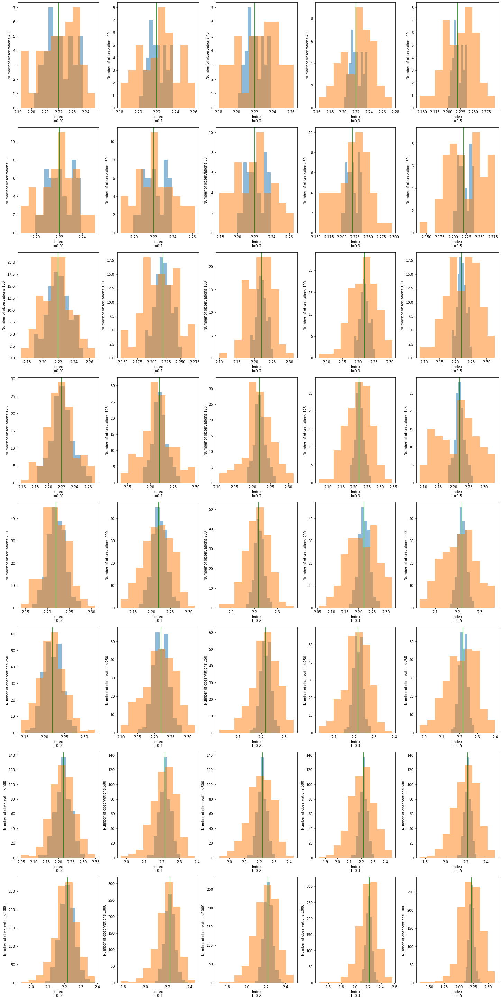

In [23]:
fig = plt.figure(figsize=[20,40],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 5, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[0])
for n in range(8):
    ax = fig.add_subplot(gs1[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][1], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.01')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs2 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[1])
for n in range(8):
    ax = fig.add_subplot(gs2[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][2], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.1')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

gs3 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[2])
for n in range(8):
    ax = fig.add_subplot(gs3[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][3], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.2')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs4 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[3])
for n in range(8):
    ax = fig.add_subplot(gs4[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][4], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.3')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs5 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[4])
for n in range(8):
    ax = fig.add_subplot(gs5[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][5], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.5')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

plt.show()

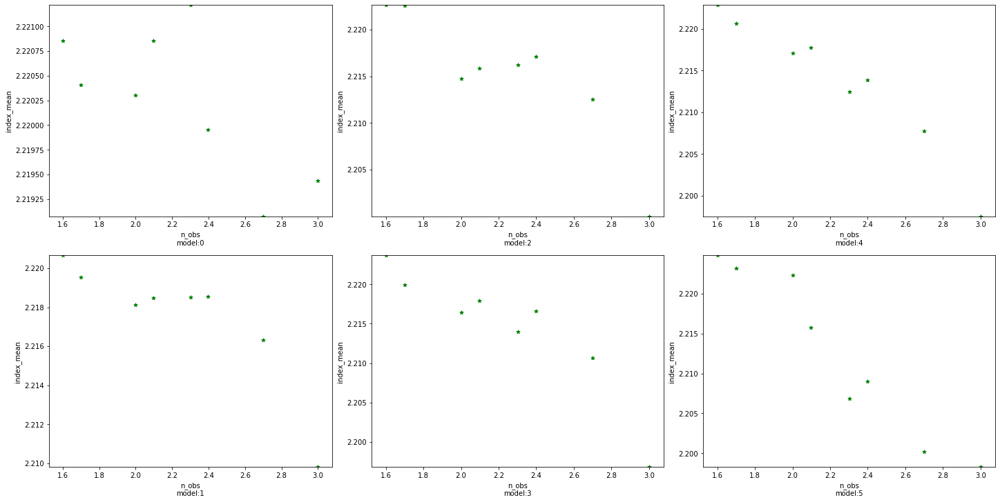

In [24]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n}')
    plt.ylabel('index_mean')
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+2}')
    plt.ylabel('index_mean')
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(2):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+4}')
    plt.ylabel('index_mean')
    plt.ylim(min([row[n+4] for row in mu]),max([row[n+4] for row in mu]))

plt.show()

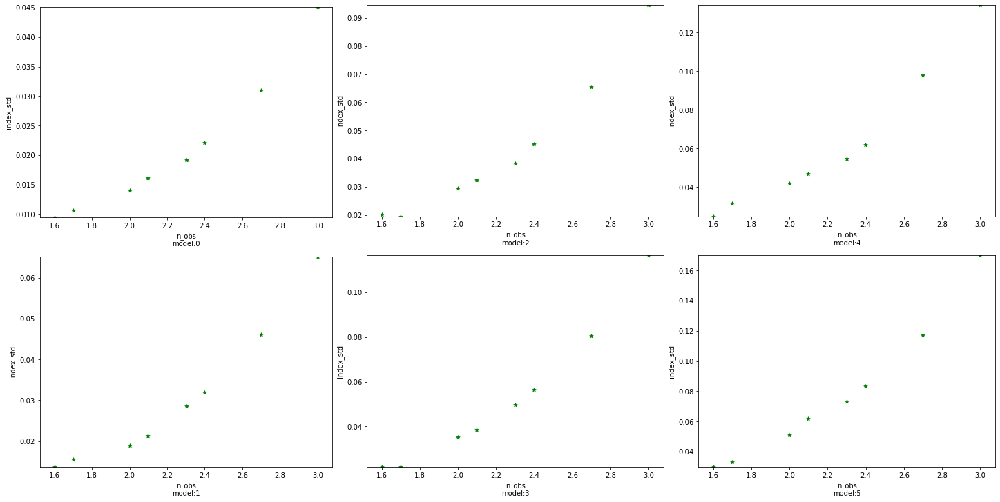

In [25]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+2}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(2):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+4}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n+4] for row in sigma]),max([row[n+4] for row in sigma]))

plt.show()

In [26]:
for j in range(6):
    print(f"model: {j}")
    for i in range(8):
        mu[i][j]=amplitude[i][j].mean()
        sigma[i][j]=amplitude[i][j].std()
        print(f"amplitude: {amplitude[i][j].mean()} += {amplitude[i][j].std()}")

model: 0
amplitude: 1.2882109734645357e-12 += 2.020774416400257e-14
amplitude: 1.2887930617364896e-12 += 2.321243734503526e-14
amplitude: 1.2875057637201671e-12 += 2.943738660653206e-14
amplitude: 1.2855551328222816e-12 += 3.4620322478409695e-14
amplitude: 1.2852616877373924e-12 += 4.1590131875188173e-14
amplitude: 1.2870704254498414e-12 += 4.604036230233484e-14
amplitude: 1.2848003538014906e-12 += 6.382360983727948e-14
amplitude: 1.2834022687629476e-12 += 9.812239252655629e-14
model: 1
amplitude: 1.2889578883338907e-12 += 2.7427021702990073e-14
amplitude: 1.2894684378817922e-12 += 2.813899369747791e-14
amplitude: 1.2903669824825752e-12 += 4.2053504202932235e-14
amplitude: 1.2893540181865374e-12 += 4.768668915877586e-14
amplitude: 1.2898703913381476e-12 += 6.143963128087334e-14
amplitude: 1.2890129642059102e-12 += 6.224726161695642e-14
amplitude: 1.2967926229286649e-12 += 9.656037935907711e-14
amplitude: 1.3095492576963572e-12 += 1.3837863098665463e-13
model: 2
amplitude: 1.28007330107

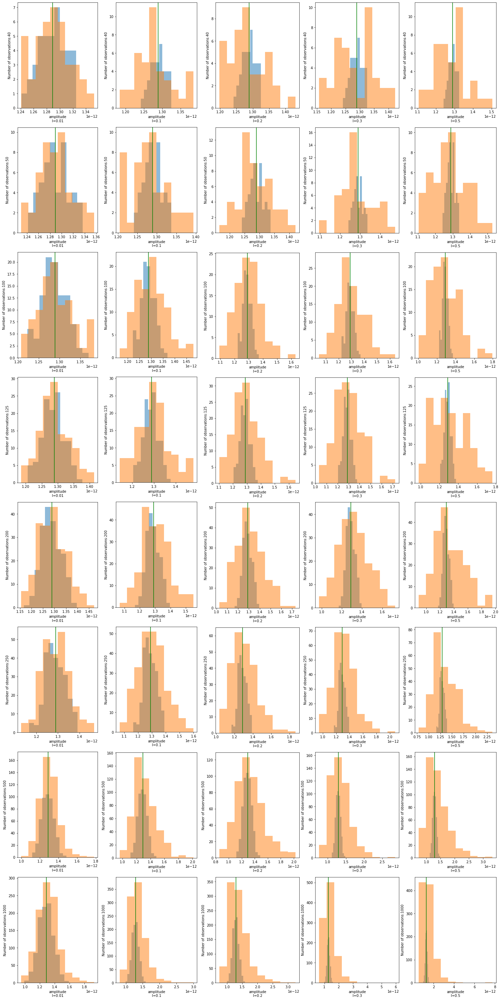

In [27]:
fig = plt.figure(figsize=[20,40],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 5, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[0])
for n in range(8):
    ax = fig.add_subplot(gs1[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][1], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.01')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs2 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[1])
for n in range(8):
    ax = fig.add_subplot(gs2[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][2], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.1')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

gs3 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[2])
for n in range(8):
    ax = fig.add_subplot(gs3[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][3], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.2')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs4 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[3])
for n in range(8):
    ax = fig.add_subplot(gs4[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][4], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.3')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs5 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[4])
for n in range(8):
    ax = fig.add_subplot(gs5[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][5], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.5')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

plt.show()

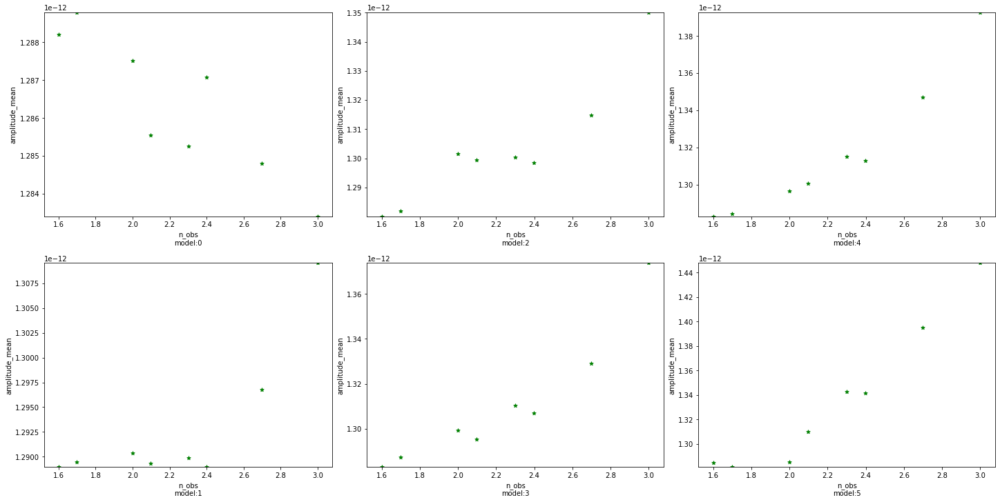

In [28]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n}')
    plt.ylabel('amplitude_mean')
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+2}')
    plt.ylabel('amplitude_mean')
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(2):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+4}')
    plt.ylabel('amplitude_mean')
    plt.ylim(min([row[n+4] for row in mu]),max([row[n+4] for row in mu]))

plt.show()

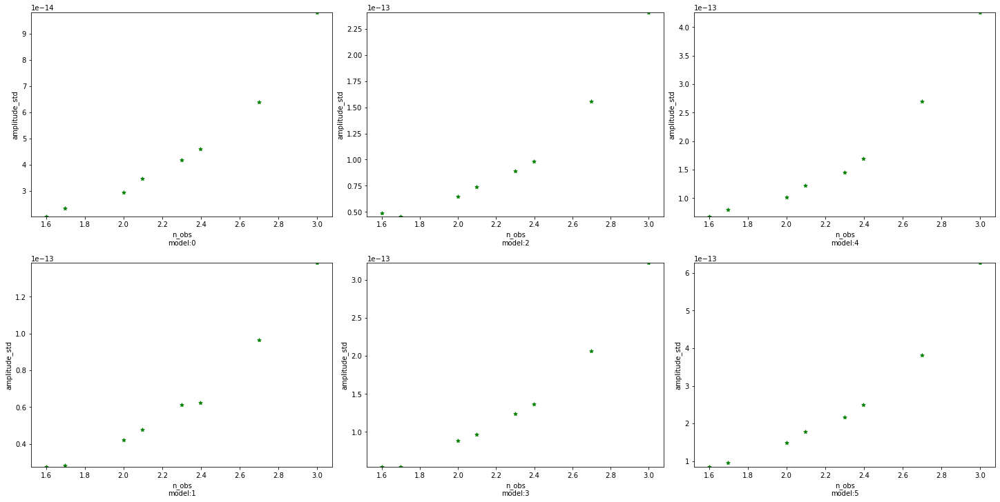

In [29]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+2}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(2):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+4}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n+4] for row in sigma]),max([row[n+4] for row in sigma]))

plt.show()

In [30]:
for j in range(5):
    print(f"model: {j}")
    for i in range(8):
        mu[i][j]=lambda_[i][j].mean()
        sigma[i][j]=lambda_[i][j].std()
        print(f"lambda_: {lambda_[i][j].mean()} += {lambda_[i][j].std()}")

model: 0
lambda_: 0.010258673762881799 += 0.003816841078315301
lambda_: 0.010184648621490816 += 0.003938467864632929
lambda_: 0.011639173153405624 += 0.006698493085092638
lambda_: 0.011613996276705387 += 0.00709438332512854
lambda_: 0.011542533059089654 += 0.009815750440930034
lambda_: 0.011494085807908082 += 0.010726172710231565
lambda_: 0.013796467677061698 += 0.017979523189227093
lambda_: 0.017706978731673047 += 0.026640397643808697
model: 1
lambda_: 0.09767607967793786 += 0.01422881257575096
lambda_: 0.09810229530400459 += 0.013334035654514477
lambda_: 0.10530386799605303 += 0.0200096434828582
lambda_: 0.10614898913685648 += 0.023933350206845404
lambda_: 0.10612298373787767 += 0.027953387701715772
lambda_: 0.10523471201628334 += 0.031548960858549996
lambda_: 0.11133697949662273 += 0.05118767665273025
lambda_: 0.12571580037646582 += 0.07684586566480776
model: 2
lambda_: 0.198664559612202 += 0.022102767761110198
lambda_: 0.20048388924667912 += 0.023235245519206204
lambda_: 0.20480604

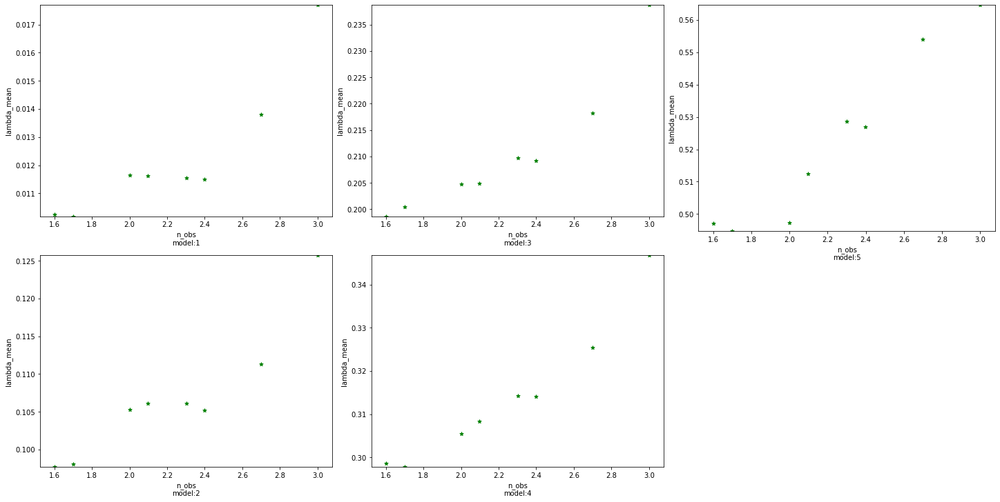

In [31]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+1}')
    plt.ylabel('lambda_mean')
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+3}')
    plt.ylabel('lambda_mean')
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+5}')
    plt.ylabel('lambda_mean')
    plt.ylim(min([row[n+4] for row in mu]),max([row[n+4] for row in mu]))

plt.show()

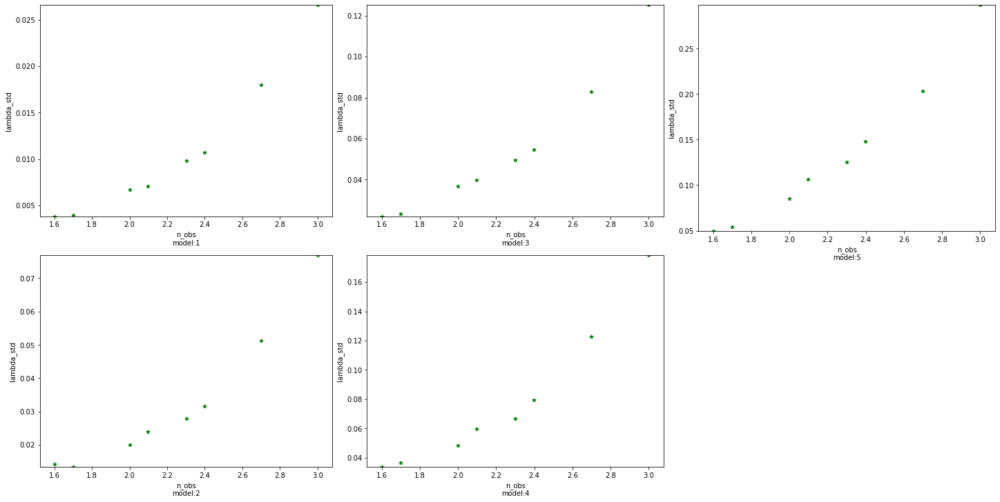

In [32]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+1}')
    plt.ylabel('lambda_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+3}')
    plt.ylabel('lambda_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+5}')
    plt.ylabel('lambda_std')
    plt.ylim(min([row[n+4] for row in sigma]),max([row[n+4] for row in sigma]))

plt.show()

In [33]:
sim = [[0 for i in range(cols)] for j in range(rows)]
for i in range(8):
    s = PowerLawSpectralModel(
        index=index[i][0].mean(),
        amplitude=amplitude[i][0].mean() * u.Unit("cm-2 s-1 TeV-1"),
        reference=1 * u.TeV,
    )
    print(s) 
    sim[i][0]=s
    
for j in range(5):
    for i in range(8):
        s = ExpCutoffPowerLawSpectralModel(
            index=index[i][j+1].mean(),
            amplitude=amplitude[i][j+1].mean() * u.Unit("cm-2 s-1 TeV-1"),
            reference=1 * u.TeV,
            lambda_=lambda_[i][j].mean() * u.Unit("TeV-1"),
            alpha = 1,
        )
        print(s)
        sim[i][j+1]=s

PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --

<function matplotlib.pyplot.show(*args, **kw)>

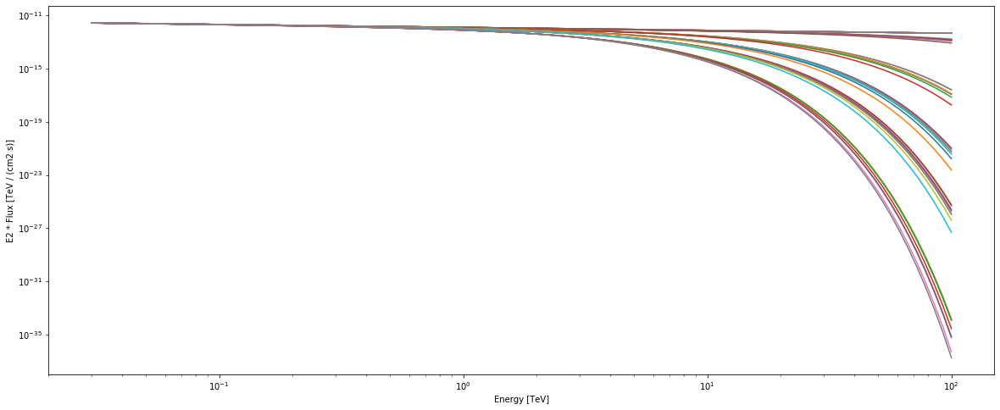

In [34]:
plt.figure(figsize=[20,8])
energy_range = [0.03, 100] * u.TeV
for j in range(6):
    for i in range(8):
        sim[i][j].plot(energy_range=energy_range, energy_power=2)
plt.show

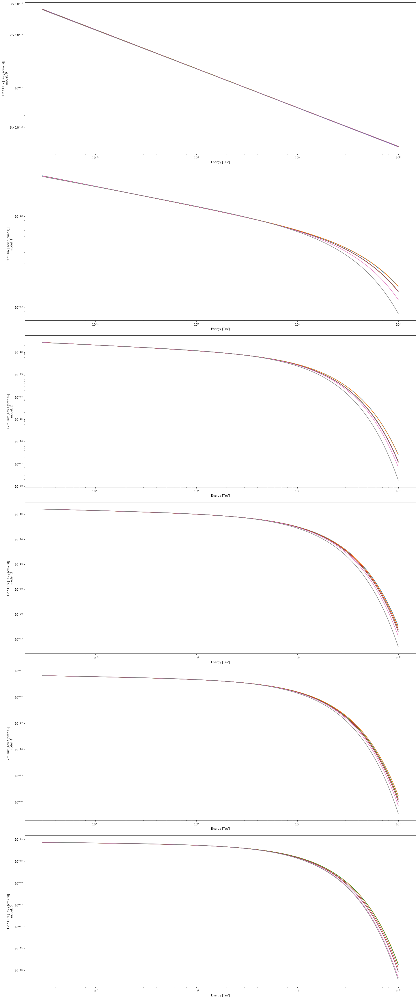

In [35]:
fig = plt.figure(figsize=[20,48],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 1, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(6, 1, subplot_spec=gs0[0])
for n in range(6):
    ax = fig.add_subplot(gs1[n])
    for i in range(8):
        sim[i][n].plot(energy_range=energy_range, energy_power=2)
    plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {n}')
    
plt.show()

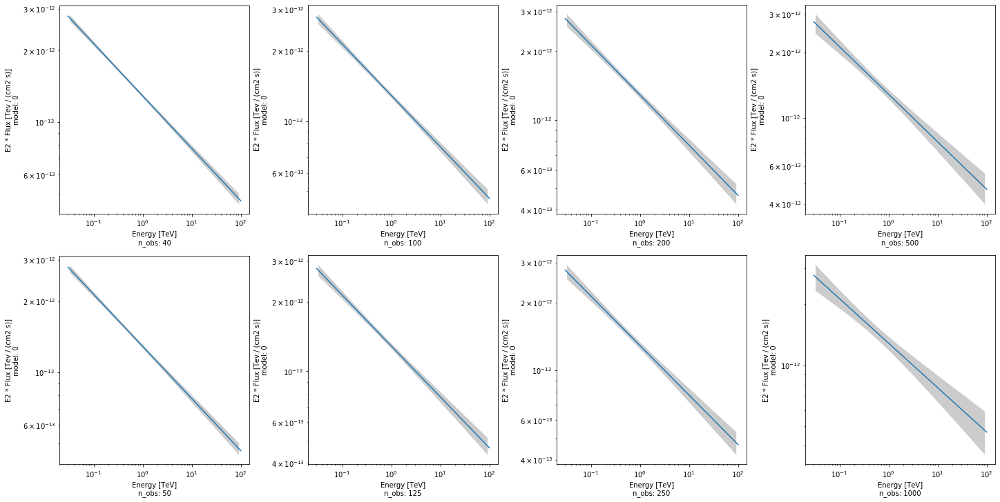

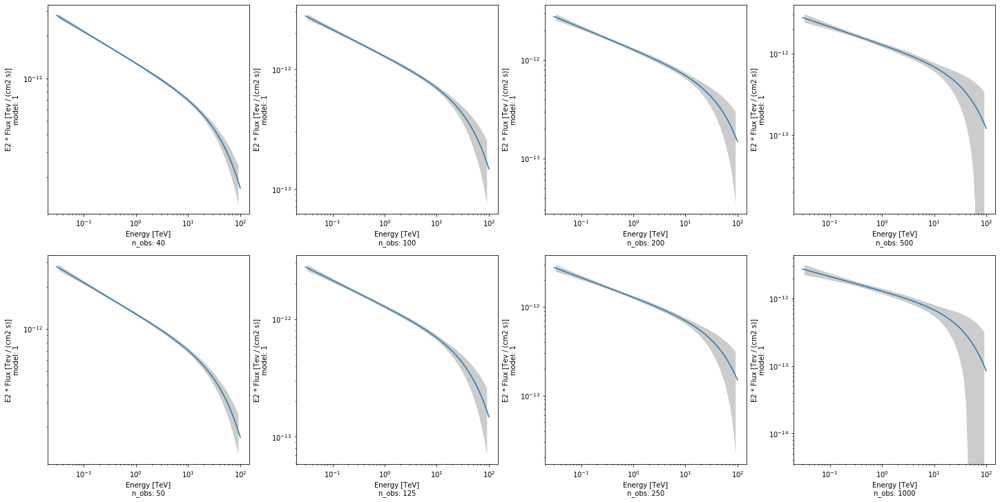

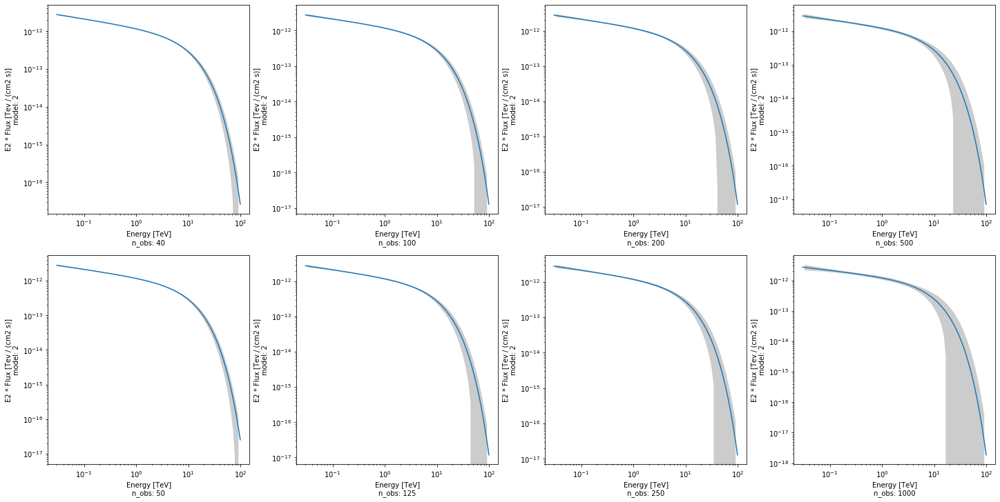

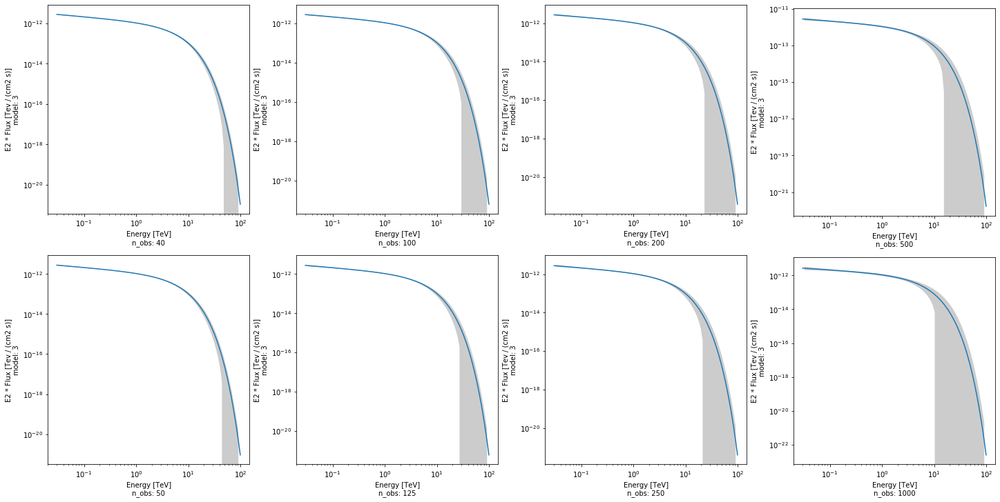

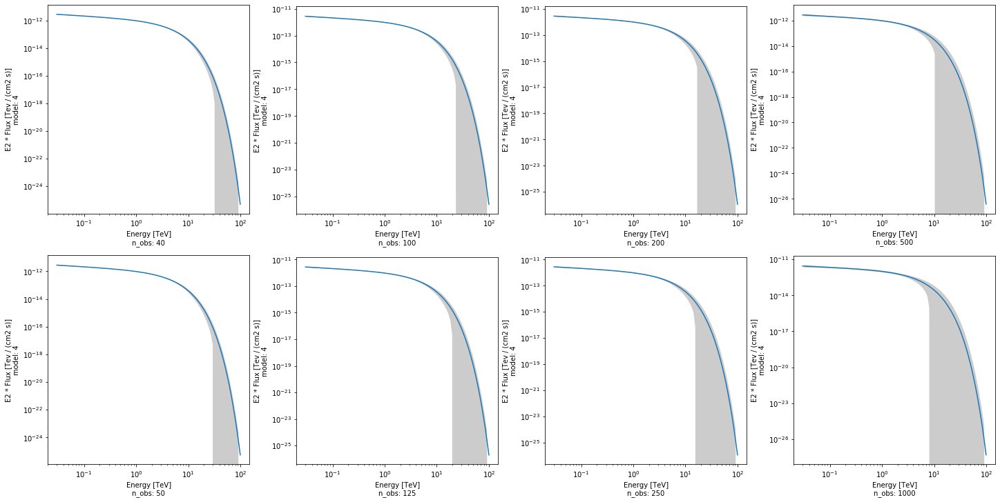

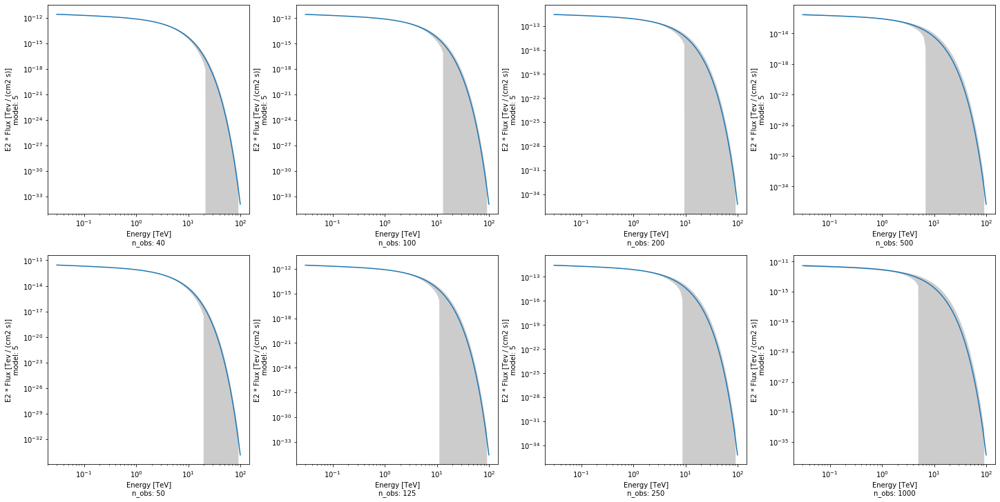

In [36]:
for i in range(6):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 4, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[n][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][i], covar=covar[n][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[n+2][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][i], covar=covar[n+2][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(2):
        ax = fig.add_subplot(gs3[n])
        sim[n+4][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][i], covar=covar[n+4][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    gs4 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[3])
    for n in range(2):
        ax = fig.add_subplot(gs4[n])
        sim[n+6][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+6][i], covar=covar[n+6][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+6]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    plt.show()

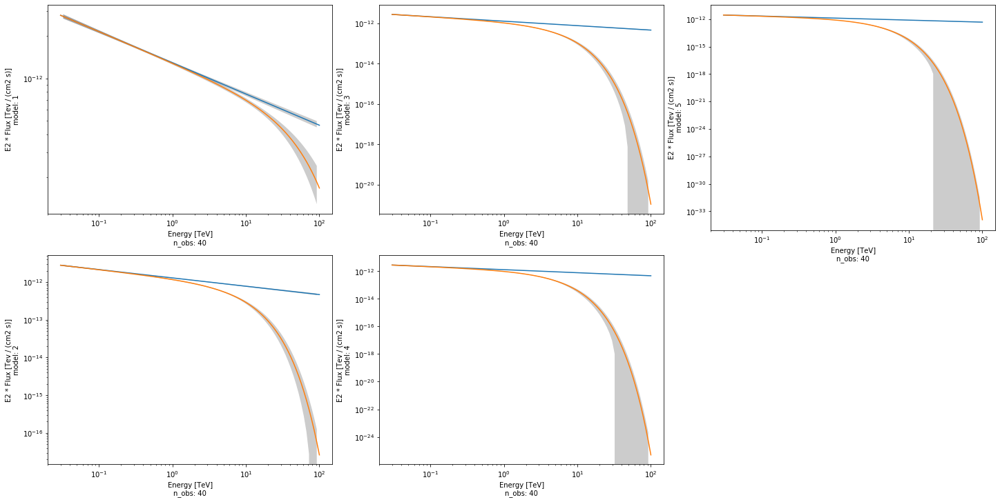

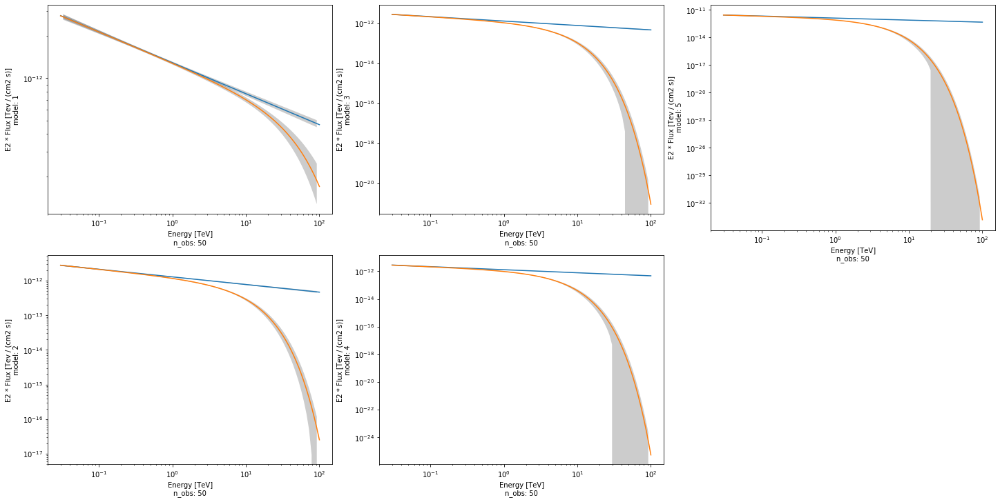

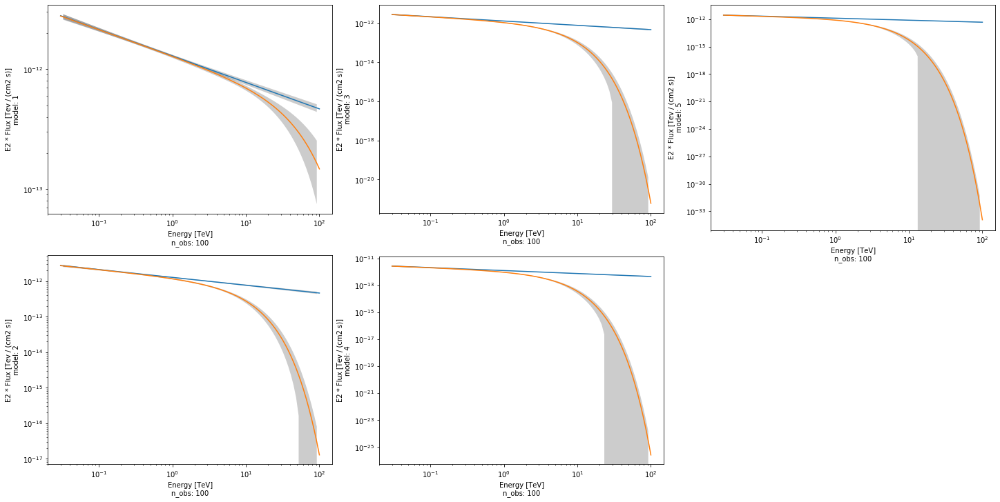

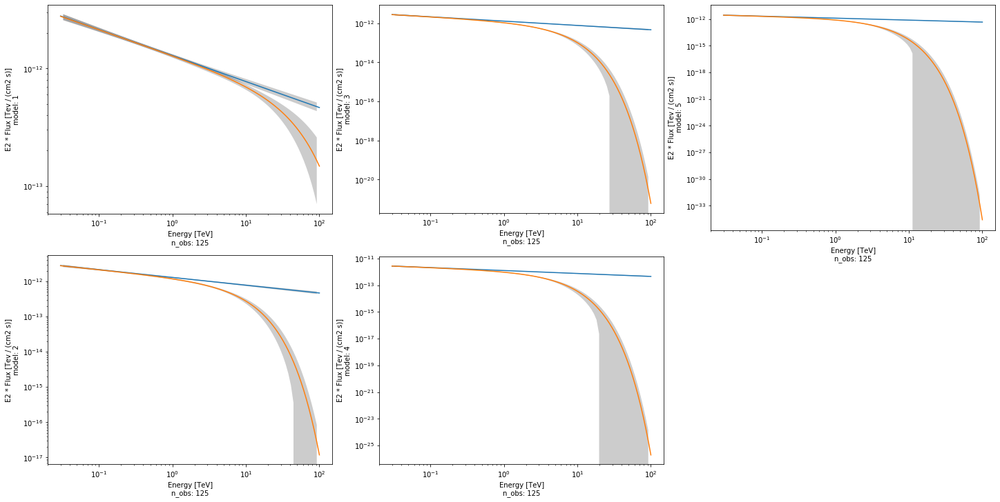

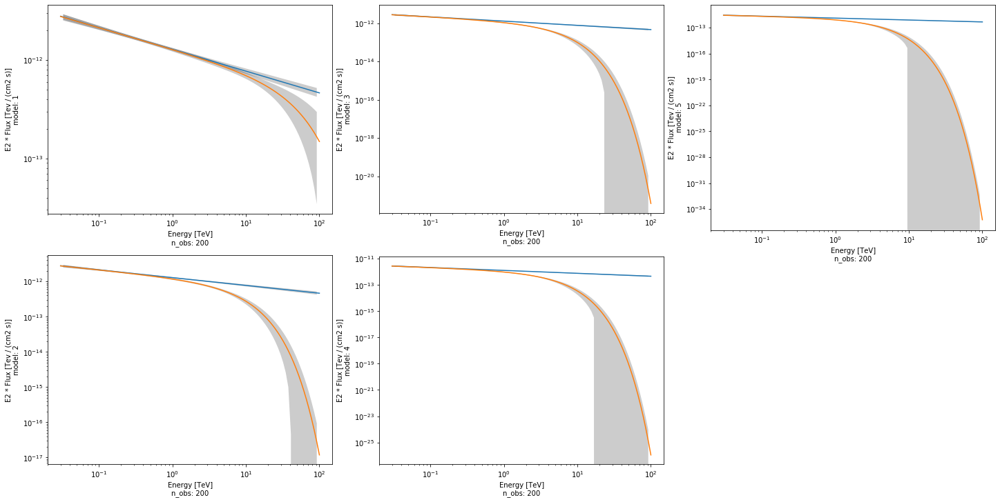

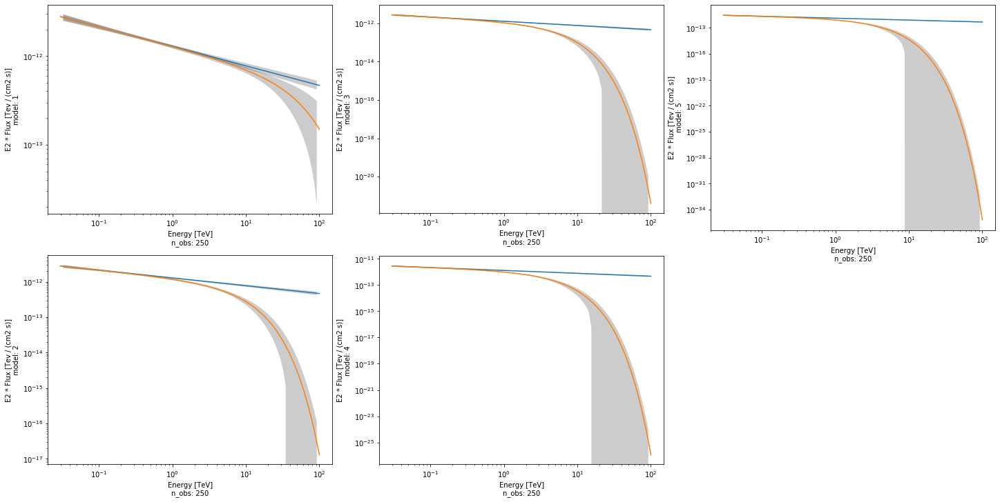

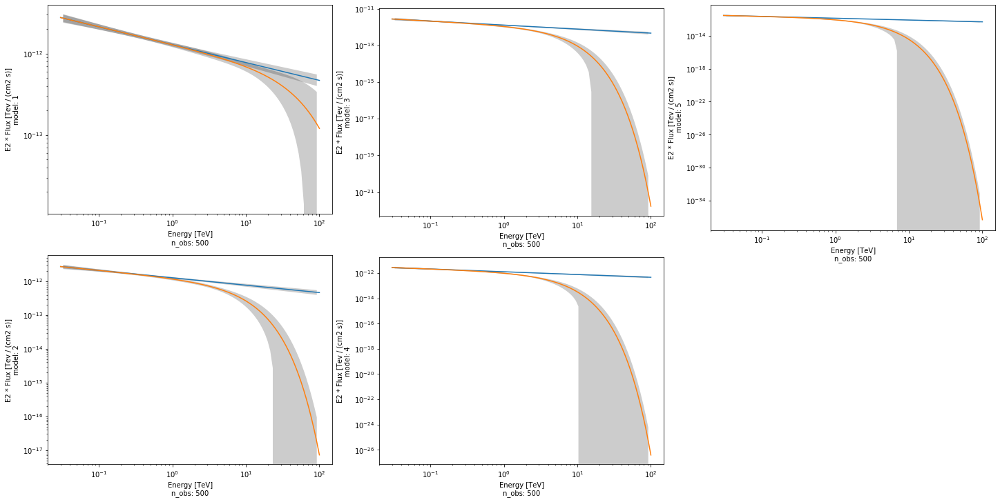

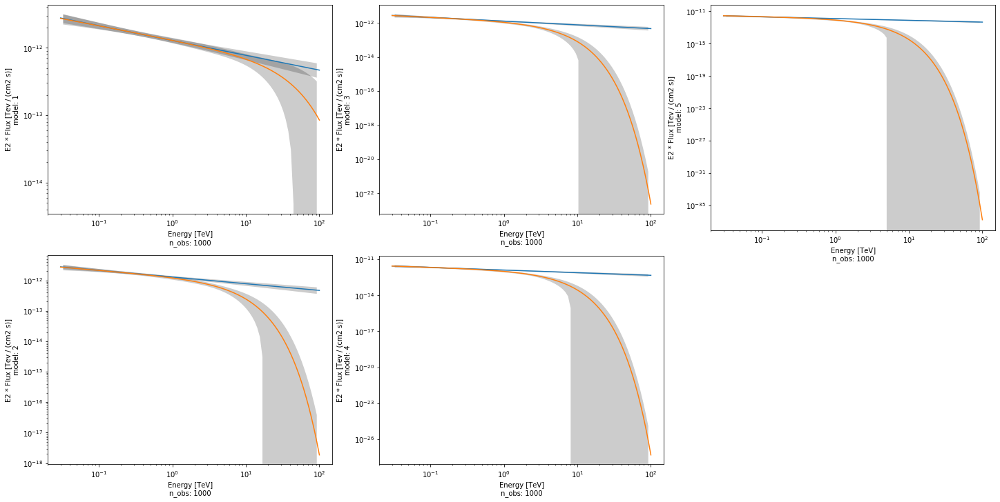

In [37]:
for i in range(8):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 3, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[i][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][0], covar=covar[i][0],energy_range=energy_range, energy_power=2)
        sim[i][n+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][n+1], covar=covar[i][n+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[i]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {n+1}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[i][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][0], covar=covar[i][0],energy_range=energy_range, energy_power=2)
        sim[i][n+3].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][n+3], covar=covar[i][n+3],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[i]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {n+3}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(1):
        ax = fig.add_subplot(gs3[n])
        sim[i][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][0], covar=covar[i][0],energy_range=energy_range, energy_power=2)
        sim[i][n+5].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][n+5], covar=covar[i][n+5],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[i]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {n+5}')

    plt.show()

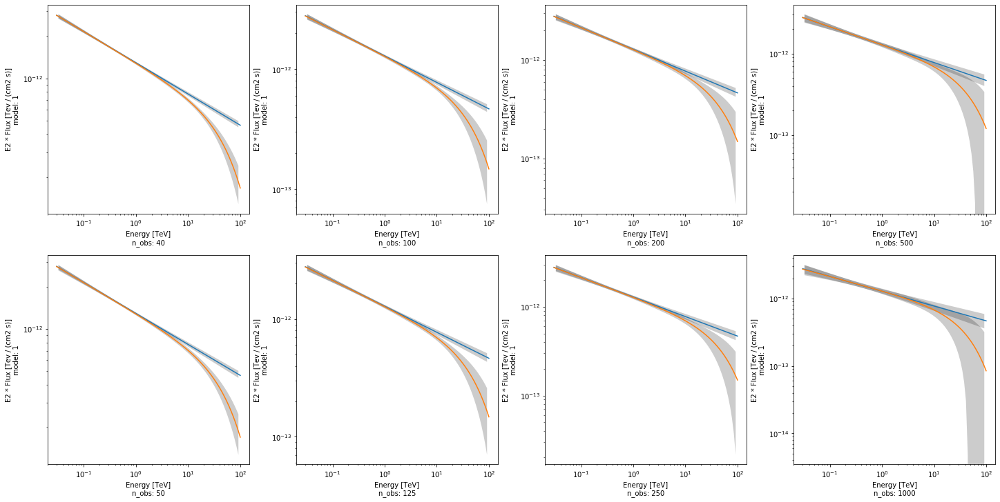

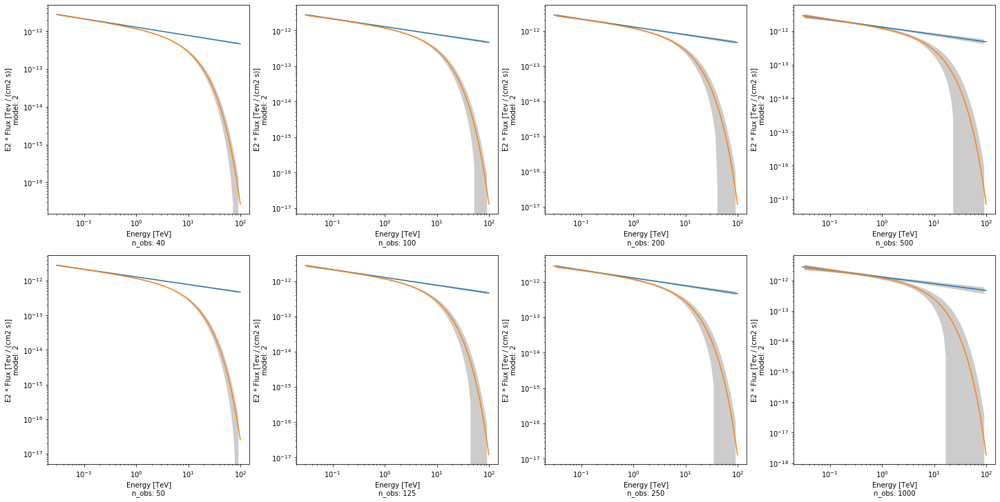

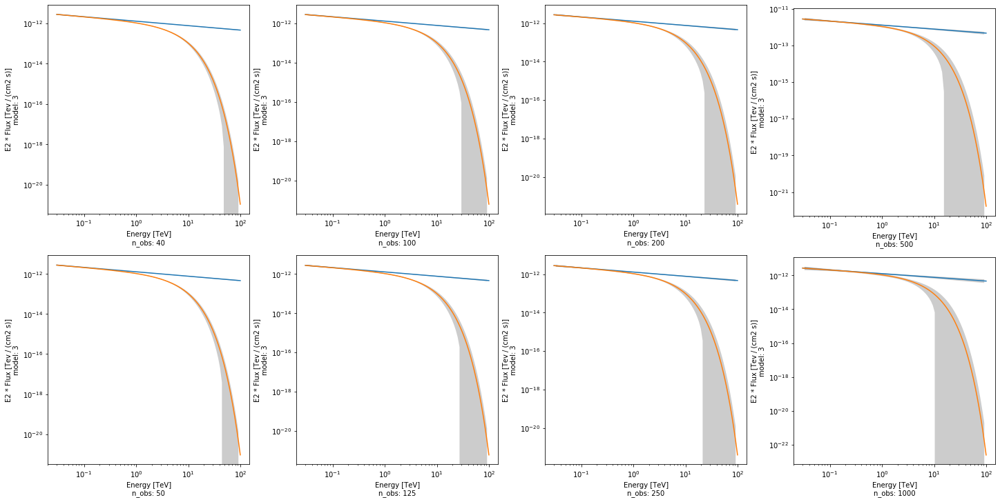

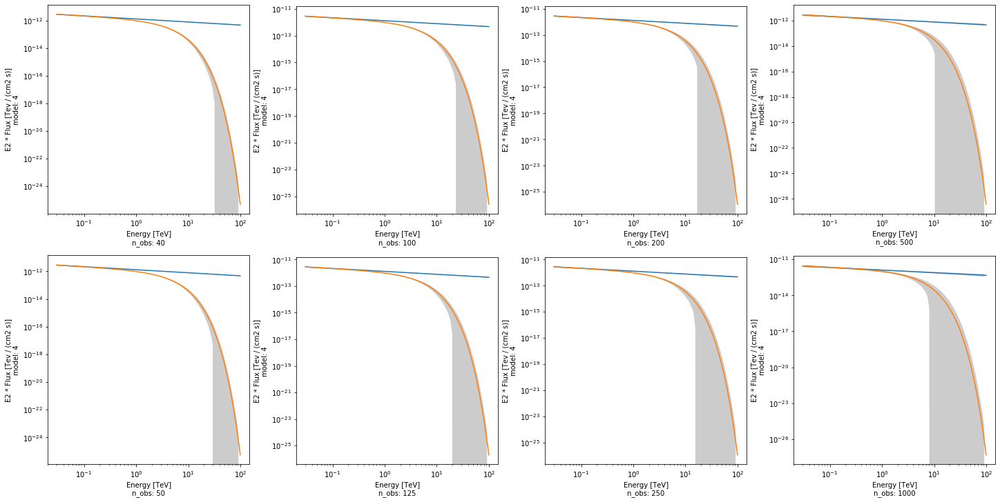

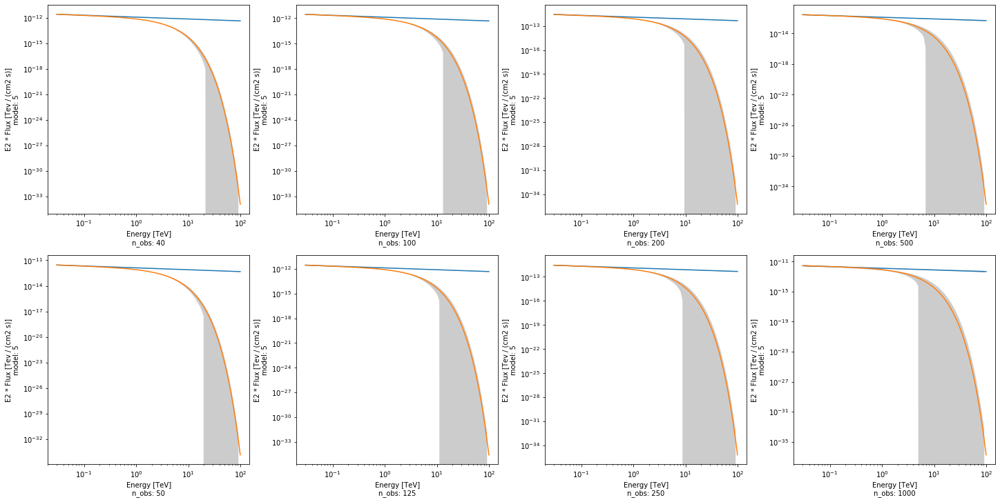

In [38]:
for i in range(5):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 4, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[n][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][0], covar=covar[n][0],energy_range=energy_range, energy_power=2)
        sim[n][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][i+1], covar=covar[n][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i+1}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[n+2][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][0], covar=covar[n+2][0],energy_range=energy_range, energy_power=2)
        sim[n+2][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][i+1], covar=covar[n+2][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i+1}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(2):
        ax = fig.add_subplot(gs3[n])
        sim[n+4][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][0], covar=covar[n+4][0],energy_range=energy_range, energy_power=2)
        sim[n+4][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][i+1], covar=covar[n+4][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i+1}')

    gs4 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[3])
    for n in range(2):
        ax = fig.add_subplot(gs4[n])
        sim[n+6][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+6][0], covar=covar[n+6][0],energy_range=energy_range, energy_power=2)
        sim[n+6][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+6][i+1], covar=covar[n+6][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+6]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i+1}')

    plt.show()

In [39]:
%%time
res_1 = [[0 for i in range(cols)] for j in range(rows)]
minuit_opts = {"tol": 0.001, "strategy": 1}
for i in range(8):
    results_1 = []
    for dataset in datas[i][0]:
        dataset.models = model[i][0].copy()
        fit_1 = Fit([dataset])
        result_1 = fit_1.run(optimize_opts=minuit_opts)
        results_1.append(
            {
                "index": result_1.parameters["index"].value,
                "amplitude": result_1.parameters["amplitude"].value,
                "reference":result_1.parameters["reference"].value,
                "covariance": result_1.parameters.covariance,
            }
        )
        print(result_1.parameters.to_table())
    res_1[i][0]=results_1

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 9.028e-03                nan nan  False
amplitude 1.318e-12 1.964e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 9.318e-03                nan nan  False
amplitude 1.258e-12 1.930e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 9.283e-03                nan nan  False
amplitude 1.263e-12 1.943e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 9.023e-03                nan nan  False
amplitude 1.315e-12 1.977e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 9.374e-03                nan nan  False
amplitude 1.241e-12 1.927e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 9.174e-03                nan nan  False
amplitude 1.278e-12 1.955e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 1.016e-02                nan nan  False
amplitude 1.299e-12 2.201e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 1.041e-02                nan nan  False
amplitude 1.246e-12 2.164e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 1.030e-02                nan nan  False
amplitude 1.282e-12 2.178e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 1.425e-02                nan nan  False
amplitude 1.318e-12 3.109e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 1.501e-02                nan nan  False
amplitude 1.230e-12 3.024e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 1.482e-02                nan nan  False
amplitude 1.245e-12 3.056e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 1.406e-02                nan nan  False
amplitude 1.334e-12 3.151e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 1.487e-02                nan nan  False
amplitude 1.222e-12 3.031e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 1.457e-02                nan nan  False
amplitude 1.281e-12 3.095e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 1.454e-02                nan nan  False
amplitude 1.275e-12 3.079e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 1.409e-02                nan nan  False
amplitude 1.329e-12 3.146e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 1.455e-02                nan nan  False
amplitude 1.280e-12 3.084e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 1.469e-02                nan nan  False
amplitude 1.256e-12 3.074e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 1.474e-02                nan nan  False
amplitude 1.266e-12 3.063e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 1.433e-02                nan nan  False
amplitude 1.308e-12 3.110e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 1.616e-02                nan nan  False
amplitude 1.286e-12 3.469e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 1.651e-02                nan nan  False
amplitude 1.231e-12 3.422e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 1.600e-02                nan nan  False
amplitude 1.306e-12 3.484e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 1.640e-02                nan nan  False
amplitude 1.247e-12 3.419e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 1.552e-02                nan nan  False
amplitude 1.377e-12 3.546e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 1.597e-02                nan nan  False
amplitude 1.335e-12 3.499e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 1.618e-02                nan nan  False
amplitude 1.286e-12 3.450e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 1.580e-02                nan nan  False
amplitude 1.329e-12 3.493e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 1.623e-02                nan nan  False
amplitude 1.294e-12 3.453e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 1.583e-02                nan nan  False
amplitude 1.332e-12 3.501e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.265e+00 1.621e-02                nan nan  False
amplitude 1.266e-12 3.462e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 1.605e-02                nan nan  False
amplitude 1.279e-12 3.464e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 2.030e-02                nan nan  False
amplitude 1.299e-12 4.392e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 2.022e-02                nan nan  False
amplitude 1.330e-12 4.390e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 2.087e-02                nan nan  False
amplitude 1.269e-12 4.325e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 2.052e-02                nan nan  False
amplitude 1.288e-12 4.355e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 1.998e-02                nan nan  False
amplitude 1.352e-12 4.437e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 2.086e-02                nan nan  False
amplitude 1.269e-12 4.326e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 2.022e-02                nan nan  False
amplitude 1.288e-12 4.375e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 2.023e-02                nan nan  False
amplitude 1.300e-12 4.399e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 2.047e-02                nan nan  False
amplitude 1.305e-12 4.391e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 2.097e-02                nan nan  False
amplitude 1.264e-12 4.310e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 2.049e-02                nan nan  False
amplitude 1.283e-12 4.353e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 2.019e-02                nan nan  False
amplitude 1.298e-12 4.377e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 2.084e-02                nan nan  False
amplitude 1.242e-12 4.296e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 2.102e-02                nan nan  False
amplitude 1.229e-12 4.305e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 2.061e-02                nan nan  False
amplitude 1.263e-12 4.360e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 1.969e-02                nan nan  False
amplitude 1.351e-12 4.463e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 2.091e-02                nan nan  False
amplitude 1.262e-12 4.326e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.190e+00 2.011e-02                nan nan  False
amplitude 1.330e-12 4.401e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 2.031e-02                nan nan  False
amplitude 1.307e-12 4.399e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 2.031e-02                nan nan  False
amplitude 1.309e-12 4.391e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 2.098e-02                nan nan  False
amplitude 1.221e-12 4.313e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 2.278e-02                nan nan  False
amplitude 1.319e-12 4.932e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.151e+00 2.256e-02                nan nan  False
amplitude 1.351e-12 4.925e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 2.318e-02                nan nan  False
amplitude 1.274e-12 4.865e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 2.312e-02                nan nan  False
amplitude 1.240e-12 4.836e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 2.269e-02                nan nan  False
amplitude 1.285e-12 4.897e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 2.277e-02                nan nan  False
amplitude 1.287e-12 4.877e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 2.295e-02                nan nan  False
amplitude 1.267e-12 4.856e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 2.280e-02                nan nan  False
amplitude 1.327e-12 4.901e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 2.257e-02                nan nan  False
amplitude 1.315e-12 4.925e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 2.198e-02                nan nan  False
amplitude 1.343e-12 4.997e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 2.239e-02                nan nan  False
amplitude 1.327e-12 4.971e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 2.295e-02                nan nan  False
amplitude 1.278e-12 4.887e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 2.269e-02                nan nan  False
amplitude 1.306e-12 4.937e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 2.376e-02                nan nan  False
amplitude 1.239e-12 4.795e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 2.219e-02                nan nan  False
amplitude 1.363e-12 4.980e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 2.372e-02                nan nan  False
amplitude 1.225e-12 4.845e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 2.338e-02                nan nan  False
amplitude 1.232e-12 4.808e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 2.293e-02                nan nan  False
amplitude 1.284e-12 4.858e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 2.289e-02                nan nan  False
amplitude 1.283e-12 4.885e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 2.348e-02                nan nan  False
amplitude 1.240e-12 4.777e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 2.243e-02                nan nan  False
amplitude 1.345e-12 4.990e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 2.417e-02                nan nan  False
amplitude 1.254e-12 4.799e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 2.328e-02                nan nan  False
amplitude 1.256e-12 4.810e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 2.351e-02                nan nan  False
amplitude 1.248e-12 4.829e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 3.194e-02                nan nan  False
amplitude 1.279e-12 6.947e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 3.090e-02                nan nan  False
amplitude 1.357e-12 7.099e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 3.293e-02                nan nan  False
amplitude 1.244e-12 6.790e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 3.335e-02                nan nan  False
amplitude 1.236e-12 6.824e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 3.282e-02                nan nan  False
amplitude 1.260e-12 6.799e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 3.217e-02                nan nan  False
amplitude 1.304e-12 6.912e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 3.155e-02                nan nan  False
amplitude 1.303e-12 6.994e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 3.302e-02                nan nan  False
amplitude 1.222e-12 6.759e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 3.186e-02                nan nan  False
amplitude 1.268e-12 6.904e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 3.167e-02                nan nan  False
amplitude 1.333e-12 6.953e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 3.364e-02                nan nan  False
amplitude 1.208e-12 6.768e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 3.284e-02                nan nan  False
amplitude 1.262e-12 6.847e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 3.259e-02                nan nan  False
amplitude 1.268e-12 6.872e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 3.005e-02                nan nan  False
amplitude 1.411e-12 7.254e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 3.379e-02                nan nan  False
amplitude 1.227e-12 6.724e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 3.392e-02                nan nan  False
amplitude 1.235e-12 6.732e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 3.291e-02                nan nan  False
amplitude 1.302e-12 6.963e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.269e+00 3.302e-02                nan nan  False
amplitude 1.206e-12 6.801e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 3.335e-02                nan nan  False
amplitude 1.238e-12 6.806e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 3.347e-02                nan nan  False
amplitude 1.222e-12 6.799e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 3.169e-02                nan nan  False
amplitude 1.332e-12 6.985e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 3.224e-02                nan nan  False
amplitude 1.302e-12 6.927e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.305e+00 3.305e-02                nan nan  False
amplitude 1.177e-12 6.825e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 3.128e-02                nan nan  False
amplitude 1.377e-12 7.058e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 3.253e-02                nan nan  False
amplitude 1.361e-12 6.976e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 3.118e-02                nan nan  False
amplitude 1.329e-12 7.014e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.190e+00 3.185e-02                nan nan  False
amplitude 1.318e-12 6.955e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 3.052e-02                nan nan  False
amplitude 1.449e-12 7.244e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 3.112e-02                nan nan  False
amplitude 1.387e-12 7.148e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 3.240e-02                nan nan  False
amplitude 1.323e-12 6.931e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 3.051e-02                nan nan  False
amplitude 1.361e-12 7.076e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 3.091e-02                nan nan  False
amplitude 1.409e-12 7.136e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 3.327e-02                nan nan  False
amplitude 1.201e-12 6.777e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 3.117e-02                nan nan  False
amplitude 1.367e-12 7.080e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 3.302e-02                nan nan  False
amplitude 1.281e-12 6.856e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 3.257e-02                nan nan  False
amplitude 1.278e-12 6.845e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 3.312e-02                nan nan  False
amplitude 1.221e-12 6.754e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 3.459e-02                nan nan  False
amplitude 1.137e-12 6.572e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.147e+00 3.456e-02                nan nan  False
amplitude 1.190e-12 6.640e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 3.315e-02                nan nan  False
amplitude 1.229e-12 6.839e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 3.334e-02                nan nan  False
amplitude 1.184e-12 6.693e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.306e+00 3.284e-02                nan nan  False
amplitude 1.219e-12 6.877e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 3.187e-02                nan nan  False
amplitude 1.348e-12 7.050e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 3.430e-02                nan nan  False
amplitude 1.202e-12 6.687e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 3.261e-02                nan nan  False
amplitude 1.254e-12 6.797e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.286e+00 3.141e-02                nan nan  False
amplitude 1.327e-12 7.105e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 3.299e-02                nan nan  False
amplitude 1.269e-12 6.806e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 3.192e-02                nan nan  False
amplitude 1.297e-12 6.926e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 3.275e-02                nan nan  False
amplitude 1.265e-12 6.862e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 3.296e-02                nan nan  False
amplitude 1.243e-12 6.769e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 3.154e-02                nan nan  False
amplitude 1.345e-12 7.035e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 4.118e-02                nan nan  False
amplitude 1.426e-12 1.025e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 4.646e-02                nan nan  False
amplitude 1.295e-12 9.737e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 4.539e-02                nan nan  False
amplitude 1.311e-12 9.817e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 4.668e-02                nan nan  False
amplitude 1.249e-12 9.694e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 4.480e-02                nan nan  False
amplitude 1.299e-12 9.808e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 4.375e-02                nan nan  False
amplitude 1.404e-12 1.005e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 4.602e-02                nan nan  False
amplitude 1.215e-12 9.574e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.283e+00 4.489e-02                nan nan  False
amplitude 1.265e-12 9.867e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.269e+00 4.583e-02                nan nan  False
amplitude 1.275e-12 9.917e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 4.697e-02                nan nan  False
amplitude 1.214e-12 9.590e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 4.765e-02                nan nan  False
amplitude 1.237e-12 9.578e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 4.911e-02                nan nan  False
amplitude 1.170e-12 9.345e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.339e+00 4.339e-02                nan nan  False
amplitude 1.315e-12 1.017e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.144e+00 4.801e-02                nan nan  False
amplitude 1.227e-12 9.545e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 4.569e-02                nan nan  False
amplitude 1.290e-12 9.853e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.288e+00 4.778e-02                nan nan  False
amplitude 1.155e-12 9.489e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 4.424e-02                nan nan  False
amplitude 1.393e-12 1.014e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 4.646e-02                nan nan  False
amplitude 1.260e-12 9.595e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 4.910e-02                nan nan  False
amplitude 1.209e-12 9.524e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 4.557e-02                nan nan  False
amplitude 1.311e-12 9.827e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 4.669e-02                nan nan  False
amplitude 1.226e-12 9.664e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.162e+00 4.807e-02                nan nan  False
amplitude 1.253e-12 9.707e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.289e+00 4.486e-02                nan nan  False
amplitude 1.287e-12 9.921e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 4.593e-02                nan nan  False
amplitude 1.320e-12 9.845e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 4.440e-02                nan nan  False
amplitude 1.349e-12 9.962e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 4.657e-02                nan nan  False
amplitude 1.266e-12 9.675e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 4.571e-02                nan nan  False
amplitude 1.262e-12 9.831e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 4.566e-02                nan nan  False
amplitude 1.297e-12 9.737e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 4.728e-02                nan nan  False
amplitude 1.194e-12 9.393e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 4.421e-02                nan nan  False
amplitude 1.355e-12 9.856e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 4.684e-02                nan nan  False
amplitude 1.260e-12 9.743e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 4.640e-02                nan nan  False
amplitude 1.248e-12 9.669e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 5.099e-02                nan nan  False
amplitude 1.105e-12 9.177e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.387e+00 4.907e-02                nan nan  False
amplitude 1.074e-12 9.549e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 4.838e-02                nan nan  False
amplitude 1.239e-12 9.612e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.261e+00 4.392e-02                nan nan  False
amplitude 1.364e-12 1.003e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 4.365e-02                nan nan  False
amplitude 1.414e-12 1.011e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.152e+00 4.731e-02                nan nan  False
amplitude 1.250e-12 9.646e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 4.108e-02                nan nan  False
amplitude 1.488e-12 1.030e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 4.513e-02                nan nan  False
amplitude 1.342e-12 9.949e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 4.713e-02                nan nan  False
amplitude 1.163e-12 9.389e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.136e+00 5.050e-02                nan nan  False
amplitude 1.120e-12 9.186e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 4.644e-02                nan nan  False
amplitude 1.226e-12 9.634e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 4.893e-02                nan nan  False
amplitude 1.184e-12 9.464e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 4.497e-02                nan nan  False
amplitude 1.357e-12 1.009e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 4.818e-02                nan nan  False
amplitude 1.240e-12 9.611e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 4.719e-02                nan nan  False
amplitude 1.266e-12 9.623e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 4.556e-02                nan nan  False
amplitude 1.323e-12 9.910e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 4.309e-02                nan nan  False
amplitude 1.371e-12 9.986e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 4.687e-02                nan nan  False
amplitude 1.268e-12 9.715e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 4.542e-02                nan nan  False
amplitude 1.281e-12 9.774e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.359e+00 5.177e-02                nan nan  False
amplitude 1.042e-12 9.235e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.288e+00 4.411e-02                nan nan  False
amplitude 1.345e-12 1.008e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.286e+00 4.608e-02                nan nan  False
amplitude 1.237e-12 9.765e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.156e+00 4.863e-02                nan nan  False
amplitude 1.128e-12 9.265e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 4.481e-02                nan nan  False
amplitude 1.314e-12 9.803e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 4.518e-02                nan nan  False
amplitude 1.323e-12 1.000e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 4.368e-02                nan nan  False
amplitude 1.331e-12 9.890e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 5.094e-02                nan nan  False
amplitude 1.111e-12 9.203e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 4.442e-02                nan nan  False
amplitude 1.366e-12 1.002e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 4.633e-02                nan nan  False
amplitude 1.338e-12 9.714e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 4.753e-02                nan nan  False
amplitude 1.254e-12 9.567e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 4.549e-02                nan nan  False
amplitude 1.247e-12 9.815e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 4.533e-02                nan nan  False
amplitude 1.244e-12 9.601e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.275e+00 4.529e-02                nan nan  False
amplitude 1.237e-12 9.838e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 4.563e-02                nan nan  False
amplitude 1.296e-12 9.914e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 4.784e-02                nan nan  False
amplitude 1.222e-12 9.485e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 4.483e-02                nan nan  False
amplitude 1.348e-12 9.956e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 4.633e-02                nan nan  False
amplitude 1.245e-12 9.754e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 4.329e-02                nan nan  False
amplitude 1.417e-12 1.008e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 4.905e-02                nan nan  False
amplitude 1.117e-12 9.293e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 4.479e-02                nan nan  False
amplitude 1.312e-12 9.781e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 5.090e-02                nan nan  False
amplitude 1.139e-12 9.251e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.148e+00 4.704e-02                nan nan  False
amplitude 1.303e-12 9.807e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 4.318e-02                nan nan  False
amplitude 1.440e-12 1.017e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 4.541e-02                nan nan  False
amplitude 1.306e-12 9.852e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 4.754e-02                nan nan  False
amplitude 1.202e-12 9.533e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 4.576e-02                nan nan  False
amplitude 1.338e-12 9.919e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.291e+00 4.543e-02                nan nan  False
amplitude 1.271e-12 9.829e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 4.594e-02                nan nan  False
amplitude 1.373e-12 1.006e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 4.692e-02                nan nan  False
amplitude 1.284e-12 9.689e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 4.444e-02                nan nan  False
amplitude 1.330e-12 9.900e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 5.132e-02                nan nan  False
amplitude 1.114e-12 9.172e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 4.520e-02                nan nan  False
amplitude 1.284e-12 9.770e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 4.742e-02                nan nan  False
amplitude 1.233e-12 9.460e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 5.152e-02                nan nan  False
amplitude 1.086e-12 9.217e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 4.534e-02                nan nan  False
amplitude 1.269e-12 9.627e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.120e+00 4.804e-02                nan nan  False
amplitude 1.235e-12 9.470e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 5.110e-02                nan nan  False
amplitude 1.077e-12 9.095e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 4.539e-02                nan nan  False
amplitude 1.355e-12 9.917e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.283e+00 4.660e-02                nan nan  False
amplitude 1.236e-12 9.722e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 4.336e-02                nan nan  False
amplitude 1.353e-12 1.006e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.265e+00 4.463e-02                nan nan  False
amplitude 1.313e-12 9.957e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.301e+00 4.892e-02                nan nan  False
amplitude 1.115e-12 9.364e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 4.713e-02                nan nan  False
amplitude 1.194e-12 9.399e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 4.757e-02                nan nan  False
amplitude 1.178e-12 9.630e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 4.642e-02                nan nan  False
amplitude 1.302e-12 9.815e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 4.910e-02                nan nan  False
amplitude 1.207e-12 9.558e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 4.328e-02                nan nan  False
amplitude 1.401e-12 1.005e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

In [40]:
for j in range(5):
    for i in range(8):
        results_1 = []
        for dataset in datas[i][j+1]:
            dataset.models = model[i][j+1].copy()
            fit_1 = Fit([dataset])
            result_1 = fit_1.run(optimize_opts=minuit_opts)
            results_1.append(
                {
                    "index": result_1.parameters["index"].value,
                    "amplitude": result_1.parameters["amplitude"].value,
                    "lambda_": result_1.parameters["lambda_"].value,
                    "reference":result_1.parameters["reference"].value,
                    "alpha":result_1.parameters["alpha"].value,
                    "covariance": result_1.parameters.covariance,
                }
            )
            print(result_1.parameters.to_table())
        res_1[i][j+1]=results_1

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 1.269e-02                nan nan  False
amplitude 1.353e-12 2.701e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.759e-02 4.199e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 1.288e-02                nan nan  False
amplitude 1.273e-12 2.596e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.385e-02 4.122e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 1.240e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 1.250e-02                nan nan  False
amplitude 1.315e-12 2.642e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.389e-02 4.079e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 1.250e-02                nan nan  False
amplitude 1.241e-12 2.501e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.716e-03 3.731e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 1.240e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 1.429e-02                nan nan  False
amplitude 1.356e-12 3.046e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.883e-02 4.786e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 1.454e-02                nan nan  False
amplitude 1.270e-12 2.914e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.481e-02 4.689e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 1.389e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 1.393e-02                nan nan  False
amplitude 1.315e-12 2.961e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.369e-02 4.568e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 1.392e-02                nan nan  False
amplitude 1.230e-12 2.786e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.518e-03 4.138e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 1.386e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 1.377e-02                nan nan  False
amplitude 1.328e-12 2.926e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.216e-02 4.334e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 1.397e-02                nan nan  False
amplitude 1.265e-12 2.831e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.412e-03 4.194e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 1.415e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 1.932e-02                nan nan  False
amplitude 1.235e-12 3.765e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.810e-04 4.896e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 2.008e-02                nan nan  False
amplitude 1.373e-12 4.376e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.012e-02 6.955e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 1.894e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 1.945e-02                nan nan  False
amplitude 1.315e-12 4.137e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.157e-02 6.163e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 1.978e-02                nan nan  False
amplitude 1.208e-12 3.915e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.457e-03 5.967e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 1.917e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 1.938e-02                nan nan  False
amplitude 1.343e-12 4.161e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.193e-02 6.109e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 1.955e-02                nan nan  False
amplitude 1.264e-12 3.945e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.580e-03 5.639e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 2.014e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 1.944e-02                nan nan  False
amplitude 1.262e-12 4.021e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.331e-03 6.012e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 1.979e-02                nan nan  False
amplitude 1.258e-12 4.003e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.007e-02 6.056e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 2.051e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 2.097e-02                nan nan  False
amplitude 1.373e-12 4.560e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.863e-02 7.974e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 1.930e-02                nan nan  False
amplitude 1.279e-12 3.997e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.162e-03 5.715e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 1.952e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 2.330e-02                nan nan  False
amplitude 1.373e-12 5.015e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.536e-02 8.389e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 2.243e-02                nan nan  False
amplitude 1.414e-12 4.991e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.397e-02 7.886e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.271e+00 2.152e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 2.231e-02                nan nan  False
amplitude 1.186e-12 4.320e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.355e-03 6.604e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 2.225e-02                nan nan  False
amplitude 1.236e-12 4.375e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.574e-03 6.517e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 2.160e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 2.193e-02                nan nan  False
amplitude 1.265e-12 4.427e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.926e-03 6.390e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 2.217e-02                nan nan  False
amplitude 1.332e-12 4.602e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.190e-02 6.686e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 2.218e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 2.200e-02                nan nan  False
amplitude 1.245e-12 4.438e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.512e-03 6.640e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 2.250e-02                nan nan  False
amplitude 1.315e-12 4.818e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.767e-02 7.927e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 2.297e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 2.171e-02                nan nan  False
amplitude 1.256e-12 4.388e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.652e-03 6.200e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 2.230e-02                nan nan  False
amplitude 1.287e-12 4.531e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.117e-02 6.820e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 2.225e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 2.159e-02                nan nan  False
amplitude 1.353e-12 4.784e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.556e-02 7.377e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 2.152e-02                nan nan  False
amplitude 1.314e-12 4.559e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.054e-03 6.604e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 2.282e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 2.786e-02                nan nan  False
amplitude 1.236e-12 5.435e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.155e-03 7.521e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 2.875e-02                nan nan  False
amplitude 1.355e-12 6.226e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.243e-02 1.029e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.218e+00 2.593e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.167e+00 2.950e-02                nan nan  False
amplitude 1.391e-12 6.362e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.627e-02 1.052e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 2.710e-02                nan nan  False
amplitude 1.219e-12 5.482e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.036e-03 7.967e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.265e+00 2.744e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 2.823e-02                nan nan  False
amplitude 1.266e-12 5.847e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.256e-02 9.416e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 2.969e-02                nan nan  False
amplitude 1.296e-12 6.211e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.545e-02 1.098e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 2.588e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 2.934e-02                nan nan  False
amplitude 1.306e-12 6.202e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.131e-02 1.087e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 2.990e-02                nan nan  False
amplitude 1.430e-12 6.740e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.489e-02 1.194e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 2.790e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 2.832e-02                nan nan  False
amplitude 1.351e-12 6.241e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.038e-02 1.030e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.160e+00 2.885e-02                nan nan  False
amplitude 1.373e-12 6.193e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.334e-02 9.943e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 2.968e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 3.072e-02                nan nan  False
amplitude 1.351e-12 6.422e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.075e-02 1.148e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 2.722e-02                nan nan  False
amplitude 1.362e-12 5.914e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.231e-02 8.447e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 2.808e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 2.892e-02                nan nan  False
amplitude 1.298e-12 5.796e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.324e-02 8.816e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 2.711e-02                nan nan  False
amplitude 1.220e-12 5.410e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.394e-04 7.439e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 2.710e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 2.920e-02                nan nan  False
amplitude 1.223e-12 5.778e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.537e-02 9.795e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 2.790e-02                nan nan  False
amplitude 1.391e-12 6.135e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.769e-02 9.283e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 2.676e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 2.829e-02                nan nan  False
amplitude 1.366e-12 6.104e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.874e-02 9.541e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 2.779e-02                nan nan  False
amplitude 1.308e-12 5.766e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.095e-02 8.514e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 3.063e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 2.858e-02                nan nan  False
amplitude 1.298e-12 5.998e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.654e-02 9.837e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 2.924e-02                nan nan  False
amplitude 1.331e-12 6.250e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.455e-02 1.068e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 2.731e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 3.150e-02                nan nan  False
amplitude 1.269e-12 6.440e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.153e-02 9.884e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 3.205e-02                nan nan  False
amplitude 1.383e-12 7.113e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.426e-02 1.181e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.203e+00 3.031e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 3.319e-02                nan nan  False
amplitude 1.447e-12 7.618e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.429e-02 1.334e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.250e+00 3.123e-02                nan nan  False
amplitude  1.155e-12 5.844e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -1.669e-03 7.991e-03          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 3.157e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 3.031e-02                nan nan  False
amplitude 1.244e-12 6.247e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.070e-03 9.138e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 3.181e-02                nan nan  False
amplitude 1.237e-12 6.401e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.150e-02 1.025e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 3.009e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 3.183e-02                nan nan  False
amplitude 1.295e-12 6.837e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.703e-02 1.162e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 3.033e-02                nan nan  False
amplitude 1.374e-12 6.768e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.411e-02 1.009e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 3.188e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 3.328e-02                nan nan  False
amplitude 1.395e-12 7.465e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.237e-02 1.352e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 3.176e-02                nan nan  False
amplitude 1.359e-12 6.941e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.104e-02 1.149e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 3.222e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 3.009e-02                nan nan  False
amplitude 1.304e-12 6.350e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.748e-03 9.052e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 3.115e-02                nan nan  False
amplitude 1.379e-12 6.868e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.831e-02 1.057e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.328e+00 2.857e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 3.244e-02                nan nan  False
amplitude 1.403e-12 7.257e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.745e-02 1.229e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 3.217e-02                nan nan  False
amplitude 1.274e-12 6.390e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.324e-02 9.751e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.278e+00 3.037e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 3.529e-02                nan nan  False
amplitude 1.301e-12 7.457e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.956e-02 1.531e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 3.133e-02                nan nan  False
amplitude 1.358e-12 6.599e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.400e-02 9.548e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.285e+00 2.974e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 2.954e-02                nan nan  False
amplitude 1.314e-12 6.280e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.060e-03 8.093e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 3.152e-02                nan nan  False
amplitude 1.321e-12 6.625e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.573e-02 1.006e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 3.282e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 3.160e-02                nan nan  False
amplitude 1.260e-12 6.258e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.800e-03 9.065e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 3.375e-02                nan nan  False
amplitude 1.307e-12 7.337e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.309e-02 1.432e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 2.992e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 3.082e-02                nan nan  False
amplitude 1.226e-12 6.159e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.633e-03 9.047e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 3.240e-02                nan nan  False
amplitude 1.199e-12 6.059e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.486e-03 8.776e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 3.237e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.167e+00 3.196e-02                nan nan  False
amplitude 1.300e-12 6.321e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.193e-02 9.143e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 3.343e-02                nan nan  False
amplitude 1.203e-12 6.489e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.626e-02 1.126e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.235e+00 2.893e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 2.943e-02                nan nan  False
amplitude 1.306e-12 6.328e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.518e-03 8.540e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 2.977e-02                nan nan  False
amplitude 1.291e-12 6.092e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.637e-04 7.493e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 3.197e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.098e+00 4.907e-02                nan nan  False
amplitude 1.487e-12 1.118e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.616e-02 2.003e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.277e+00 4.069e-02                nan nan  False
amplitude  1.257e-12 8.486e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -4.983e-03 1.035e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.265e+00 4.283e-02 

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 4.643e-02                nan nan  False
amplitude 1.286e-12 9.199e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.642e-02 1.460e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.303e+00 3.901e-02                nan nan  False
amplitude  1.154e-12 7.672e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -1.823e-02 7.818e-03          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 4.229e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 5.269e-02                nan nan  False
amplitude 1.194e-12 9.772e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.171e-02 2.012e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 4.796e-02                nan nan  False
amplitude 1.255e-12 9.640e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.336e-02 1.750e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 4.594e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 4.848e-02                nan nan  False
amplitude 1.136e-12 8.283e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.112e-03 1.282e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 4.337e-02                nan nan  False
amplitude 1.244e-12 8.726e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.629e-03 1.239e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 4.632e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.273e+00 4.332e-02                nan nan  False
amplitude  1.138e-12 8.265e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -2.070e-03 1.174e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 4.174e-02                nan nan  False
amplitude 1.325e-12 8.787e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.324e-03 1.152e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.257e+00 4.097e-02 

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 4.457e-02                nan nan  False
amplitude 1.417e-12 9.784e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.031e-02 1.494e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.280e+00 4.213e-02                nan nan  False
amplitude  1.175e-12 8.155e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -4.394e-03 1.069e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 4.666e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.147e+00 4.611e-02                nan nan  False
amplitude 1.418e-12 1.036e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.960e-02 1.698e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 4.340e-02                nan nan  False
amplitude 1.247e-12 8.809e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.073e-03 1.285e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 4.363e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.249e+00 3.933e-02                nan nan  False
amplitude  1.307e-12 8.338e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -8.864e-03 8.813e-03          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 4.761e-02                nan nan  False
amplitude 1.340e-12 1.044e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.230e-02 1.995e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.269e+00 4.116e-02 

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 4.434e-02                nan nan  False
amplitude 1.289e-12 9.140e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.406e-02 1.404e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 4.311e-02                nan nan  False
amplitude 1.437e-12 9.848e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.836e-02 1.453e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 4.851e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.123e+00 5.339e-02                nan nan  False
amplitude 1.469e-12 1.236e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.463e-02 2.632e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 4.249e-02                nan nan  False
amplitude 1.318e-12 8.941e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.287e-03 1.199e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 4.192e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.264e+00 4.116e-02                nan nan  False
amplitude  1.156e-12 7.813e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -1.220e-02 8.769e-03          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 4.860e-02                nan nan  False
amplitude 1.278e-12 1.073e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.558e-02 2.295e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 4.625e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 4.901e-02                nan nan  False
amplitude 1.412e-12 1.088e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.805e-02 2.039e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 4.369e-02                nan nan  False
amplitude 1.340e-12 9.089e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.883e-03 1.274e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 4.455e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 4.304e-02                nan nan  False
amplitude 1.490e-12 1.042e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.376e-02 1.590e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 4.773e-02                nan nan  False
amplitude 1.317e-12 9.906e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.904e-02 1.759e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 4.587e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.304e+00 3.861e-02                nan nan  False
amplitude  1.216e-12 8.059e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -1.557e-02 8.322e-03          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.119e+00 4.900e-02                nan nan  False
amplitude 1.366e-12 9.817e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.768e-02 1.620e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.121e+00 5.525e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 4.590e-02                nan nan  False
amplitude 1.352e-12 9.389e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.596e-02 1.385e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.297e+00 4.111e-02                nan nan  False
amplitude  1.173e-12 8.156e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -9.552e-03 9.935e-03          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 4.584e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 4.821e-02                nan nan  False
amplitude 1.238e-12 9.258e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.758e-02 1.576e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 4.475e-02                nan nan  False
amplitude 1.321e-12 8.966e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.225e-03 1.246e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.285e+00 4.323e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.308e+00 4.379e-02                nan nan  False
amplitude  1.119e-12 8.116e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -5.845e-03 1.133e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 4.028e-02                nan nan  False
amplitude 1.355e-12 9.015e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.158e-03 1.154e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 4.553e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 4.123e-02                nan nan  False
amplitude 1.355e-12 8.777e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.855e-03 1.074e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 4.254e-02                nan nan  False
amplitude 1.312e-12 9.233e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.735e-03 1.374e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 4.923e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 4.848e-02                nan nan  False
amplitude 1.259e-12 1.025e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.681e-02 2.058e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 4.747e-02                nan nan  False
amplitude 1.215e-12 9.465e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.950e-02 1.754e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 4.355e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 4.718e-02                nan nan  False
amplitude 1.237e-12 9.253e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.750e-02 1.597e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.227e+00 4.255e-02                nan nan  False
amplitude  1.187e-12 8.032e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -5.479e-03 9.694e-03          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 4.546e-02    

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.216e+00 4.250e-02                nan nan  False
amplitude  1.255e-12 8.480e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -2.513e-04 1.074e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 4.698e-02                nan nan  False
amplitude 1.560e-12 1.203e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.909e-02 2.242e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 4.181e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 4.639e-02                nan nan  False
amplitude 1.243e-12 9.153e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.274e-02 1.468e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 4.587e-02                nan nan  False
amplitude 1.427e-12 1.041e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.980e-02 1.748e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 4.282e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.226e+00 4.336e-02                nan nan  False
amplitude  1.204e-12 8.064e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -4.875e-03 9.891e-03          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 4.244e-02                nan nan  False
amplitude 1.273e-12 8.943e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.026e-03 1.300e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.268e+00 4.112e-02 

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.206e+00 4.226e-02                nan nan  False
amplitude  1.289e-12 8.279e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -3.410e-03 9.464e-03          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 4.593e-02                nan nan  False
amplitude 1.310e-12 9.374e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.802e-02 1.486e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 4.662e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 6.406e-02                nan nan  False
amplitude 1.239e-12 1.268e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.496e-02 2.020e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.149e+00 7.041e-02                nan nan  False
amplitude 1.268e-12 1.369e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.698e-02 2.477e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.249e+00 6.459e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 5.971e-02                nan nan  False
amplitude 1.266e-12 1.208e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.032e-03 1.559e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 6.638e-02                nan nan  False
amplitude 1.146e-12 1.155e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.597e-03 1.687e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 6.426e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.139e+00 7.366e-02                nan nan  False
amplitude 1.292e-12 1.433e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.712e-02 2.806e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.125e+00 6.862e-02                nan nan  False
amplitude 1.344e-12 1.430e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.281e-02 2.579e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 6.602e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.273e+00 5.986e-02                nan nan  False
amplitude 1.342e-12 1.387e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.479e-02 2.259e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 6.167e-02                nan nan  False
amplitude 1.351e-12 1.352e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.473e-02 2.043e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 6.844e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 6.174e-02                nan nan  False
amplitude 1.253e-12 1.184e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.449e-03 1.532e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.275e+00 6.186e-02                nan nan  False
amplitude 1.193e-12 1.253e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.379e-03 1.981e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 6.218e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 5.693e-02                nan nan  False
amplitude 1.449e-12 1.329e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.686e-03 1.706e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 7.718e-02                nan nan  False
amplitude 1.251e-12 1.539e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.632e-02 3.512e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 6.613e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.214e+00 5.918e-02                nan nan  False
amplitude  1.288e-12 1.213e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -1.914e-03 1.414e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.254e+00 6.564e-02                nan nan  False
amplitude  1.065e-12 1.127e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -2.536e-03 1.679e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 6.821e

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.128e+00 7.142e-02                nan nan  False
amplitude 1.539e-12 1.671e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.930e-02 3.068e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 6.311e-02                nan nan  False
amplitude 1.360e-12 1.392e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.915e-02 2.270e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 7.078e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.149e+00 6.058e-02                nan nan  False
amplitude 1.393e-12 1.235e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.594e-03 1.472e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.308e+00 5.967e-02                nan nan  False
amplitude  1.098e-12 1.138e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -5.535e-03 1.607e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.306e+00 5.614e-02 

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 6.118e-02                nan nan  False
amplitude 1.263e-12 1.263e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.107e-03 1.822e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 6.118e-02                nan nan  False
amplitude 1.418e-12 1.458e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.256e-02 2.377e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 6.804e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 6.337e-02                nan nan  False
amplitude 1.250e-12 1.186e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.978e-03 1.504e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.115e+00 6.827e-02                nan nan  False
amplitude 1.370e-12 1.473e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.765e-02 2.642e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 6.109e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 6.715e-02                nan nan  False
amplitude 1.411e-12 1.582e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.620e-02 3.081e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 6.427e-02                nan nan  False
amplitude 1.336e-12 1.335e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.644e-02 2.063e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.338e+00 5.908e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.163e+00 6.297e-02                nan nan  False
amplitude 1.272e-12 1.184e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.941e-03 1.472e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 7.239e-02                nan nan  False
amplitude 1.089e-12 1.273e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.422e-02 2.495e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.147e+00 6.740e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 7.640e-02                nan nan  False
amplitude 1.283e-12 1.596e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.813e-02 3.681e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.143e+00 6.631e-02                nan nan  False
amplitude 1.401e-12 1.421e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.922e-02 2.343e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.155e+00 6.127e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.054e+00 8.109e-02                nan nan  False
amplitude 1.393e-12 1.671e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.776e-02 3.701e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 5.878e-02                nan nan  False
amplitude 1.357e-12 1.248e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.577e-03 1.591e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 6.464e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.273e+00 5.552e-02                nan nan  False
amplitude  1.272e-12 1.192e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -9.740e-03 1.318e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.255e+00 6.331e-02                nan nan  False
amplitude  1.117e-12 1.122e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -5.238e-03 1.488e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.162e+00 7.457e

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.301e+00 6.313e-02                nan nan  False
amplitude 1.202e-12 1.275e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.206e-02 2.253e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.055e+00 7.410e-02                nan nan  False
amplitude 1.362e-12 1.354e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.146e-02 2.244e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.321e+00 6.006e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 6.699e-02                nan nan  False
amplitude 1.202e-12 1.211e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.071e-03 1.842e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.315e+00 5.608e-02                nan nan  False
amplitude  1.260e-12 1.201e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -6.967e-03 1.462e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 5.969e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 6.008e-02                nan nan  False
amplitude 1.319e-12 1.223e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.314e-03 1.482e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.345e+00 5.789e-02                nan nan  False
amplitude  1.224e-12 1.245e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -2.267e-04 1.806e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 6.928e-02    

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.281e+00 6.016e-02                nan nan  False
amplitude  1.180e-12 1.171e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -5.088e-03 1.512e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.307e+00 6.111e-02                nan nan  False
amplitude  1.124e-12 1.141e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -8.791e-03 1.495e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.269e+00 6.0

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 6.844e-02                nan nan  False
amplitude 1.268e-12 1.416e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.267e-02 2.783e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.163e+00 6.106e-02                nan nan  False
amplitude 1.297e-12 1.251e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.025e-03 1.693e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 6.397e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 6.291e-02                nan nan  False
amplitude 1.248e-12 1.236e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.945e-03 1.830e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 6.436e-02                nan nan  False
amplitude 1.371e-12 1.444e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.437e-02 2.421e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 5.673e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.311e+00 6.306e-02                nan nan  False
amplitude 1.165e-12 1.241e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.366e-03 2.063e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.082e+00 8.911e-02                nan nan  False
amplitude 1.596e-12 2.344e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.314e-01 6.101e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 6.181e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 6.457e-02                nan nan  False
amplitude 1.262e-12 1.246e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.003e-03 1.825e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 6.539e-02                nan nan  False
amplitude 1.214e-12 1.257e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.112e-02 1.956e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.271e+00 5.533e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 6.084e-02                nan nan  False
amplitude 1.346e-12 1.242e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.883e-03 1.569e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 7.124e-02                nan nan  False
amplitude 1.377e-12 1.508e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.825e-02 2.907e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 7.269e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 6.545e-02                nan nan  False
amplitude 1.323e-12 1.399e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.755e-02 2.477e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.279e+00 5.868e-02                nan nan  False
amplitude  1.155e-12 1.127e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -1.022e-02 1.361e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.227e+00 5.850e-02 

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 6.209e-02                nan nan  False
amplitude 1.484e-12 1.573e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.551e-02 2.906e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.294e+00 5.972e-02                nan nan  False
amplitude 1.194e-12 1.220e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.143e-03 1.789e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 6.310e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 6.110e-02                nan nan  False
amplitude 1.265e-12 1.305e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.144e-02 2.082e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.249e+00 5.452e-02                nan nan  False
amplitude  1.311e-12 1.190e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -6.050e-03 1.330e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.127e+00 6.242e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.136e+00 6.127e-02                nan nan  False
amplitude 1.469e-12 1.371e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.018e-02 1.906e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 6.841e-02                nan nan  False
amplitude 1.204e-12 1.273e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.624e-02 2.168e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 6.926e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.264e+00 6.458e-02                nan nan  False
amplitude  1.049e-12 1.082e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -7.676e-03 1.485e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.265e+00 5.683e-02                nan nan  False
amplitude  1.345e-12 1.258e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -3.025e-04 1.581e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 6.345e

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.131e+00 8.004e-02                nan nan  False
amplitude 1.398e-12 1.840e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.726e-02 4.410e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 5.957e-02                nan nan  False
amplitude 1.346e-12 1.321e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.643e-03 1.863e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 6.873e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.110e+00 6.759e-02                nan nan  False
amplitude 1.370e-12 1.346e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.288e-02 2.081e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.267e+00 6.299e-02                nan nan  False
amplitude 1.183e-12 1.222e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.115e-03 1.910e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 6.046e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.289e+00 5.658e-02                nan nan  False
amplitude  1.199e-12 1.180e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -6.493e-03 1.472e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.054e+00 8.555e-02                nan nan  False
amplitude 1.682e-12 2.164e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.039e-01 4.714e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 7.235e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 5.947e-02                nan nan  False
amplitude 1.405e-12 1.285e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.855e-03 1.655e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 6.422e-02                nan nan  False
amplitude 1.235e-12 1.212e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.597e-03 1.710e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 6.366e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.253e+00 5.504e-02                nan nan  False
amplitude  1.307e-12 1.172e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -6.910e-03 1.291e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.223e+00 5.835e-02                nan nan  False
amplitude  1.273e-12 1.158e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -5.519e-03 1.322e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 6.217e

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 6.992e-02                nan nan  False
amplitude 1.205e-12 1.348e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.283e-02 2.558e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.115e+00 7.536e-02                nan nan  False
amplitude 1.511e-12 1.744e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.340e-02 3.616e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.207e+00 5.826e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.130e+00 7.114e-02                nan nan  False
amplitude 1.180e-12 1.254e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.876e-02 2.138e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.211e+00 6.514e-02                nan nan  False
amplitude  1.100e-12 1.118e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -4.736e-03 1.473e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.145e+00 6.250e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 7.456e-02                nan nan  False
amplitude 1.147e-12 1.317e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.662e-02 2.683e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.102e+00 6.446e-02                nan nan  False
amplitude 1.651e-12 1.607e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.282e-02 2.545e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 6.902e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.250e+00 6.087e-02                nan nan  False
amplitude  1.134e-12 1.086e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -1.211e-02 1.243e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 6.422e-02                nan nan  False
amplitude 1.356e-12 1.389e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.128e-02 2.236e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 6.330e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 6.831e-02                nan nan  False
amplitude 1.379e-12 1.505e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.822e-02 2.889e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.367e+00 6.428e-02                nan nan  False
amplitude  9.473e-13 1.044e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -1.748e-02 1.406e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 6.488e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.121e+00 6.057e-02                nan nan  False
amplitude 1.670e-12 1.587e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.319e-02 2.298e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.072e+00 8.176e-02                nan nan  False
amplitude 1.642e-12 2.125e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.929e-02 4.793e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.213e+00 6.127e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 7.744e-02                nan nan  False
amplitude 1.249e-12 1.495e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.307e-02 3.430e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 6.280e-02                nan nan  False
amplitude 1.205e-12 1.230e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.184e-03 1.881e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.276e+00 5.548e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 5.679e-02                nan nan  False
amplitude 1.352e-12 1.276e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.360e-03 1.621e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 5.891e-02                nan nan  False
amplitude 1.326e-12 1.290e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.382e-03 1.790e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 6.730e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.283e+00 7.155e-02                nan nan  False
amplitude 1.236e-12 1.535e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.282e-02 3.674e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.295e+00 6.181e-02                nan nan  False
amplitude 1.240e-12 1.281e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.895e-03 2.104e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.229e+00 5.666e-02        

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.280e+00 6.308e-02                nan nan  False
amplitude  9.531e-13 9.988e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -1.786e-02 1.212e-02          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 5.893e-02                nan nan  False
amplitude 1.344e-12 1.233e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.849e-04 1.478e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.156e+00 6.675e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 6.378e-02                nan nan  False
amplitude 1.257e-12 1.222e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.761e-03 1.715e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 6.497e-02                nan nan  False
amplitude 1.194e-12 1.251e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.598e-03 1.998e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.153e+00 6.505e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.329e+00 5.671e-02                nan nan  False
amplitude 1.309e-12 1.288e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.968e-04 1.782e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 6.634e-02                nan nan  False
amplitude 1.168e-12 1.216e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.204e-02 2.091e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 6.657e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 6.239e-02                nan nan  False
amplitude 1.193e-12 1.198e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.189e-03 1.809e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 7.413e-02                nan nan  False
amplitude 1.320e-12 1.577e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.893e-02 3.506e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 6.165e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.298e+00 5.553e-02                nan nan  False
amplitude 1.286e-12 1.236e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.836e-04 1.641e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 6.189e-02                nan nan  False
amplitude 1.312e-12 1.240e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.648e-03 1.556e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 7.511e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 5.962e-02                nan nan  False
amplitude 1.337e-12 1.256e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.222e-03 1.613e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.094e+00 6.768e-02                nan nan  False
amplitude 1.325e-12 1.317e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.986e-02 1.950e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 5.909e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 1.806e-02                nan nan  False
amplitude 1.304e-12 4.146e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.122e-01 1.296e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 1.790e-02                nan nan  False
amplitude 1.275e-12 4.030e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.069e-01 1.278e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 1.758e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 1.753e-02                nan nan  False
amplitude 1.238e-12 3.854e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.572e-02 1.212e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 1.709e-02                nan nan  False
amplitude 1.218e-12 3.671e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.376e-02 1.121e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 1.673e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 1.996e-02                nan nan  False
amplitude 1.291e-12 4.526e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.065e-01 1.402e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 1.978e-02                nan nan  False
amplitude 1.259e-12 4.389e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.011e-01 1.376e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 1.962e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 1.924e-02                nan nan  False
amplitude 1.215e-12 4.144e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.688e-02 1.283e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 1.894e-02                nan nan  False
amplitude 1.211e-12 4.047e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.055e-02 1.228e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 1.839e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 2.006e-02                nan nan  False
amplitude 1.269e-12 4.467e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.047e-01 1.407e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 2.043e-02                nan nan  False
amplitude 1.287e-12 4.636e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.128e-01 1.481e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 1.964e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.156e+00 2.935e-02                nan nan  False
amplitude 1.452e-12 7.428e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.410e-01 2.245e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.150e+00 2.768e-02                nan nan  False
amplitude 1.467e-12 7.024e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.224e-01 1.984e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 2.588e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 2.875e-02                nan nan  False
amplitude 1.293e-12 6.803e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.243e-01 2.267e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 2.798e-02                nan nan  False
amplitude 1.253e-12 6.243e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.966e-02 1.994e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.150e+00 2.949e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 2.799e-02                nan nan  False
amplitude 1.262e-12 6.211e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.984e-02 1.939e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 2.700e-02                nan nan  False
amplitude 1.322e-12 6.111e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.256e-02 1.756e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 2.980e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 2.791e-02                nan nan  False
amplitude 1.269e-12 6.475e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.083e-01 2.109e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 2.705e-02                nan nan  False
amplitude 1.207e-12 5.814e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.488e-02 1.804e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 3.070e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.160e+00 3.025e-02                nan nan  False
amplitude 1.444e-12 7.688e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.518e-01 2.405e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 2.677e-02                nan nan  False
amplitude 1.276e-12 5.995e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.830e-02 1.775e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 2.919e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.148e+00 3.380e-02                nan nan  False
amplitude 1.455e-12 8.644e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.505e-01 2.677e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 3.045e-02                nan nan  False
amplitude 1.460e-12 7.746e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.185e-01 2.173e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.289e+00 2.802e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 3.267e-02                nan nan  False
amplitude 1.302e-12 7.737e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.303e-01 2.602e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 3.053e-02                nan nan  False
amplitude 1.213e-12 6.611e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.710e-02 2.077e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 3.165e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 3.120e-02                nan nan  False
amplitude 1.257e-12 6.941e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.007e-01 2.186e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 2.947e-02                nan nan  False
amplitude 1.294e-12 6.573e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.301e-02 1.854e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 3.309e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 3.109e-02                nan nan  False
amplitude 1.295e-12 7.118e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.028e-01 2.190e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 2.990e-02                nan nan  False
amplitude 1.204e-12 6.481e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.449e-02 2.027e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.269e+00 3.003e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.152e+00 3.430e-02                nan nan  False
amplitude 1.462e-12 8.829e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.582e-01 2.773e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 2.936e-02                nan nan  False
amplitude 1.228e-12 6.318e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.535e-02 1.845e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 3.043e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.299e+00 2.861e-02                nan nan  False
amplitude 1.154e-12 5.989e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.678e-02 1.838e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 3.070e-02                nan nan  False
amplitude 1.349e-12 7.372e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.090e-01 2.198e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 2.925e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 3.647e-02                nan nan  False
amplitude 1.216e-12 7.814e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.331e-02 2.283e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 3.949e-02                nan nan  False
amplitude 1.256e-12 8.802e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.996e-02 2.760e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 3.907e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 4.218e-02                nan nan  False
amplitude 1.396e-12 1.078e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.374e-01 3.517e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 4.080e-02                nan nan  False
amplitude 1.403e-12 9.859e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.260e-01 2.952e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 4.196e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 4.147e-02                nan nan  False
amplitude 1.179e-12 8.025e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.614e-02 2.495e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 3.897e-02                nan nan  False
amplitude 1.351e-12 9.795e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.215e-01 3.171e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 4.165e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 3.893e-02                nan nan  False
amplitude 1.170e-12 8.324e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.888e-02 2.754e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 4.116e-02                nan nan  False
amplitude 1.380e-12 1.025e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.376e-01 3.317e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 4.011e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 4.076e-02                nan nan  False
amplitude 1.358e-12 9.660e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.207e-01 2.980e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 4.312e-02                nan nan  False
amplitude 1.355e-12 1.060e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.192e-01 3.451e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 4.017e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.292e+00 3.817e-02                nan nan  False
amplitude 1.173e-12 8.410e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.061e-02 2.848e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.152e+00 4.128e-02                nan nan  False
amplitude 1.276e-12 8.779e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.042e-01 2.652e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 3.978e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 4.145e-02                nan nan  False
amplitude 1.404e-12 1.034e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.398e-01 3.239e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 3.869e-02                nan nan  False
amplitude 1.336e-12 9.072e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.042e-01 2.722e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 3.879e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 4.224e-02                nan nan  False
amplitude 1.244e-12 9.612e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.273e-01 3.378e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 3.795e-02                nan nan  False
amplitude 1.335e-12 8.623e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.143e-02 2.410e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.287e+00 3.584e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 3.852e-02                nan nan  False
amplitude 1.324e-12 8.871e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.565e-02 2.604e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 4.047e-02                nan nan  False
amplitude 1.318e-12 9.298e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.129e-01 2.867e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 3.999e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 4.456e-02                nan nan  False
amplitude 1.293e-12 1.019e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.087e-01 3.414e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 3.929e-02                nan nan  False
amplitude 1.304e-12 9.282e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.116e-01 2.954e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 3.845e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 4.745e-02                nan nan  False
amplitude 1.387e-12 1.175e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.445e-01 3.848e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 4.475e-02                nan nan  False
amplitude 1.343e-12 1.017e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.065e-01 2.974e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 4.064e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.173e+00 4.480e-02                nan nan  False
amplitude 1.377e-12 1.063e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.155e-01 3.138e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 4.719e-02                nan nan  False
amplitude 1.290e-12 1.080e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.251e-01 3.587e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.160e+00 4.965e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 4.626e-02                nan nan  False
amplitude 1.426e-12 1.189e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.432e-01 3.744e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 4.672e-02                nan nan  False
amplitude 1.265e-12 1.042e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.150e-01 3.382e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 4.260e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.145e+00 4.953e-02                nan nan  False
amplitude 1.450e-12 1.243e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.601e-01 3.957e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 4.412e-02                nan nan  False
amplitude 1.449e-12 1.119e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.247e-01 3.221e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.149e+00 4.796e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 4.230e-02                nan nan  False
amplitude 1.404e-12 1.043e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.073e-01 2.969e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 4.256e-02                nan nan  False
amplitude 1.317e-12 9.999e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.002e-01 2.973e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 4.672e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 4.459e-02                nan nan  False
amplitude 1.381e-12 1.095e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.193e-01 3.339e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 4.523e-02                nan nan  False
amplitude 1.237e-12 1.046e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.152e-01 3.676e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.133e+00 4.997e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 4.352e-02                nan nan  False
amplitude 1.268e-12 9.934e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.038e-01 3.161e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 4.183e-02                nan nan  False
amplitude 1.308e-12 9.694e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.336e-02 2.882e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 4.510e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 4.489e-02                nan nan  False
amplitude 1.373e-12 1.146e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.339e-01 3.804e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.323e+00 4.259e-02                nan nan  False
amplitude 1.068e-12 8.463e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.379e-02 2.961e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 3.978e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 4.454e-02                nan nan  False
amplitude 1.262e-12 1.008e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.101e-01 3.308e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.142e+00 4.594e-02                nan nan  False
amplitude 1.452e-12 1.134e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.300e-01 3.304e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.176e+00 4.756e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 4.264e-02                nan nan  False
amplitude 1.263e-12 9.828e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.922e-02 3.110e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 4.178e-02                nan nan  False
amplitude 1.303e-12 9.897e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.668e-02 2.991e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.155e+00 4.833e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 4.503e-02                nan nan  False
amplitude 1.325e-12 1.059e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.134e-01 3.305e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 4.048e-02                nan nan  False
amplitude 1.289e-12 9.178e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.052e-02 2.623e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.280e+00 4.167e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 4.163e-02                nan nan  False
amplitude 1.375e-12 1.022e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.048e-01 2.971e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.190e+00 4.494e-02                nan nan  False
amplitude 1.388e-12 1.096e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.196e-01 3.313e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.273e+00 3.966e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 4.431e-02                nan nan  False
amplitude 1.362e-12 1.060e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.167e-01 3.232e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 5.254e-02                nan nan  False
amplitude 1.384e-12 1.236e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.215e-02 2.915e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 6.925e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 6.417e-02                nan nan  False
amplitude 1.240e-12 1.435e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.118e-01 4.808e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.294e+00 5.401e-02                nan nan  False
amplitude 1.216e-12 1.188e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.018e-02 3.290e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 5.996e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 5.611e-02                nan nan  False
amplitude 1.318e-12 1.278e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.460e-02 3.406e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 6.217e-02                nan nan  False
amplitude 1.451e-12 1.622e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.323e-01 4.869e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 6.758e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 6.457e-02                nan nan  False
amplitude 1.364e-12 1.615e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.369e-01 5.297e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 6.575e-02                nan nan  False
amplitude 1.269e-12 1.520e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.265e-01 5.239e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 6.210e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.152e+00 6.636e-02                nan nan  False
amplitude 1.520e-12 1.764e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.564e-01 5.256e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.304e+00 6.059e-02                nan nan  False
amplitude 1.229e-12 1.447e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.065e-01 5.081e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.390e+00 5.067e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.306e+00 5.666e-02                nan nan  False
amplitude 1.222e-12 1.275e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.748e-02 3.925e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 6.287e-02                nan nan  False
amplitude 1.378e-12 1.540e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.158e-01 4.813e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 6.485e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.325e+00 5.732e-02                nan nan  False
amplitude 1.085e-12 1.132e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.042e-02 3.590e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 5.952e-02                nan nan  False
amplitude 1.226e-12 1.315e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.603e-02 4.091e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 5.807e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.301e+00 6.884e-02                nan nan  False
amplitude 1.160e-12 1.527e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.370e-01 6.247e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 5.824e-02                nan nan  False
amplitude 1.252e-12 1.265e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.436e-02 3.582e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.110e+00 6.732e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.128e+00 7.447e-02                nan nan  False
amplitude 1.635e-12 2.239e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.325e-01 7.309e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 6.149e-02                nan nan  False
amplitude 1.348e-12 1.476e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.138e-01 4.523e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 5.814e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 8.210e-02                nan nan  False
amplitude 1.368e-12 2.084e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.907e-02 6.975e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 6.721e-02                nan nan  False
amplitude 1.488e-12 1.806e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.708e-01 5.738e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 5.995e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 6.473e-02                nan nan  False
amplitude 1.512e-12 1.732e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.456e-01 5.148e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 5.419e-02                nan nan  False
amplitude 1.382e-12 1.292e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.328e-02 3.271e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 5.446e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.138e+00 1.104e-01                nan nan  False
amplitude 1.520e-12 3.298e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.174e-01 1.316e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 5.802e-02                nan nan  False
amplitude 1.240e-12 1.284e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.961e-02 3.770e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 6.506e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 6.520e-02                nan nan  False
amplitude 1.398e-12 1.601e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.359e-01 4.980e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 5.693e-02                nan nan  False
amplitude 1.336e-12 1.364e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.977e-02 3.921e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 5.507e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.149e+00 6.218e-02                nan nan  False
amplitude 1.509e-12 1.601e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.217e-01 4.330e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.134e+00 7.365e-02                nan nan  False
amplitude 1.423e-12 1.889e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.885e-01 6.470e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 6.749e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.283e+00 6.229e-02                nan nan  False
amplitude 1.322e-12 1.558e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.238e-01 5.331e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 5.796e-02                nan nan  False
amplitude 1.341e-12 1.288e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.901e-02 3.339e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.127e+00 7.209e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 5.979e-02                nan nan  False
amplitude 1.327e-12 1.442e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.023e-01 4.361e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.165e+00 6.523e-02                nan nan  False
amplitude 1.392e-12 1.546e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.204e-01 4.654e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.334e+00 5.178e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.125e+00 7.189e-02                nan nan  False
amplitude 1.461e-12 1.850e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.866e-01 6.034e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.296e+00 5.389e-02                nan nan  False
amplitude 1.231e-12 1.196e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.086e-02 3.266e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.317e+00 5.933e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.148e+00 6.751e-02                nan nan  False
amplitude 1.316e-12 1.496e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.212e-01 4.678e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.128e+00 8.639e-02                nan nan  False
amplitude 1.487e-12 2.360e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.789e-01 8.978e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 6.623e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 6.338e-02                nan nan  False
amplitude 1.255e-12 1.399e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.015e-01 4.439e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.121e+00 7.266e-02                nan nan  False
amplitude 1.622e-12 2.100e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.103e-01 6.601e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.269e+00 5.297e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 6.430e-02                nan nan  False
amplitude 1.338e-12 1.573e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.241e-01 5.265e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 8.427e-02                nan nan  False
amplitude 1.161e-12 1.730e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.376e-02 6.596e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 6.694e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.141e+00 6.265e-02                nan nan  False
amplitude 1.360e-12 1.354e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.199e-02 3.667e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 6.074e-02                nan nan  False
amplitude 1.447e-12 1.523e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.122e-01 4.281e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 6.614e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 7.619e-02                nan nan  False
amplitude 1.210e-12 1.610e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.561e-01 6.107e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 7.868e-02                nan nan  False
amplitude 1.473e-12 2.206e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.393e-01 8.306e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 5.782e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 5.675e-02                nan nan  False
amplitude 1.306e-12 1.309e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.946e-02 3.709e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.163e+00 6.031e-02                nan nan  False
amplitude 1.302e-12 1.275e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.994e-02 3.440e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.190e+00 6.803e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.123e+00 6.783e-02                nan nan  False
amplitude 1.383e-12 1.520e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.246e-01 4.545e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 6.628e-02                nan nan  False
amplitude 1.298e-12 1.513e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.247e-01 4.968e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 6.442e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.333e+00 5.692e-02                nan nan  False
amplitude 1.153e-12 1.237e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.325e-02 4.016e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.328e+00 5.534e-02                nan nan  False
amplitude 1.086e-12 1.080e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.920e-02 3.186e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.269e+00 5.342e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.266e+00 5.499e-02                nan nan  False
amplitude 1.182e-12 1.145e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.789e-02 3.208e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.140e+00 8.645e-02                nan nan  False
amplitude 1.720e-12 2.563e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.544e-01 6.668e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.061e+00 1.182e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 9.487e-02                nan nan  False
amplitude 1.386e-12 2.465e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.598e-01 8.609e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.323e+00 8.365e-02                nan nan  False
amplitude 1.207e-12 1.884e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.708e-02 6.170e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 9.199e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 6.848e-02                nan nan  False
amplitude 1.347e-12 1.586e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.487e-02 3.482e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 8.907e-02                nan nan  False
amplitude 1.395e-12 2.325e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.452e-01 7.538e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.107e+00 1.029e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 8.960e-02                nan nan  False
amplitude 1.269e-12 2.051e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.125e-01 6.722e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.163e+00 1.211e-01                nan nan  False
amplitude 1.486e-12 3.662e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.851e-01 1.535e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 8.437e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.095e+00 9.641e-02                nan nan  False
amplitude 1.756e-12 2.974e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.051e-01 8.419e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 9.421e-02                nan nan  False
amplitude 1.280e-12 2.249e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.314e-01 7.732e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.393e+00 7.541e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 7.244e-02                nan nan  False
amplitude 1.218e-12 1.579e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.781e-02 3.947e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.316e+00 7.699e-02                nan nan  False
amplitude 1.101e-12 1.488e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.240e-02 4.081e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.077e+00 9.337e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.275e+00 8.777e-02                nan nan  False
amplitude 1.116e-12 1.691e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.211e-02 5.366e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.285e+00 7.629e-02                nan nan  False
amplitude 1.184e-12 1.604e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.574e-02 4.389e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.097e+00 9.824e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.306e+00 1.019e-01                nan nan  False
amplitude 1.066e-12 2.016e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.279e-01 8.382e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.311e+00 8.311e-02                nan nan  False
amplitude 1.136e-12 1.719e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.046e-02 5.426e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.157e+00 8.623e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.988e+00 1.192e-01                nan nan  False
amplitude 1.907e-12 3.916e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.629e-01 1.152e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 9.697e-02                nan nan  False
amplitude 1.305e-12 2.364e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.595e-01 8.542e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 7.463e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 8.042e-02                nan nan  False
amplitude 1.381e-12 1.913e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.078e-02 5.039e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.163e+00 9.815e-02                nan nan  False
amplitude 1.555e-12 2.790e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.879e-01 8.859e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 8.721e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.039e+00 1.117e-01                nan nan  False
amplitude 1.874e-12 3.718e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.661e-01 1.082e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 7.149e-02                nan nan  False
amplitude 1.324e-12 1.650e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.021e-02 3.836e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.286e+00 7.517e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.940e+00 1.307e-01                nan nan  False
amplitude 2.033e-12 4.739e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.963e-01 1.446e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 8.386e-02                nan nan  False
amplitude 1.240e-12 1.730e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.357e-02 4.900e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 8.641e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 8.755e-02                nan nan  False
amplitude 1.395e-12 2.192e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.214e-01 6.763e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.287e+00 7.562e-02                nan nan  False
amplitude 1.350e-12 1.897e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.139e-02 5.261e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 1.032e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.114e+00 1.065e-01                nan nan  False
amplitude 1.464e-12 2.753e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.987e-01 9.054e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 1.014e-01                nan nan  False
amplitude 1.476e-12 2.860e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.139e-01 1.015e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 8.110e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 7.680e-02                nan nan  False
amplitude 1.250e-12 1.506e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.678e-02 3.422e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.034e+00 1.103e-01                nan nan  False
amplitude 1.423e-12 2.440e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.615e-01 7.689e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.157e+00 9.535e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.337e+00 6.414e-02                nan nan  False
amplitude 1.077e-12 1.240e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.370e-03 2.323e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 9.668e-02                nan nan  False
amplitude 1.204e-12 2.085e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.200e-01 7.386e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 9.304e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.322e+00 8.243e-02                nan nan  False
amplitude 1.217e-12 1.939e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.617e-02 6.686e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.077e+00 1.020e-01                nan nan  False
amplitude 1.307e-12 2.027e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.156e-01 6.071e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.302e+00 7.963e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 9.534e-02                nan nan  False
amplitude 1.478e-12 2.574e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.689e-01 8.175e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 7.212e-02                nan nan  False
amplitude 1.292e-12 1.627e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.104e-02 3.842e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.337e+00 8.156e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.064e+00 1.126e-01                nan nan  False
amplitude 1.595e-12 3.104e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.346e-01 1.004e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 7.980e-02                nan nan  False
amplitude 1.258e-12 1.647e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.136e-02 4.202e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.324e+00 7.624e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 8.627e-02                nan nan  False
amplitude 1.326e-12 1.939e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.704e-02 5.659e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 7.483e-02                nan nan  False
amplitude 1.162e-12 1.517e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.677e-02 3.959e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.035e+00 1.608e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 8.758e-02                nan nan  False
amplitude 1.227e-12 1.854e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.662e-02 5.704e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 1.037e-01                nan nan  False
amplitude 1.267e-12 2.327e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.490e-01 8.096e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.096e+00 8.886e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 7.405e-02                nan nan  False
amplitude 1.251e-12 1.518e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.465e-02 3.491e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 8.536e-02                nan nan  False
amplitude 1.423e-12 2.079e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.056e-01 5.827e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 7.688e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.300e+00 7.838e-02                nan nan  False
amplitude 1.182e-12 1.687e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.319e-02 4.961e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 9.538e-02                nan nan  False
amplitude 1.199e-12 2.068e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.222e-01 7.580e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.266e+00 7.343e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.296e+00 7.858e-02                nan nan  False
amplitude 1.102e-12 1.543e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.542e-02 4.596e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.063e+00 1.070e-01                nan nan  False
amplitude 1.825e-12 3.376e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.429e-01 9.643e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 9.819e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 8.887e-02                nan nan  False
amplitude 1.526e-12 2.362e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.345e-01 6.788e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.303e+00 8.080e-02                nan nan  False
amplitude 1.159e-12 1.680e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.651e-02 5.079e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.089e+00 1.191e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.176e+00 9.754e-02                nan nan  False
amplitude 1.322e-12 2.241e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.328e-01 7.342e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.031e+00 1.178e-01                nan nan  False
amplitude 1.859e-12 3.860e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.064e-01 1.189e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.147e+00 8.794e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 8.098e-02                nan nan  False
amplitude 1.324e-12 1.906e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.354e-02 5.357e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.965e+00 1.201e-01                nan nan  False
amplitude 1.715e-12 3.295e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.508e-01 9.650e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 9.283e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.143e+00 7.917e-02                nan nan  False
amplitude 1.459e-12 1.975e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.948e-02 4.902e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.173e+00 9.632e-02                nan nan  False
amplitude 1.402e-12 2.462e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.635e-01 8.324e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 9.512e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 9.077e-02                nan nan  False
amplitude 1.370e-12 2.323e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.424e-01 7.822e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 1.097e-01                nan nan  False
amplitude 1.497e-12 3.110e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.588e-01 1.155e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 7.186e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 9.200e-02                nan nan  False
amplitude 1.328e-12 2.319e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.413e-01 7.993e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.106e+00 1.023e-01                nan nan  False
amplitude 1.377e-12 2.356e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.540e-01 7.505e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 8.961e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.125e+00 1.002e-01                nan nan  False
amplitude 1.601e-12 2.916e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.956e-01 9.130e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.088e+00 9.906e-02                nan nan  False
amplitude 1.407e-12 2.170e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.254e-01 6.240e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 8.287e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 9.382e-02                nan nan  False
amplitude 1.308e-12 2.085e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.137e-01 6.360e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 8.513e-02                nan nan  False
amplitude 1.519e-12 2.299e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.258e-01 6.455e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.065e+00 1.096e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 1.063e-01                nan nan  False
amplitude 1.212e-12 2.136e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.229e-01 7.541e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.133e+00 1.109e-01                nan nan  False
amplitude 1.496e-12 2.919e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.196e-01 1.013e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 7.971e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.290e+00 8.360e-02                nan nan  False
amplitude 1.145e-12 1.814e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.223e-02 5.952e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.341e+00 6.880e-02                nan nan  False
amplitude 1.013e-12 1.257e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.115e-02 2.713e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 7.256e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 8.647e-02                nan nan  False
amplitude 1.317e-12 1.942e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.596e-02 5.711e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 9.893e-02                nan nan  False
amplitude 1.377e-12 2.384e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.464e-01 7.953e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.129e+00 9.262e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.105e+00 1.025e-01                nan nan  False
amplitude 1.661e-12 3.118e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.117e-01 9.684e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 8.454e-02                nan nan  False
amplitude 1.445e-12 2.268e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.222e-01 6.751e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 9.401e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.117e+00 1.147e-01                nan nan  False
amplitude 1.358e-12 2.815e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.177e-01 1.034e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 8.045e-02                nan nan  False
amplitude 1.194e-12 1.671e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.672e-02 4.716e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.315e+00 9.667e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 8.630e-02                nan nan  False
amplitude 1.327e-12 1.920e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.712e-02 5.270e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 9.152e-02                nan nan  False
amplitude 1.327e-12 2.049e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.083e-01 6.162e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.131e+00 1.167e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 9.032e-02                nan nan  False
amplitude 1.287e-12 2.186e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.255e-01 7.650e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.269e+00 9.297e-02                nan nan  False
amplitude 1.023e-12 1.590e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.557e-02 5.284e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.151e+00 8.163e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 8.014e-02                nan nan  False
amplitude 1.536e-12 2.228e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.164e-01 6.004e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.084e+00 1.091e-01                nan nan  False
amplitude 1.879e-12 3.827e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.124e-01 1.172e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 9.508e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.936e+00 1.416e-01                nan nan  False
amplitude 1.815e-12 4.208e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.574e-01 1.345e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 9.042e-02                nan nan  False
amplitude 1.338e-12 2.183e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.232e-01 6.929e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.265e+00 8.277e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.152e+00 9.901e-02                nan nan  False
amplitude 1.435e-12 2.575e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.664e-01 8.480e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 8.902e-02                nan nan  False
amplitude 1.190e-12 1.923e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.926e-02 6.373e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 7.253e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.145e+00 1.085e-01                nan nan  False
amplitude 1.593e-12 3.163e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.414e-01 1.074e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 1.050e-01                nan nan  False
amplitude 1.567e-12 3.266e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.587e-01 1.191e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 9.399e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.326e+00 8.382e-02                nan nan  False
amplitude 1.204e-12 1.923e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.642e-02 6.555e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.376e+00 8.793e-02                nan nan  False
amplitude 9.377e-13 1.551e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.178e-02 5.914e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 9.161e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.100e+00 9.028e-02                nan nan  False
amplitude 1.760e-12 2.856e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.856e-01 7.659e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 9.913e-02                nan nan  False
amplitude 1.393e-12 2.520e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.726e-01 8.513e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 9.749e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 7.818e-02                nan nan  False
amplitude 1.246e-12 1.737e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.560e-02 4.671e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.138e+00 8.226e-02                nan nan  False
amplitude 1.460e-12 1.910e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.774e-02 4.692e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 1.133e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.345e+00 8.913e-02                nan nan  False
amplitude 1.132e-12 1.940e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.983e-02 7.382e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.163e+00 1.038e-01                nan nan  False
amplitude 1.481e-12 2.915e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.226e-01 1.071e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 7.805e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.315e+00 7.819e-02                nan nan  False
amplitude 1.080e-12 1.522e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.807e-02 4.396e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.088e+00 1.001e-01                nan nan  False
amplitude 1.590e-12 2.698e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.795e-01 7.816e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.098e+00 9.388e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 7.781e-02                nan nan  False
amplitude 1.247e-12 1.710e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.703e-02 4.748e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.069e+00 1.132e-01                nan nan  False
amplitude 1.344e-12 2.458e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.604e-01 8.255e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.110e+00 9.657e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.333e+00 9.434e-02                nan nan  False
amplitude 1.054e-12 1.887e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.001e-01 7.757e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.118e+00 1.028e-01                nan nan  False
amplitude 1.676e-12 3.085e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.212e-01 9.289e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.173e+00 9.467e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 2.161e-02                nan nan  False
amplitude 1.276e-12 5.191e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.916e-01 2.089e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 2.017e-02                nan nan  False
amplitude 1.215e-12 4.578e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.535e-01 1.776e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 2.077e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 2.216e-02                nan nan  False
amplitude 1.254e-12 5.328e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.048e-01 2.237e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 2.292e-02                nan nan  False
amplitude 1.432e-12 6.279e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.554e-01 2.474e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 2.149e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 2.438e-02                nan nan  False
amplitude 1.266e-12 5.756e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.898e-01 2.306e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 2.237e-02                nan nan  False
amplitude 1.200e-12 5.009e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.461e-01 1.936e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 2.279e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 2.512e-02                nan nan  False
amplitude 1.260e-12 6.098e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.114e-01 2.606e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 2.570e-02                nan nan  False
amplitude 1.421e-12 6.986e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.551e-01 2.755e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 2.337e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 2.558e-02                nan nan  False
amplitude 1.308e-12 6.412e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.258e-01 2.673e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 2.380e-02                nan nan  False
amplitude 1.298e-12 5.905e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.903e-01 2.370e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 3.549e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 3.320e-02                nan nan  False
amplitude 1.355e-12 8.591e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.041e-01 3.308e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 3.748e-02                nan nan  False
amplitude 1.407e-12 1.007e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.684e-01 4.080e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 3.299e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 3.421e-02                nan nan  False
amplitude 1.280e-12 8.534e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.112e-01 3.594e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 3.285e-02                nan nan  False
amplitude 1.313e-12 8.107e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.846e-01 3.117e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 3.392e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 3.589e-02                nan nan  False
amplitude 1.306e-12 8.930e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.156e-01 3.690e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 3.520e-02                nan nan  False
amplitude 1.260e-12 8.576e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.094e-01 3.674e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 3.473e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 3.304e-02                nan nan  False
amplitude 1.252e-12 7.782e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.734e-01 3.087e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 3.462e-02                nan nan  False
amplitude 1.391e-12 9.030e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.170e-01 3.424e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 3.414e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.312e+00 3.031e-02                nan nan  False
amplitude 1.093e-12 6.265e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.138e-01 2.520e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 3.209e-02                nan nan  False
amplitude 1.199e-12 7.449e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.586e-01 3.060e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.173e+00 3.822e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 3.774e-02                nan nan  False
amplitude 1.294e-12 9.282e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.952e-01 3.696e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.151e+00 4.331e-02                nan nan  False
amplitude 1.319e-12 1.059e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.326e-01 4.377e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 3.718e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.299e+00 3.402e-02                nan nan  False
amplitude 1.111e-12 7.295e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.227e-01 2.965e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 3.726e-02                nan nan  False
amplitude 1.295e-12 9.040e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.813e-01 3.511e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 3.820e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 3.964e-02                nan nan  False
amplitude 1.309e-12 9.872e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.146e-01 4.006e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 3.725e-02                nan nan  False
amplitude 1.251e-12 9.178e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.967e-01 3.913e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 3.895e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 3.557e-02                nan nan  False
amplitude 1.182e-12 8.001e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.510e-01 3.240e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 3.803e-02                nan nan  False
amplitude 1.347e-12 9.712e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.099e-01 3.769e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 4.053e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 3.801e-02                nan nan  False
amplitude 1.292e-12 9.223e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.920e-01 3.641e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 3.923e-02                nan nan  False
amplitude 1.304e-12 9.807e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.059e-01 4.054e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 4.041e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.315e+00 3.467e-02                nan nan  False
amplitude 1.104e-12 7.504e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.396e-01 3.230e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 3.833e-02                nan nan  False
amplitude 1.234e-12 8.938e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.849e-01 3.657e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 3.957e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 4.528e-02                nan nan  False
amplitude 1.350e-12 1.161e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.883e-01 4.377e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.289e+00 4.626e-02                nan nan  False
amplitude 1.080e-12 9.354e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.387e-01 3.986e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 5.055e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.075e+00 6.080e-02                nan nan  False
amplitude 1.610e-12 1.830e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.048e-01 6.855e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 4.880e-02                nan nan  False
amplitude 1.414e-12 1.274e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.112e-01 4.671e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 4.964e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 5.407e-02                nan nan  False
amplitude 1.358e-12 1.432e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.567e-01 6.093e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 4.925e-02                nan nan  False
amplitude 1.294e-12 1.248e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.161e-01 5.209e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 4.791e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 4.875e-02                nan nan  False
amplitude 1.345e-12 1.300e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.243e-01 5.461e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.265e+00 4.226e-02                nan nan  False
amplitude 1.173e-12 9.111e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.151e-01 3.325e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 5.103e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.155e+00 5.208e-02                nan nan  False
amplitude 1.462e-12 1.461e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.672e-01 5.714e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 4.914e-02                nan nan  False
amplitude 1.322e-12 1.270e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.333e-01 5.291e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 5.104e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 4.999e-02                nan nan  False
amplitude 1.436e-12 1.403e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.568e-01 5.621e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.261e+00 4.763e-02                nan nan  False
amplitude 1.104e-12 9.894e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.541e-01 4.286e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.134e+00 5.805e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 5.206e-02                nan nan  False
amplitude 1.424e-12 1.473e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.701e-01 6.161e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 5.308e-02                nan nan  False
amplitude 1.364e-12 1.349e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.427e-01 5.416e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 4.689e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 4.952e-02                nan nan  False
amplitude 1.107e-12 1.023e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.666e-01 4.451e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.145e+00 5.740e-02                nan nan  False
amplitude 1.391e-12 1.511e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.936e-01 6.299e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 4.874e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 4.852e-02                nan nan  False
amplitude 1.417e-12 1.291e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.185e-01 4.823e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 5.083e-02                nan nan  False
amplitude 1.319e-12 1.282e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.195e-01 5.251e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 4.692e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 4.926e-02                nan nan  False
amplitude 1.282e-12 1.186e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.946e-01 4.745e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 4.774e-02                nan nan  False
amplitude 1.247e-12 1.160e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.963e-01 4.857e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.106e+00 5.534e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 5.445e-02                nan nan  False
amplitude 1.414e-12 1.456e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.268e-01 5.586e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 5.357e-02                nan nan  False
amplitude 1.185e-12 1.203e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.716e-01 5.004e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 5.241e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 5.484e-02                nan nan  False
amplitude 1.395e-12 1.519e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.552e-01 6.272e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.289e+00 4.934e-02                nan nan  False
amplitude 1.104e-12 1.035e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.258e-01 4.276e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.315e+00 4.970e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 5.470e-02                nan nan  False
amplitude 1.296e-12 1.301e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.849e-01 5.080e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.098e+00 6.848e-02                nan nan  False
amplitude 1.509e-12 1.977e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.202e-01 8.030e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 5.554e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.267e+00 4.734e-02                nan nan  False
amplitude 1.182e-12 1.053e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.248e-01 3.930e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 5.430e-02                nan nan  False
amplitude 1.145e-12 1.225e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.787e-01 5.616e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 5.316e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 5.548e-02                nan nan  False
amplitude 1.348e-12 1.463e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.460e-01 6.075e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.271e+00 5.719e-02                nan nan  False
amplitude 1.205e-12 1.374e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.269e-01 6.495e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.288e+00 4.728e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.316e+00 5.060e-02                nan nan  False
amplitude 1.037e-12 1.012e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.305e-01 4.521e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.109e+00 6.723e-02                nan nan  False
amplitude 1.559e-12 2.050e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.800e-01 8.493e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 4.991e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.086e+00 6.201e-02                nan nan  False
amplitude 1.586e-12 1.820e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.019e-01 6.652e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 6.360e-02                nan nan  False
amplitude 1.450e-12 1.821e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.189e-01 7.401e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.307e+00 4.918e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.147e+00 6.447e-02                nan nan  False
amplitude 1.366e-12 1.664e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.832e-01 7.020e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.280e+00 5.229e-02                nan nan  False
amplitude 1.250e-12 1.269e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.873e-01 5.329e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 5.509e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 5.329e-02                nan nan  False
amplitude 1.340e-12 1.381e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.121e-01 5.490e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 5.369e-02                nan nan  False
amplitude 1.296e-12 1.316e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.894e-01 5.231e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 5.079e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 5.437e-02                nan nan  False
amplitude 1.291e-12 1.315e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.928e-01 5.239e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.279e+00 4.898e-02                nan nan  False
amplitude 1.151e-12 1.085e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.363e-01 4.357e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.108e+00 6.118e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 5.668e-02                nan nan  False
amplitude 1.229e-12 1.339e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.053e-01 5.856e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 5.531e-02                nan nan  False
amplitude 1.370e-12 1.447e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.168e-01 5.750e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 5.313e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.048e+00 6.520e-02                nan nan  False
amplitude 1.695e-12 2.051e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.645e-01 7.377e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 5.323e-02                nan nan  False
amplitude 1.202e-12 1.204e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.704e-01 4.951e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 5.495e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 7.112e-02                nan nan  False
amplitude 1.209e-12 1.670e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.536e-01 6.949e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 7.647e-02                nan nan  False
amplitude 1.257e-12 1.813e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.939e-01 7.439e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 1.232e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 7.557e-02                nan nan  False
amplitude 1.297e-12 1.910e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.056e-01 7.890e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.071e+00 9.476e-02                nan nan  False
amplitude 1.660e-12 2.970e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.247e-01 1.102e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 9.155e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 8.416e-02                nan nan  False
amplitude 1.089e-12 1.539e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.534e-01 6.440e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 8.823e-02                nan nan  False
amplitude 1.492e-12 2.726e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.436e-01 1.193e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 8.739e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.173e+00 8.793e-02                nan nan  False
amplitude 1.203e-12 1.964e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.072e-01 8.814e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 8.582e-02                nan nan  False
amplitude 1.453e-12 2.294e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.701e-01 8.911e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.132e+00 7.814e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.111e+00 9.215e-02                nan nan  False
amplitude 1.453e-12 2.489e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.822e-01 9.869e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.104e+00 9.088e-02                nan nan  False
amplitude 1.571e-12 2.685e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.277e-01 1.016e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.287e+00 6.943e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.366e+00 7.098e-02                nan nan  False
amplitude 9.579e-13 1.357e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.258e-01 6.556e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 7.306e-02                nan nan  False
amplitude 1.172e-12 1.577e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.493e-01 6.220e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.086e+00 9.359e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.145e+00 1.021e-01                nan nan  False
amplitude 1.542e-12 3.199e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.664e-01 1.410e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.125e+00 8.338e-02                nan nan  False
amplitude 1.401e-12 2.060e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.298e-01 7.624e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.288e+00 7.958e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.146e+00 7.766e-02                nan nan  False
amplitude 1.457e-12 2.020e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.128e-01 7.114e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 8.893e-02                nan nan  False
amplitude 1.247e-12 2.229e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.988e-01 1.104e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.107e+00 8.133e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 8.455e-02                nan nan  False
amplitude 1.395e-12 2.311e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.806e-01 9.783e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 7.507e-02                nan nan  False
amplitude 1.423e-12 1.963e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.102e-01 7.004e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 7.651e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.109e+00 8.842e-02                nan nan  False
amplitude 1.515e-12 2.495e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.220e-01 9.731e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 7.763e-02                nan nan  False
amplitude 1.275e-12 1.888e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.974e-01 7.678e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 7.829e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 7.674e-02                nan nan  False
amplitude 1.282e-12 1.896e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.063e-01 7.716e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.148e+00 1.016e-01                nan nan  False
amplitude 1.385e-12 2.758e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.463e-01 1.181e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 9.702e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.309e+00 6.875e-02                nan nan  False
amplitude 1.102e-12 1.454e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.291e-01 5.984e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.292e+00 7.125e-02                nan nan  False
amplitude 1.091e-12 1.514e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.435e-01 6.399e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.150e+00 7.957e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 7.439e-02                nan nan  False
amplitude 1.226e-12 1.663e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.537e-01 6.343e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.160e+00 7.857e-02                nan nan  False
amplitude 1.428e-12 2.113e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.436e-01 8.054e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 7.164e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 9.249e-02                nan nan  False
amplitude 1.457e-12 2.703e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.655e-01 1.195e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 7.963e-02                nan nan  False
amplitude 1.348e-12 1.945e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.107e-01 7.424e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.285e+00 7.540e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 7.402e-02                nan nan  False
amplitude 1.357e-12 2.007e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.027e-01 8.303e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 8.423e-02                nan nan  False
amplitude 1.284e-12 2.115e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.567e-01 9.414e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 7.697e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 8.865e-02                nan nan  False
amplitude 1.447e-12 2.517e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.061e-01 1.065e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.343e+00 6.388e-02                nan nan  False
amplitude 1.116e-12 1.385e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.142e-01 5.522e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.296e+00 7.139e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 8.491e-02                nan nan  False
amplitude 1.471e-12 2.440e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.712e-01 9.887e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 8.249e-02                nan nan  False
amplitude 1.237e-12 1.878e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.022e-01 7.674e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 7.318e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 7.422e-02                nan nan  False
amplitude 1.502e-12 2.153e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.520e-01 7.841e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.279e+00 7.081e-02                nan nan  False
amplitude 1.191e-12 1.634e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.549e-01 6.799e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 9.858e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.325e+00 6.855e-02                nan nan  False
amplitude 1.177e-12 1.599e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.501e-01 6.674e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 6.694e-02                nan nan  False
amplitude 1.324e-12 1.652e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.599e-01 5.917e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 7.593e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 7.836e-02                nan nan  False
amplitude 1.296e-12 1.951e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.133e-01 8.069e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.271e+00 6.654e-02                nan nan  False
amplitude 1.124e-12 1.394e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.150e-01 5.313e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 8.171e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.167e+00 8.938e-02                nan nan  False
amplitude 1.524e-12 2.619e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.323e-01 1.056e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.149e+00 7.114e-02                nan nan  False
amplitude 1.524e-12 1.957e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.940e-01 6.404e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 7.926e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.339e+00 6.764e-02                nan nan  False
amplitude 1.077e-12 1.446e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.277e-01 6.260e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.162e+00 8.522e-02                nan nan  False
amplitude 1.435e-12 2.299e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.782e-01 9.086e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.267e+00 6.705e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 7.239e-02                nan nan  False
amplitude 1.302e-12 1.759e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.755e-01 6.644e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 7.581e-02                nan nan  False
amplitude 1.195e-12 1.752e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.754e-01 7.411e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.303e+00 6.746e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 7.529e-02                nan nan  False
amplitude 1.260e-12 1.727e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.709e-01 6.628e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.076e+00 8.995e-02                nan nan  False
amplitude 1.723e-12 2.849e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.460e-01 9.926e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.294e+00 6.932e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.147e+00 8.336e-02                nan nan  False
amplitude 1.441e-12 2.235e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.251e-01 8.471e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 8.371e-02                nan nan  False
amplitude 1.212e-12 1.865e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.132e-01 7.982e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.279e+00 7.819e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.288e+00 1.049e-01                nan nan  False
amplitude 1.189e-12 2.497e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.976e-01 1.134e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.019e+00 1.812e-01                nan nan  False
amplitude 2.077e-12 7.936e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.690e-01 3.188e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.801e+00 1.634e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 9.471e-02                nan nan  False
amplitude 1.212e-12 2.283e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.548e-01 9.209e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.335e+00 1.140e-01                nan nan  False
amplitude 9.571e-13 2.177e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.584e-01 1.198e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.320e+00 9.632e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 9.642e-02                nan nan  False
amplitude 1.427e-12 2.689e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.964e-01 9.794e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.324e+00 1.092e-01                nan nan  False
amplitude 1.054e-12 2.307e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.662e-01 1.131e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.096e+00 1.158e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.110e+00 1.386e-01                nan nan  False
amplitude 1.696e-12 4.710e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.897e-01 1.900e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.955e+00 1.366e-01                nan nan  False
amplitude 1.976e-12 5.068e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.312e-01 1.658e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 1.008e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.948e+00 1.557e-01                nan nan  False
amplitude 1.906e-12 5.451e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.782e-01 1.882e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.320e+00 9.941e-02                nan nan  False
amplitude 1.091e-12 2.086e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.376e-01 8.850e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.159e+00 1.136e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.355e+00 1.020e-01                nan nan  False
amplitude 1.019e-12 2.090e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.467e-01 1.031e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.167e+00 1.160e-01                nan nan  False
amplitude 1.735e-12 4.156e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.673e-01 1.584e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.266e+00 1.007e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.138e+00 1.181e-01                nan nan  False
amplitude 1.438e-12 3.107e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.374e-01 1.180e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.074e+00 1.400e-01                nan nan  False
amplitude 1.897e-12 5.344e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.075e-01 2.001e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.286e+00 1.108e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 1.176e-01                nan nan  False
amplitude 1.111e-12 2.409e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.837e-01 1.084e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 1.107e-01                nan nan  False
amplitude 1.259e-12 2.683e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.989e-01 1.106e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.128e+00 1.107e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 1.288e-01                nan nan  False
amplitude 1.580e-12 4.169e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.209e-01 1.794e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 9.349e-02                nan nan  False
amplitude 1.000e-12 1.701e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.332e-02 6.279e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 1.128e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 1.102e-01                nan nan  False
amplitude 1.287e-12 2.547e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.968e-01 9.968e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 9.448e-02                nan nan  False
amplitude 1.280e-12 2.355e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.504e-01 8.856e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.125e+00 1.453e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 1.195e-01                nan nan  False
amplitude 1.238e-12 2.889e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.728e-01 1.353e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.294e+00 1.195e-01                nan nan  False
amplitude 1.229e-12 3.040e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.990e-01 1.535e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.039e+00 1.372e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.060e+00 1.581e-01                nan nan  False
amplitude 1.363e-12 3.960e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.058e-01 1.733e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.095e+00 1.201e-01                nan nan  False
amplitude 1.592e-12 3.421e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.997e-01 1.214e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 1.060e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.106e+00 1.226e-01                nan nan  False
amplitude 1.656e-12 3.759e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.434e-01 1.358e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.114e+00 1.124e-01                nan nan  False
amplitude 1.356e-12 2.583e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.897e-01 9.171e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.061e+00 1.361e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.364e+00 9.753e-02                nan nan  False
amplitude 1.012e-12 1.970e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.202e-01 9.215e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.884e+00 1.702e-01                nan nan  False
amplitude 1.907e-12 5.520e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.193e-01 1.843e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.737e+00 1.691e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.384e+00 8.333e-02                nan nan  False
amplitude 1.050e-12 1.762e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.343e-02 7.036e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 1.091e-01                nan nan  False
amplitude 1.376e-12 2.854e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.367e-01 1.106e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 1.130e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.135e+00 1.098e-01                nan nan  False
amplitude 1.598e-12 3.232e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.413e-01 1.096e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 1.053e-01                nan nan  False
amplitude 1.364e-12 2.542e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.831e-01 9.029e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.133e+00 1.172e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.145e+00 1.164e-01                nan nan  False
amplitude 1.446e-12 3.076e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.522e-01 1.136e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.070e+00 1.188e-01                nan nan  False
amplitude 1.588e-12 3.294e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.732e-01 1.125e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 1.063e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.342e+00 8.253e-02                nan nan  False
amplitude 1.064e-12 1.665e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.204e-02 5.858e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.327e+00 9.504e-02                nan nan  False
amplitude 1.187e-12 2.244e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.586e-01 9.248e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.160e+00 1.351e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.954e+00 1.569e-01                nan nan  False
amplitude 2.063e-12 5.691e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.510e-01 1.795e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 9.103e-02                nan nan  False
amplitude 1.379e-12 2.371e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.470e-01 7.996e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 1.394e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 1.181e-01                nan nan  False
amplitude 1.243e-12 2.953e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.517e-01 1.400e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.302e+00 1.146e-01                nan nan  False
amplitude 1.081e-12 2.506e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.158e-01 1.254e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 1.159e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.074e+00 1.118e-01                nan nan  False
amplitude 1.629e-12 3.166e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.257e-01 1.005e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 1.268e-01                nan nan  False
amplitude 1.402e-12 3.677e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.743e-01 1.706e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.072e+00 1.146e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.123e+00 1.113e-01                nan nan  False
amplitude 1.427e-12 2.890e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.315e-01 1.051e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 1.197e-01                nan nan  False
amplitude 1.342e-12 3.107e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.602e-01 1.315e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.068e+00 1.171e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.954e+00 1.342e-01                nan nan  False
amplitude 1.958e-12 4.604e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.904e-01 1.433e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.133e+00 1.101e-01                nan nan  False
amplitude 1.488e-12 2.982e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.157e-01 1.052e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.911e+00 1.457e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.124e+00 1.344e-01                nan nan  False
amplitude 1.337e-12 3.276e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.132e-01 1.437e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 1.223e-01                nan nan  False
amplitude 1.269e-12 3.184e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.172e-01 1.528e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.322e+00 8.347e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.275e+00 1.054e-01                nan nan  False
amplitude 1.115e-12 2.260e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.614e-01 9.859e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 1.044e-01                nan nan  False
amplitude 1.206e-12 2.290e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.596e-01 9.007e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 1.123e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.108e+00 1.144e-01                nan nan  False
amplitude 1.440e-12 2.826e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.125e-01 9.858e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 1.529e-01                nan nan  False
amplitude 1.332e-12 4.124e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.259e-01 2.148e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 1.050e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 1.017e-01                nan nan  False
amplitude 1.275e-12 2.317e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.603e-01 8.498e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.953e+00 1.262e-01                nan nan  False
amplitude 2.409e-12 5.497e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.241e-01 1.453e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.948e+00 1.511e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 1.213e-01                nan nan  False
amplitude 1.257e-12 3.053e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.910e-01 1.434e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 1.057e-01                nan nan  False
amplitude 1.233e-12 2.345e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.541e-01 8.878e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 9.584e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 1.200e-01                nan nan  False
amplitude 1.201e-12 2.763e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.427e-01 1.276e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.167e+00 1.022e-01                nan nan  False
amplitude 1.451e-12 2.749e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.885e-01 9.480e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.362e+00 9.755e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.291e+00 1.132e-01                nan nan  False
amplitude 1.198e-12 2.755e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.242e-01 1.323e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.043e+00 1.536e-01                nan nan  False
amplitude 1.682e-12 5.103e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.012e-01 2.057e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.157e+00 1.131e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.101e+00 1.186e-01                nan nan  False
amplitude 1.343e-12 2.748e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.081e-01 1.023e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.316e+00 1.034e-01                nan nan  False
amplitude 1.071e-12 2.162e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.486e-01 9.545e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 8.670e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 1.078e-01                nan nan  False
amplitude 1.129e-12 2.476e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.007e-01 1.192e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.959e+00 1.572e-01                nan nan  False
amplitude 1.819e-12 5.009e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.637e-01 1.757e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.268e+00 1.067e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 9.133e-02                nan nan  False
amplitude 1.295e-12 2.130e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.252e-01 7.091e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 1.004e-01                nan nan  False
amplitude 1.290e-12 2.404e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.586e-01 8.839e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.078e+00 1.226e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.299e+00 1.014e-01                nan nan  False
amplitude 1.023e-12 1.999e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.341e-01 8.958e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 1.112e-01                nan nan  False
amplitude 1.320e-12 2.764e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.364e-01 1.122e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.391e+00 8.310e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.912e+00 1.376e-01                nan nan  False
amplitude 2.092e-12 5.171e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.713e-01 1.555e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.354e+00 8.713e-02                nan nan  False
amplitude 1.013e-12 1.666e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.139e-02 6.211e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 1.099e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.480e+00 8.959e-02                nan nan  False
amplitude 8.052e-13 1.497e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.776e-02 7.547e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.027e+00 1.140e-01                nan nan  False
amplitude 1.710e-12 3.311e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.617e-01 1.022e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 9.394e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.317e+00 1.079e-01                nan nan  False
amplitude 1.036e-12 2.145e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.496e-01 9.765e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 1.009e-01                nan nan  False
amplitude 1.159e-12 1.999e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.191e-01 7.143e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.117e+00 1.287e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.909e+00 1.617e-01                nan nan  False
amplitude 2.109e-12 6.512e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.642e-01 2.125e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.958e+00 1.851e-01                nan nan  False
amplitude 2.200e-12 8.406e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.639e-01 3.179e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 1.173e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 1.106e-01                nan nan  False
amplitude 1.174e-12 2.465e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.875e-01 1.069e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 1.248e-01                nan nan  False
amplitude 1.220e-12 2.795e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.260e-01 1.228e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 9.025e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.297e+00 9.359e-02                nan nan  False
amplitude 1.093e-12 1.929e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.040e-01 7.594e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.066e+00 1.565e-01                nan nan  False
amplitude 1.397e-12 4.020e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.911e-01 1.772e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 1.016e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 1.035e-01                nan nan  False
amplitude 1.267e-12 2.594e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.026e-01 1.092e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.485e+00 7.860e-02                nan nan  False
amplitude 8.095e-13 1.275e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.683e-02 4.706e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.330e+00 9.135e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.190e+00 1.029e-01                nan nan  False
amplitude 1.330e-12 2.575e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.907e-01 9.704e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.146e+00 1.187e-01                nan nan  False
amplitude 1.229e-12 2.642e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.064e-01 1.100e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 1.235e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 1.220e-01                nan nan  False
amplitude 1.287e-12 3.121e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.637e-01 1.412e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.977e+00 1.321e-01                nan nan  False
amplitude 2.127e-12 5.227e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.179e-01 1.585e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.142e+00 1.179e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.271e+00 1.044e-01                nan nan  False
amplitude 1.235e-12 2.547e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.831e-01 1.076e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.132e+00 1.126e-01                nan nan  False
amplitude 1.526e-12 3.223e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.663e-01 1.151e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 1.105e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.112e+00 1.189e-01                nan nan  False
amplitude 1.767e-12 4.117e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.948e-01 1.499e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.070e+00 1.422e-01                nan nan  False
amplitude 2.043e-12 5.968e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.271e-01 2.158e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.165e+00 1.050e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.389e+00 9.200e-02                nan nan  False
amplitude 9.859e-13 1.806e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.966e-02 7.844e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.344e+00 1.171e-01                nan nan  False
amplitude 1.147e-12 2.805e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.397e-01 1.477e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.300e+00 1.016e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 9.567e-02                nan nan  False
amplitude 1.489e-12 2.493e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.553e-01 7.628e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 1.226e-01                nan nan  False
amplitude 1.155e-12 2.641e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.288e-01 1.196e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.095e+00 1.496e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.093e+00 1.138e-01                nan nan  False
amplitude 1.601e-12 3.372e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.872e-01 1.168e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 1.254e-01                nan nan  False
amplitude 1.578e-12 3.928e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.464e-01 1.602e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.930e+00 1.739e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.269e+00 1.177e-01                nan nan  False
amplitude 1.113e-12 2.620e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.832e-01 1.294e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.078e+00 1.208e-01                nan nan  False
amplitude 1.630e-12 3.427e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.689e-01 1.149e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 1.140e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 2.498e-02                nan nan  False
amplitude 1.244e-12 6.174e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.728e-01 2.962e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 2.361e-02                nan nan  False
amplitude 1.158e-12 5.433e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.263e-01 2.642e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 2.430e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 2.578e-02                nan nan  False
amplitude 1.238e-12 6.448e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.981e-01 3.212e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.163e+00 2.693e-02                nan nan  False
amplitude 1.424e-12 7.581e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.601e-01 3.400e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 2.576e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 2.774e-02                nan nan  False
amplitude 1.276e-12 7.079e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.851e-01 3.365e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.296e+00 2.555e-02                nan nan  False
amplitude 1.095e-12 5.573e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.960e-01 2.752e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.280e+00 2.671e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 3.021e-02                nan nan  False
amplitude 1.342e-12 8.303e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.416e-01 4.060e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 3.153e-02                nan nan  False
amplitude 1.397e-12 8.898e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.525e-01 4.209e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 3.019e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 2.838e-02                nan nan  False
amplitude 1.253e-12 7.294e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.024e-01 3.628e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 2.896e-02                nan nan  False
amplitude 1.402e-12 8.129e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.231e-01 3.656e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 3.885e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 4.078e-02                nan nan  False
amplitude 1.361e-12 1.122e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.326e-01 5.265e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 3.810e-02                nan nan  False
amplitude 1.253e-12 9.680e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.742e-01 4.635e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 4.715e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 3.644e-02                nan nan  False
amplitude 1.213e-12 8.702e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.293e-01 4.005e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 3.931e-02                nan nan  False
amplitude 1.437e-12 1.123e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.370e-01 4.870e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 4.029e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 3.862e-02                nan nan  False
amplitude 1.167e-12 9.096e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.520e-01 4.561e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 4.281e-02                nan nan  False
amplitude 1.335e-12 1.155e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.380e-01 5.541e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 4.056e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 4.031e-02                nan nan  False
amplitude 1.398e-12 1.132e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.314e-01 5.143e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 4.436e-02                nan nan  False
amplitude 1.419e-12 1.286e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.883e-01 6.128e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 4.010e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 4.089e-02                nan nan  False
amplitude 1.251e-12 1.037e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.088e-01 5.176e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 4.246e-02                nan nan  False
amplitude 1.300e-12 1.076e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.675e-01 4.796e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 4.765e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 4.369e-02                nan nan  False
amplitude 1.235e-12 1.107e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.917e-01 5.476e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 4.346e-02                nan nan  False
amplitude 1.337e-12 1.181e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.188e-01 5.561e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.275e+00 4.371e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.266e+00 3.951e-02                nan nan  False
amplitude 1.196e-12 9.389e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.207e-01 4.319e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 4.497e-02                nan nan  False
amplitude 1.413e-12 1.259e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.317e-01 5.543e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 4.481e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.277e+00 4.195e-02                nan nan  False
amplitude 1.153e-12 9.825e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.372e-01 4.969e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 4.663e-02                nan nan  False
amplitude 1.303e-12 1.234e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.338e-01 6.059e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 4.359e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 4.338e-02                nan nan  False
amplitude 1.344e-12 1.154e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.854e-01 5.100e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 4.977e-02                nan nan  False
amplitude 1.407e-12 1.434e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.805e-01 6.891e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.268e+00 4.516e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 4.452e-02                nan nan  False
amplitude 1.264e-12 1.165e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.080e-01 5.863e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 4.455e-02                nan nan  False
amplitude 1.291e-12 1.150e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.036e-01 5.419e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 4.641e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 4.313e-02                nan nan  False
amplitude 1.153e-12 1.016e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.676e-01 5.250e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 4.343e-02                nan nan  False
amplitude 1.216e-12 1.062e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.693e-01 5.219e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 4.603e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 5.442e-02                nan nan  False
amplitude 1.275e-12 1.410e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.739e-01 6.729e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.283e+00 5.145e-02                nan nan  False
amplitude 1.102e-12 1.122e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.010e-01 5.471e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.151e+00 5.844e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 6.142e-02                nan nan  False
amplitude 1.229e-12 1.526e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.304e-01 7.474e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 5.609e-02                nan nan  False
amplitude 1.352e-12 1.576e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.381e-01 7.633e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.273e+00 5.667e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 5.536e-02                nan nan  False
amplitude 1.210e-12 1.379e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.791e-01 6.961e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 5.542e-02                nan nan  False
amplitude 1.163e-12 1.230e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.295e-01 5.642e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 5.826e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 6.060e-02                nan nan  False
amplitude 1.454e-12 1.784e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.803e-01 8.156e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.303e+00 4.643e-02                nan nan  False
amplitude 1.154e-12 1.073e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.738e-01 4.818e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 5.820e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 5.691e-02                nan nan  False
amplitude 1.313e-12 1.487e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.077e-01 6.930e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 5.636e-02                nan nan  False
amplitude 1.243e-12 1.414e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.049e-01 6.920e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 6.002e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.121e+00 6.090e-02                nan nan  False
amplitude 1.636e-12 2.015e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.493e-01 8.516e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.301e+00 5.907e-02                nan nan  False
amplitude 1.089e-12 1.360e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.622e-01 7.964e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.162e+00 6.321e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 5.746e-02                nan nan  False
amplitude 1.285e-12 1.455e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.949e-01 6.835e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 5.429e-02                nan nan  False
amplitude 1.512e-12 1.624e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.396e-01 6.674e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 5.941e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.261e+00 5.279e-02                nan nan  False
amplitude 1.272e-12 1.380e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.752e-01 6.601e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.141e+00 5.831e-02                nan nan  False
amplitude 1.588e-12 1.847e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.743e-01 7.584e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.131e+00 6.365e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 5.476e-02                nan nan  False
amplitude 1.340e-12 1.438e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.847e-01 6.347e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.296e+00 5.440e-02                nan nan  False
amplitude 1.095e-12 1.214e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.348e-01 6.410e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 5.495e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 5.914e-02                nan nan  False
amplitude 1.244e-12 1.519e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.407e-01 7.963e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.087e+00 6.487e-02                nan nan  False
amplitude 1.526e-12 1.898e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.963e-01 8.113e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.112e+00 6.291e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 6.546e-02                nan nan  False
amplitude 1.320e-12 1.762e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.286e-01 8.585e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 5.799e-02                nan nan  False
amplitude 1.345e-12 1.565e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.940e-01 6.905e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.150e+00 6.788e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 6.063e-02                nan nan  False
amplitude 9.579e-13 1.148e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.748e-01 6.307e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 6.381e-02                nan nan  False
amplitude 1.240e-12 1.649e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.121e-01 8.572e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 5.264e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.294e+00 6.324e-02                nan nan  False
amplitude 1.069e-12 1.371e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.309e-01 7.510e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 6.771e-02                nan nan  False
amplitude 1.265e-12 1.776e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.476e-01 9.332e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.268e+00 6.051e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.295e+00 6.189e-02                nan nan  False
amplitude 1.119e-12 1.424e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.616e-01 7.746e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 6.285e-02                nan nan  False
amplitude 1.304e-12 1.629e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.960e-01 7.566e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.161e+00 6.456e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 7.592e-02                nan nan  False
amplitude 1.484e-12 2.326e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.823e-01 1.143e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.275e+00 6.011e-02                nan nan  False
amplitude 1.151e-12 1.401e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.383e-01 7.042e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 6.325e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 6.701e-02                nan nan  False
amplitude 1.270e-12 1.715e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.371e-01 8.600e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 5.932e-02                nan nan  False
amplitude 1.226e-12 1.400e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.438e-01 6.355e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.310e+00 5.854e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 5.973e-02                nan nan  False
amplitude 1.512e-12 1.782e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.274e-01 7.237e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 6.330e-02                nan nan  False
amplitude 1.260e-12 1.574e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.907e-01 7.481e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.283e+00 6.450e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.269e+00 5.560e-02                nan nan  False
amplitude 1.248e-12 1.403e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.486e-01 6.388e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.100e+00 6.987e-02                nan nan  False
amplitude 1.645e-12 2.258e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.100e-01 9.175e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.121e+00 7.818e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 6.078e-02                nan nan  False
amplitude 1.333e-12 1.584e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.796e-01 6.936e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 5.867e-02                nan nan  False
amplitude 1.040e-12 1.241e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.008e-01 6.602e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 5.645e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.306e+00 6.377e-02                nan nan  False
amplitude 1.130e-12 1.512e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.790e-01 8.409e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.117e+00 7.022e-02                nan nan  False
amplitude 1.486e-12 2.008e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.790e-01 8.623e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.100e+00 6.957e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 6.506e-02                nan nan  False
amplitude 1.207e-12 1.591e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.655e-01 8.136e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.289e+00 5.907e-02                nan nan  False
amplitude 1.162e-12 1.410e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.522e-01 7.112e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.139e+00 6.709e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 6.438e-02                nan nan  False
amplitude 1.307e-12 1.662e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.961e-01 7.776e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 6.138e-02                nan nan  False
amplitude 1.288e-12 1.561e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.988e-01 7.215e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.289e+00 5.413e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 8.532e-02                nan nan  False
amplitude 1.285e-12 2.211e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.938e-01 1.046e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 8.930e-02                nan nan  False
amplitude 1.129e-12 1.909e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.324e-01 9.200e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 8.269e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.017e+00 1.028e-01                nan nan  False
amplitude 1.968e-12 3.913e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.461e-01 1.403e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 1.021e-01                nan nan  False
amplitude 1.380e-12 2.803e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.898e-01 1.336e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.078e+00 1.008e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 9.905e-02                nan nan  False
amplitude 1.690e-12 3.615e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.050e-01 1.635e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 1.118e-01                nan nan  False
amplitude 1.338e-12 3.094e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.886e-01 1.602e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.307e+00 6.974e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 8.722e-02                nan nan  False
amplitude 1.412e-12 2.479e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.370e-01 1.116e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 8.416e-02                nan nan  False
amplitude 1.350e-12 2.266e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.915e-01 9.923e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 1.004e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.081e+00 1.105e-01                nan nan  False
amplitude 1.800e-12 3.988e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.193e-01 1.624e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.343e+00 7.377e-02                nan nan  False
amplitude 1.001e-12 1.455e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.410e-01 6.854e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.316e+00 8.558e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 8.909e-02                nan nan  False
amplitude 1.160e-12 1.935e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.327e-01 9.073e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.090e+00 1.099e-01                nan nan  False
amplitude 1.556e-12 3.417e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.410e-01 1.516e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 9.905e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.160e+00 8.331e-02                nan nan  False
amplitude 1.423e-12 2.301e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.760e-01 9.349e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.074e+00 1.158e-01                nan nan  False
amplitude 1.702e-12 4.000e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.224e-01 1.733e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 8.847e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.090e+00 1.174e-01                nan nan  False
amplitude 1.601e-12 3.853e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.993e-01 1.852e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 7.933e-02                nan nan  False
amplitude 1.132e-12 1.659e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.769e-01 7.008e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.267e+00 8.833e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 9.628e-02                nan nan  False
amplitude 1.452e-12 2.951e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.393e-01 1.395e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 8.712e-02                nan nan  False
amplitude 1.311e-12 2.344e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.368e-01 1.126e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.081e+00 9.209e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 8.498e-02                nan nan  False
amplitude 1.150e-12 1.960e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.184e-01 9.616e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.360e+00 7.841e-02                nan nan  False
amplitude 1.085e-12 1.807e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.416e-01 9.787e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 8.144e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.152e+00 9.838e-02                nan nan  False
amplitude 1.644e-12 3.278e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.041e-01 1.360e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 8.671e-02                nan nan  False
amplitude 1.387e-12 2.444e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.435e-01 1.123e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 8.352e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.329e+00 8.909e-02                nan nan  False
amplitude 1.164e-12 2.236e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.556e-01 1.313e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.109e+00 9.147e-02                nan nan  False
amplitude 1.699e-12 3.145e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.232e-01 1.248e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.144e+00 9.993e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.268e+00 8.468e-02                nan nan  False
amplitude 1.162e-12 1.894e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.152e-01 8.772e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 8.404e-02                nan nan  False
amplitude 1.270e-12 2.106e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.810e-01 9.804e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 8.692e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 1.086e-01                nan nan  False
amplitude 1.465e-12 3.355e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.822e-01 1.688e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.047e+00 1.057e-01                nan nan  False
amplitude 1.564e-12 3.152e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.944e-01 1.326e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.340e+00 8.650e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 9.536e-02                nan nan  False
amplitude 1.219e-12 2.389e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.232e-01 1.257e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.368e+00 8.446e-02                nan nan  False
amplitude 1.052e-12 1.915e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.666e-01 1.130e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.306e+00 7.836e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.386e+00 7.166e-02                nan nan  False
amplitude 9.892e-13 1.468e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.436e-01 7.485e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 8.464e-02                nan nan  False
amplitude 1.115e-12 1.800e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.123e-01 8.639e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 9.140e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.156e+00 9.944e-02                nan nan  False
amplitude 1.282e-12 2.487e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.299e-01 1.184e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 8.989e-02                nan nan  False
amplitude 1.261e-12 2.201e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.995e-01 1.022e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 8.903e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.082e+00 9.944e-02                nan nan  False
amplitude 1.808e-12 3.555e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.827e-01 1.367e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 9.017e-02                nan nan  False
amplitude 1.368e-12 2.508e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.370e-01 1.171e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.114e+00 1.189e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.313e+00 7.856e-02                nan nan  False
amplitude 1.188e-12 1.932e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.374e-01 9.319e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.167e+00 7.752e-02                nan nan  False
amplitude 1.527e-12 2.305e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.901e-01 8.737e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.117e+00 8.893e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 8.829e-02                nan nan  False
amplitude 1.076e-12 1.924e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.484e-01 1.038e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.327e+00 8.771e-02                nan nan  False
amplitude 1.047e-12 1.864e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.421e-01 1.033e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 7.949e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.147e+00 8.781e-02                nan nan  False
amplitude 1.394e-12 2.240e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.758e-01 9.038e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.153e+00 9.427e-02                nan nan  False
amplitude 1.579e-12 2.993e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.511e-01 1.290e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 7.599e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.306e+00 8.664e-02                nan nan  False
amplitude 1.141e-12 2.056e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.563e-01 1.108e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.312e+00 7.839e-02                nan nan  False
amplitude 1.057e-12 1.649e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.817e-01 8.224e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.092e+00 1.026e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 8.642e-02                nan nan  False
amplitude 1.357e-12 2.358e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.059e-01 1.057e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.289e+00 7.852e-02                nan nan  False
amplitude 1.093e-12 1.689e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.826e-01 8.062e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.300e+00 8.621e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.133e+00 9.139e-02                nan nan  False
amplitude 1.481e-12 2.593e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.552e-01 1.082e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.087e+00 1.014e-01                nan nan  False
amplitude 1.686e-12 3.289e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.332e-01 1.288e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 1.089e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.096e+00 9.528e-02                nan nan  False
amplitude 1.535e-12 2.801e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.875e-01 1.145e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.355e+00 7.548e-02                nan nan  False
amplitude 9.176e-13 1.375e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.292e-01 7.018e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.291e+00 9.986e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.415e+00 1.320e-01                nan nan  False
amplitude 9.106e-13 2.631e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.945e-01 1.848e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.810e+00 2.054e-01                nan nan  False
amplitude 2.840e-12 1.143e-12 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.036e+00 3.368e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.459e+00 2.343e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.135e+00 1.663e-01                nan nan  False
amplitude 1.482e-12 5.270e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.214e-01 2.758e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 1.250e-01                nan nan  False
amplitude 1.247e-12 3.127e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.070e-01 1.504e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.910e+00 1.384e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 1.467e-01                nan nan  False
amplitude 1.355e-12 4.155e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.698e-01 2.199e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.274e+00 1.128e-01                nan nan  False
amplitude 1.065e-12 2.292e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.759e-01 1.062e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.078e+00 1.432e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 1.354e-01                nan nan  False
amplitude 1.266e-12 3.313e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.229e-01 1.556e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.308e+00 1.117e-01                nan nan  False
amplitude 1.009e-12 2.247e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.665e-01 1.146e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 1.303e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 1.169e-01                nan nan  False
amplitude 1.372e-12 3.162e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.025e-01 1.379e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.982e+00 1.538e-01                nan nan  False
amplitude 1.750e-12 4.956e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.971e-01 1.891e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 1.290e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.155e+00 1.199e-01                nan nan  False
amplitude 1.476e-12 3.417e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.137e-01 1.375e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 1.381e-01                nan nan  False
amplitude 1.440e-12 4.288e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.057e-01 2.154e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.083e+00 1.394e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 1.319e-01                nan nan  False
amplitude 1.082e-12 2.766e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.688e-01 1.462e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.326e+00 1.198e-01                nan nan  False
amplitude 1.170e-12 2.965e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.013e-01 1.593e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 1.610e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.329e+00 1.114e-01                nan nan  False
amplitude 9.757e-13 2.149e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.657e-01 1.117e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.288e+00 1.065e-01                nan nan  False
amplitude 1.319e-12 2.916e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.580e-01 1.295e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.120e+00 1.547e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 1.115e-01                nan nan  False
amplitude 1.287e-12 2.952e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.632e-01 1.341e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.913e+00 1.573e-01                nan nan  False
amplitude 2.241e-12 6.608e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.169e-01 2.083e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 1.209e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 1.258e-01                nan nan  False
amplitude 1.517e-12 3.859e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.923e-01 1.678e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.039e+00 1.652e-01                nan nan  False
amplitude 1.682e-12 5.317e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.739e-01 2.256e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.406e+00 1.211e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.132e+00 1.447e-01                nan nan  False
amplitude 1.636e-12 5.099e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.555e-01 2.397e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 1.419e-01                nan nan  False
amplitude 1.258e-12 3.656e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.568e-01 1.960e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.862e+00 1.625e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 1.053e-01                nan nan  False
amplitude 1.240e-12 2.533e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.739e-01 1.035e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.300e+00 1.122e-01                nan nan  False
amplitude 1.004e-12 2.229e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.741e-01 1.128e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.966e+00 1.652e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.984e+00 1.724e-01                nan nan  False
amplitude 2.047e-12 6.958e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.902e-01 2.574e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.325e+00 1.233e-01                nan nan  False
amplitude 9.998e-13 2.541e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.332e-01 1.411e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 1.186e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 1.236e-01                nan nan  False
amplitude 1.246e-12 2.870e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.376e-01 1.278e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 1.253e-01                nan nan  False
amplitude 1.589e-12 3.896e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.908e-01 1.587e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.988e+00 1.522e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 1.436e-01                nan nan  False
amplitude 1.422e-12 4.248e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.232e-01 2.008e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.360e+00 9.059e-02                nan nan  False
amplitude 1.116e-12 2.037e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.229e-01 8.264e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.996e+00 1.461e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.506e+00 1.144e-01                nan nan  False
amplitude 7.095e-13 1.744e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.368e-01 1.277e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.284e+00 1.017e-01                nan nan  False
amplitude 1.193e-12 2.348e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.651e-01 9.477e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 1.197e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 1.015e-01                nan nan  False
amplitude 1.262e-12 2.390e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.643e-01 9.108e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 1.093e-01                nan nan  False
amplitude 1.438e-12 3.082e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.627e-01 1.202e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.423e+00 1.022e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.316e+00 1.143e-01                nan nan  False
amplitude 1.097e-12 2.592e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.145e-01 1.353e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 1.280e-01                nan nan  False
amplitude 1.339e-12 3.530e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.663e-01 1.733e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.284e+00 1.282e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.782e+00 1.951e-01                nan nan  False
amplitude 2.629e-12 8.989e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.554e-01 2.516e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 1.090e-01                nan nan  False
amplitude 1.588e-12 3.378e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.926e-01 1.254e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 1.577e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.386e+00 1.142e-01                nan nan  False
amplitude 9.995e-13 2.437e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.362e-01 1.443e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 1.229e-01                nan nan  False
amplitude 1.403e-12 3.612e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.812e-01 1.730e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 1.380e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.068e+00 1.742e-01                nan nan  False
amplitude 1.551e-12 5.457e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.033e-01 2.629e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.040e+00 1.402e-01                nan nan  False
amplitude 1.478e-12 3.696e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.461e-01 1.462e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.143e+00 1.466e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.138e+00 1.270e-01                nan nan  False
amplitude 1.438e-12 3.575e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.486e-01 1.546e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 1.457e-01                nan nan  False
amplitude 1.457e-12 4.487e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.587e-01 2.322e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.156e+00 1.260e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 1.331e-01                nan nan  False
amplitude 1.465e-12 4.085e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.169e-01 1.874e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.878e+00 1.493e-01                nan nan  False
amplitude 2.272e-12 5.968e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.383e-01 1.730e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 1.405e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.279e+00 1.379e-01                nan nan  False
amplitude 1.094e-12 3.039e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.413e-01 1.650e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 1.259e-01                nan nan  False
amplitude 1.461e-12 3.619e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.097e-01 1.531e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.459e+00 1.068e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.097e+00 1.513e-01                nan nan  False
amplitude 1.650e-12 4.988e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.335e-01 2.123e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 1.256e-01                nan nan  False
amplitude 1.447e-12 3.658e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.477e-01 1.557e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.285e+00 1.274e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 1.498e-01                nan nan  False
amplitude 1.295e-12 4.086e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.557e-01 2.288e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 1.171e-01                nan nan  False
amplitude 1.237e-12 2.875e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.642e-01 1.329e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 1.269e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 1.184e-01                nan nan  False
amplitude 1.540e-12 3.848e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.215e-01 1.707e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 1.051e-01                nan nan  False
amplitude 1.099e-12 2.158e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.449e-01 9.045e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.090e+00 1.560e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.284e+00 9.992e-02                nan nan  False
amplitude 1.126e-12 2.176e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.368e-01 9.007e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.341e+00 1.228e-01                nan nan  False
amplitude 1.051e-12 2.788e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.779e-01 1.657e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 1.308e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.302e+00 1.219e-01                nan nan  False
amplitude 1.300e-12 3.446e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.567e-01 1.756e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.291e+00 1.194e-01                nan nan  False
amplitude 1.072e-12 2.565e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.409e-01 1.372e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 1.364e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.952e+00 1.512e-01                nan nan  False
amplitude 2.448e-12 7.022e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.640e-01 2.089e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 1.144e-01                nan nan  False
amplitude 1.239e-12 2.748e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.283e-01 1.221e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.363e+00 1.429e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.050e+00 1.637e-01                nan nan  False
amplitude 2.034e-12 6.856e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.737e-01 2.633e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.873e+00 1.465e-01                nan nan  False
amplitude 2.259e-12 5.630e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.085e-01 1.612e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.280e+00 1.522e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.108e+00 1.374e-01                nan nan  False
amplitude 1.894e-12 5.443e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.338e-01 2.147e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.332e+00 8.526e-02                nan nan  False
amplitude 1.179e-12 1.968e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.055e-01 7.081e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 1.280e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.309e+00 9.550e-02                nan nan  False
amplitude 1.188e-12 2.160e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.404e-01 8.441e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.114e+00 1.146e-01                nan nan  False
amplitude 1.515e-12 3.182e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.519e-01 1.137e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 1.179e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.099e+00 1.561e-01                nan nan  False
amplitude 1.286e-12 3.771e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.412e-01 1.815e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 1.177e-01                nan nan  False
amplitude 1.353e-12 3.055e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.762e-01 1.272e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.156e+00 1.330e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 1.190e-01                nan nan  False
amplitude 1.544e-12 3.520e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.162e-01 1.339e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.104e+00 1.187e-01                nan nan  False
amplitude 1.569e-12 3.470e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.040e-01 1.280e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.017e+00 1.595e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.411e+00 9.812e-02                nan nan  False
amplitude 8.820e-13 1.738e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.147e-02 8.131e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.352e+00 1.276e-01                nan nan  False
amplitude 1.075e-12 2.954e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.139e-01 1.782e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.097e+00 1.460e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.275e+00 1.104e-01                nan nan  False
amplitude 1.198e-12 2.633e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.075e-01 1.191e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 1.450e-01                nan nan  False
amplitude 9.437e-13 2.836e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.794e-01 1.897e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.145e+00 1.101e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.111e+00 1.394e-01                nan nan  False
amplitude 1.377e-12 3.513e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.000e-01 1.502e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.274e+00 1.137e-01                nan nan  False
amplitude 1.214e-12 2.864e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.776e-01 1.405e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 1.279e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.996e+00 1.753e-01                nan nan  False
amplitude 2.484e-12 9.313e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.022e-01 3.331e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.303e+00 1.012e-01                nan nan  False
amplitude 1.020e-12 1.903e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.158e-01 8.040e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.500e+00 1.167e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.068e+00 1.410e-01                nan nan  False
amplitude 1.575e-12 4.121e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.069e-01 1.641e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.056e+00 1.306e-01                nan nan  False
amplitude 1.778e-12 4.395e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.398e-01 1.537e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.892e+00 1.788e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.129e+00 1.624e-01                nan nan  False
amplitude 1.555e-12 5.317e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.673e-01 2.545e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 1.421e-01                nan nan  False
amplitude 1.285e-12 3.703e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.143e-01 1.914e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 1.354e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 1.386e-01                nan nan  False
amplitude 1.156e-12 3.140e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.805e-01 1.616e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 1.095e-01                nan nan  False
amplitude 1.434e-12 3.132e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.242e-01 1.241e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 1.277e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.081e+00 1.283e-01                nan nan  False
amplitude 1.734e-12 4.403e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.308e-01 1.640e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.136e+00 1.587e-01                nan nan  False
amplitude 1.545e-12 5.140e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.750e-01 2.553e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.268e+00 1.335e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 2.239e-01                nan nan  False
amplitude 1.222e-12 6.162e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.309e-01 4.146e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.148e+00 1.258e-01                nan nan  False
amplitude 1.408e-12 3.373e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.440e-01 1.373e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.304e+00 1.051e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.314e+00 1.033e-01                nan nan  False
amplitude 1.032e-12 2.055e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.411e-01 9.299e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.295e+00 1.135e-01                nan nan  False
amplitude 1.110e-12 2.522e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.116e-01 1.270e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.374e+00 9.983e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 1.163e-01                nan nan  False
amplitude 1.587e-12 3.729e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.506e-01 1.475e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.432e+00 1.248e-01                nan nan  False
amplitude 8.844e-13 2.416e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.661e-01 1.709e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 1.163e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 1.151e-01                nan nan  False
amplitude 1.276e-12 2.974e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.930e-01 1.390e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.414e+00 1.061e-01                nan nan  False
amplitude 8.947e-13 1.904e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.276e-01 1.005e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.286e+00 1.255e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.384e+00 1.201e-01                nan nan  False
amplitude 1.051e-12 2.791e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.022e-01 1.783e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 1.293e-01                nan nan  False
amplitude 1.202e-12 3.088e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.679e-01 1.510e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 1.308e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.115e+00 1.270e-01                nan nan  False
amplitude 1.213e-12 2.737e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.100e-01 1.127e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 1.049e-01                nan nan  False
amplitude 1.226e-12 2.505e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.984e-01 1.053e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.849e+00 2.030e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 3.135e-02                nan nan  False
amplitude 1.206e-12 8.286e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.824e-01 5.234e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 3.194e-02                nan nan  False
amplitude 1.234e-12 8.623e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.960e-01 5.381e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 3.194e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 3.014e-02                nan nan  False
amplitude 1.169e-12 7.583e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.363e-01 4.697e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 2.973e-02                nan nan  False
amplitude 1.198e-12 7.600e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.260e-01 4.527e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 3.059e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.279e+00 3.450e-02                nan nan  False
amplitude 1.122e-12 8.415e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.471e-01 5.558e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 3.531e-02                nan nan  False
amplitude 1.211e-12 9.362e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.829e-01 5.891e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 3.555e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 3.489e-02                nan nan  False
amplitude 1.203e-12 9.068e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.591e-01 5.606e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 3.313e-02                nan nan  False
amplitude 1.188e-12 8.396e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.182e-01 5.029e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 3.432e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 3.517e-02                nan nan  False
amplitude 1.291e-12 9.725e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.984e-01 5.681e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 3.653e-02                nan nan  False
amplitude 1.360e-12 1.078e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.476e-01 6.229e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 3.271e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.087e+00 5.490e-02                nan nan  False
amplitude 1.707e-12 1.993e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.714e-01 9.500e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.265e+00 4.511e-02                nan nan  False
amplitude 1.160e-12 1.126e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.838e-01 6.797e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 4.612e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 5.189e-02                nan nan  False
amplitude 1.480e-12 1.681e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.524e-01 9.315e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 5.028e-02                nan nan  False
amplitude 1.433e-12 1.531e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.559e-01 8.172e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 5.248e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 4.915e-02                nan nan  False
amplitude 1.268e-12 1.296e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.406e-01 7.196e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 5.345e-02                nan nan  False
amplitude 1.443e-12 1.656e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.951e-01 9.046e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.157e+00 5.555e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.288e+00 4.653e-02                nan nan  False
amplitude 1.120e-12 1.124e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.017e-01 7.153e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 4.890e-02                nan nan  False
amplitude 1.447e-12 1.491e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.363e-01 7.718e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 5.036e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 4.816e-02                nan nan  False
amplitude 1.215e-12 1.265e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.432e-01 7.646e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.324e+00 4.272e-02                nan nan  False
amplitude 1.101e-12 1.005e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.562e-01 6.131e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 5.069e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 5.011e-02                nan nan  False
amplitude 1.114e-12 1.221e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.533e-01 7.754e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 5.739e-02                nan nan  False
amplitude 1.233e-12 1.496e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.683e-01 8.909e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 6.036e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.287e+00 5.201e-02                nan nan  False
amplitude 1.175e-12 1.328e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.329e-01 8.219e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 5.384e-02                nan nan  False
amplitude 1.226e-12 1.391e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.281e-01 8.067e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 5.490e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.095e+00 6.363e-02                nan nan  False
amplitude 1.613e-12 2.178e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.808e-01 1.105e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 5.870e-02                nan nan  False
amplitude 1.265e-12 1.646e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.071e-01 1.032e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 5.249e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.159e+00 5.485e-02                nan nan  False
amplitude 1.466e-12 1.709e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.562e-01 8.866e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 5.324e-02                nan nan  False
amplitude 1.098e-12 1.234e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.702e-01 7.707e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 5.460e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.316e+00 4.820e-02                nan nan  False
amplitude 1.136e-12 1.173e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.778e-01 7.071e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 5.438e-02                nan nan  False
amplitude 1.307e-12 1.521e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.066e-01 8.699e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.139e+00 5.921e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 5.327e-02                nan nan  False
amplitude 1.376e-12 1.598e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.358e-01 9.010e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.132e+00 5.865e-02                nan nan  False
amplitude 1.566e-12 1.971e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.341e-01 1.010e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 5.997e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.279e+00 7.044e-02                nan nan  False
amplitude 1.113e-12 1.716e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.437e-01 1.154e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 7.578e-02                nan nan  False
amplitude 1.255e-12 2.061e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.111e-01 1.264e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.111e+00 7.394e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.293e+00 6.574e-02                nan nan  False
amplitude 1.161e-12 1.663e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.827e-01 1.060e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 7.485e-02                nan nan  False
amplitude 1.506e-12 2.509e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.850e-01 1.410e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.123e+00 7.072e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 7.419e-02                nan nan  False
amplitude 1.254e-12 1.939e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.868e-01 1.133e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 6.953e-02                nan nan  False
amplitude 1.258e-12 1.809e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.445e-01 1.019e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.154e+00 7.849e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.083e+00 7.962e-02                nan nan  False
amplitude 1.849e-12 3.203e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.950e-01 1.497e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 7.477e-02                nan nan  False
amplitude 1.257e-12 2.118e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.678e-01 1.396e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.310e+00 6.462e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.156e+00 6.905e-02                nan nan  False
amplitude 1.435e-12 2.044e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.870e-01 1.027e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 6.919e-02                nan nan  False
amplitude 1.279e-12 1.920e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.918e-01 1.137e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 7.130e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 7.340e-02                nan nan  False
amplitude 1.411e-12 2.300e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.630e-01 1.336e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.295e+00 6.323e-02                nan nan  False
amplitude 1.146e-12 1.552e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.989e-01 9.512e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 7.132e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 7.502e-02                nan nan  False
amplitude 1.431e-12 2.377e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.041e-01 1.381e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.283e+00 6.615e-02                nan nan  False
amplitude 1.110e-12 1.560e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.987e-01 9.792e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 7.666e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.312e+00 6.429e-02                nan nan  False
amplitude 1.048e-12 1.442e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.694e-01 9.372e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 7.168e-02                nan nan  False
amplitude 1.401e-12 2.171e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.435e-01 1.200e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 7.114e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 7.396e-02                nan nan  False
amplitude 1.210e-12 1.877e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.540e-01 1.129e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 7.871e-02                nan nan  False
amplitude 1.464e-12 2.552e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.368e-01 1.470e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 7.089e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 7.505e-02                nan nan  False
amplitude 1.159e-12 1.862e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.402e-01 1.194e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.139e+00 8.471e-02                nan nan  False
amplitude 1.503e-12 2.819e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.334e-01 1.592e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 6.738e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.087e+00 7.786e-02                nan nan  False
amplitude 1.562e-12 2.424e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.894e-01 1.095e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 7.629e-02                nan nan  False
amplitude 1.255e-12 2.100e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.989e-01 1.283e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 7.169e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.057e+00 9.381e-02                nan nan  False
amplitude 1.718e-12 3.431e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.401e-01 1.684e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.125e+00 8.012e-02                nan nan  False
amplitude 1.584e-12 2.647e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.077e-01 1.280e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 8.344e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 8.593e-02                nan nan  False
amplitude 1.488e-12 2.732e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.172e-01 1.449e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.117e+00 9.285e-02                nan nan  False
amplitude 1.519e-12 3.031e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.781e-01 1.644e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.111e+00 8.892e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 7.766e-02                nan nan  False
amplitude 1.201e-12 1.955e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.446e-01 1.157e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.141e+00 7.661e-02                nan nan  False
amplitude 1.526e-12 2.478e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.737e-01 1.237e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 7.593e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 7.801e-02                nan nan  False
amplitude 1.196e-12 1.960e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.617e-01 1.174e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.339e+00 6.462e-02                nan nan  False
amplitude 1.109e-12 1.523e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.388e-01 9.037e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 7.599e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 7.292e-02                nan nan  False
amplitude 1.252e-12 1.995e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.825e-01 1.193e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.039e+00 8.914e-02                nan nan  False
amplitude 1.889e-12 3.600e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.607e-01 1.607e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.294e+00 7.192e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 8.549e-02                nan nan  False
amplitude 1.430e-12 2.742e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.501e-01 1.626e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 7.820e-02                nan nan  False
amplitude 1.331e-12 2.201e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.846e-01 1.220e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.103e+00 8.586e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 8.631e-02                nan nan  False
amplitude 1.490e-12 2.900e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.929e-01 1.699e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.309e+00 7.653e-02                nan nan  False
amplitude 9.570e-13 1.541e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.616e-01 1.068e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.093e+00 9.698e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 7.409e-02                nan nan  False
amplitude 1.320e-12 2.124e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.029e-01 1.210e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 7.947e-02                nan nan  False
amplitude 1.513e-12 2.611e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.993e-01 1.386e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 7.716e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 9.419e-02                nan nan  False
amplitude 1.441e-12 3.013e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.025e-01 1.804e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.190e+00 8.225e-02                nan nan  False
amplitude 1.313e-12 2.283e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.961e-01 1.311e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.301e+00 7.705e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.167e+00 8.294e-02                nan nan  False
amplitude 1.320e-12 2.265e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.326e-01 1.232e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 7.973e-02                nan nan  False
amplitude 1.212e-12 2.106e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.279e-01 1.338e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 7.597e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.159e+00 9.361e-02                nan nan  False
amplitude 1.508e-12 3.136e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.261e-01 1.818e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.995e+00 9.559e-02                nan nan  False
amplitude 1.943e-12 3.898e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.367e-01 1.697e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 7.956e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.095e+00 1.455e-01                nan nan  False
amplitude 1.609e-12 5.202e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.590e-01 2.966e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.360e+00 9.151e-02                nan nan  False
amplitude 9.528e-13 1.835e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.724e-01 1.172e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 1.187e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 1.186e-01                nan nan  False
amplitude 1.390e-12 3.465e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.606e-01 1.891e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 1.282e-01                nan nan  False
amplitude 1.518e-12 4.254e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.684e-01 2.293e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.928e+00 1.485e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.287e+00 9.823e-02                nan nan  False
amplitude 9.183e-13 1.794e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.653e-01 1.120e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 1.090e-01                nan nan  False
amplitude 1.082e-12 2.395e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.002e-01 1.474e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.081e+00 1.490e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.148e+00 1.191e-01                nan nan  False
amplitude 1.461e-12 3.705e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.336e-01 2.011e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.060e+00 1.279e-01                nan nan  False
amplitude 1.927e-12 5.351e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.803e-01 2.438e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.098e+00 1.196e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 1.047e-01                nan nan  False
amplitude 1.205e-12 2.726e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.624e-01 1.673e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.156e+00 1.143e-01                nan nan  False
amplitude 1.327e-12 3.143e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.268e-01 1.723e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 1.090e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.274e+00 1.017e-01                nan nan  False
amplitude 1.135e-12 2.463e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.226e-01 1.508e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.125e+00 1.627e-01                nan nan  False
amplitude 1.882e-12 7.511e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.158e+00 4.468e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 1.205e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.092e+00 1.235e-01                nan nan  False
amplitude 1.734e-12 4.552e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.156e-01 2.157e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.320e+00 1.070e-01                nan nan  False
amplitude 1.131e-12 2.699e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.474e-01 1.824e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.975e+00 1.456e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 9.516e-02                nan nan  False
amplitude 1.059e-12 2.054e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.834e-01 1.189e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.048e+00 1.310e-01                nan nan  False
amplitude 1.953e-12 5.533e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.419e-01 2.537e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.111e+00 1.174e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 1.105e-01                nan nan  False
amplitude 1.219e-12 2.867e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.915e-01 1.711e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.127e+00 1.224e-01                nan nan  False
amplitude 1.674e-12 4.469e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.188e-01 2.260e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 9.544e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.338e+00 9.130e-02                nan nan  False
amplitude 1.040e-12 2.010e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.056e-01 1.209e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.033e+00 1.348e-01                nan nan  False
amplitude 1.802e-12 5.089e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.533e-01 2.355e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 1.189e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 1.149e-01                nan nan  False
amplitude 1.193e-12 2.976e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.939e-01 1.876e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.156e+00 1.189e-01                nan nan  False
amplitude 1.420e-12 3.656e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.091e-01 2.040e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.064e+00 1.222e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.289e+00 1.179e-01                nan nan  False
amplitude 1.153e-12 3.047e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.671e-01 2.135e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 9.556e-02                nan nan  False
amplitude 1.032e-12 1.944e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.601e-01 1.059e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.326e+00 1.048e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.268e+00 1.346e-01                nan nan  False
amplitude 1.008e-12 3.031e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.639e-01 2.379e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 1.091e-01                nan nan  False
amplitude 1.471e-12 3.459e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.169e-01 1.803e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.315e+00 8.733e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 1.226e-01                nan nan  False
amplitude 1.392e-12 3.739e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.577e-01 2.204e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.017e+00 1.316e-01                nan nan  False
amplitude 1.953e-12 5.498e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.653e-01 2.417e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 1.045e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.043e+00 1.293e-01                nan nan  False
amplitude 2.063e-12 5.865e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.563e-01 2.631e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.372e+00 8.581e-02                nan nan  False
amplitude 1.044e-12 1.965e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.051e-01 1.221e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 1.207e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 9.821e-02                nan nan  False
amplitude 1.225e-12 2.402e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.395e-01 1.244e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 1.420e-01                nan nan  False
amplitude 1.295e-12 4.014e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.217e-01 2.582e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.425e+00 1.025e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.050e+00 1.171e-01                nan nan  False
amplitude 1.747e-12 4.158e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.669e-01 1.781e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 1.186e-01                nan nan  False
amplitude 1.193e-12 3.069e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.646e-01 1.929e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.267e+00 1.108e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.339e+00 8.705e-02                nan nan  False
amplitude 1.135e-12 2.116e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.224e-01 1.207e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.277e+00 1.006e-01                nan nan  False
amplitude 1.226e-12 2.701e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.437e-01 1.621e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 1.479e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.294e+00 8.433e-02                nan nan  False
amplitude 1.273e-12 2.286e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.468e-01 1.182e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 1.067e-01                nan nan  False
amplitude 1.281e-12 2.745e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.315e-01 1.470e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 1.121e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.326e+00 1.035e-01                nan nan  False
amplitude 1.219e-12 2.855e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.412e-01 1.868e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.348e+00 1.009e-01                nan nan  False
amplitude 9.015e-13 1.951e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.214e-01 1.420e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.290e+00 1.067e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.029e+00 1.091e-01                nan nan  False
amplitude 1.947e-12 4.286e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.365e-01 1.661e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.132e+00 1.403e-01                nan nan  False
amplitude 1.495e-12 4.611e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.843e-01 2.639e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.160e+00 1.191e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 1.095e-01                nan nan  False
amplitude 1.235e-12 2.957e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.685e-01 1.784e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.292e+00 1.116e-01                nan nan  False
amplitude 1.142e-12 2.790e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.127e-01 1.737e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.123e+00 1.374e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 1.647e-01                nan nan  False
amplitude 1.830e-12 7.248e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.785e-01 4.225e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.438e+00 1.080e-01                nan nan  False
amplitude 8.126e-13 2.010e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.764e-01 1.814e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.294e+00 1.167e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.914e+00 1.212e-01                nan nan  False
amplitude 2.439e-12 6.019e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.256e-01 2.007e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.329e+00 9.561e-02                nan nan  False
amplitude 1.078e-12 2.205e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.707e-01 1.388e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.081e+00 1.228e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.132e+00 1.201e-01                nan nan  False
amplitude 1.431e-12 3.637e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.869e-01 1.992e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.308e+00 1.051e-01                nan nan  False
amplitude 1.183e-12 2.809e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.216e-01 1.853e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 1.038e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.153e+00 1.491e-01                nan nan  False
amplitude 1.451e-12 4.271e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.575e-01 1.978e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.045e+00 1.611e-01                nan nan  False
amplitude 2.215e-12 7.645e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.993e-01 2.923e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.916e+00 2.416e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 1.711e-01                nan nan  False
amplitude 1.266e-12 4.687e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.847e-01 2.982e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.269e+00 1.768e-01                nan nan  False
amplitude 1.063e-12 4.019e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.590e-01 2.864e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.033e+00 1.592e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.010e+00 2.048e-01                nan nan  False
amplitude 1.870e-12 8.414e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.759e-01 4.085e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.400e+00 1.169e-01                nan nan  False
amplitude 8.092e-13 1.882e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.316e-01 1.085e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.072e+00 1.781e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.107e+00 1.745e-01                nan nan  False
amplitude 1.939e-12 7.539e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.754e-01 3.490e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.397e+00 1.369e-01                nan nan  False
amplitude 8.678e-13 2.601e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.882e-01 1.876e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.444e+00 1.192e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.399e+00 1.270e-01                nan nan  False
amplitude 9.255e-13 2.542e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.790e-01 1.730e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.064e+00 1.529e-01                nan nan  False
amplitude 1.640e-12 5.098e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.606e-01 2.267e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 1.657e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.350e+00 1.276e-01                nan nan  False
amplitude 1.173e-12 3.279e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.805e-01 1.934e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 1.582e-01                nan nan  False
amplitude 1.435e-12 4.913e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.026e-01 2.700e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.106e+00 1.676e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 1.659e-01                nan nan  False
amplitude 1.456e-12 5.408e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.836e-01 3.135e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.071e+00 1.748e-01                nan nan  False
amplitude 1.954e-12 7.535e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.586e-01 3.484e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.989e+00 1.882e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 1.662e-01                nan nan  False
amplitude 1.073e-12 3.856e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.827e-01 2.609e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.288e+00 1.567e-01                nan nan  False
amplitude 9.458e-13 3.092e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.633e-01 2.168e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 1.783e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.066e+00 1.428e-01                nan nan  False
amplitude 1.676e-12 4.816e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.095e-01 2.031e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 1.385e-01                nan nan  False
amplitude 1.362e-12 3.825e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.941e-01 1.829e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 1.425e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.145e+00 1.713e-01                nan nan  False
amplitude 1.306e-12 4.496e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.400e-01 2.511e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.494e+00 1.329e-01                nan nan  False
amplitude 7.549e-13 2.280e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.686e-01 1.985e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.328e+00 1.576e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.774e+00 2.136e-01                nan nan  False
amplitude 2.688e-12 1.107e-12 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.930e-01 3.413e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.348e+00 1.421e-01                nan nan  False
amplitude 9.509e-13 2.898e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.388e-01 2.049e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 1.569e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.754e+00 2.344e-01                nan nan  False
amplitude 2.833e-12 1.353e-12 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.126e+00 4.261e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.344e+00 1.551e-01                nan nan  False
amplitude 9.941e-13 3.416e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.171e-01 2.543e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.039e+00 2.168e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.159e+00 1.526e-01                nan nan  False
amplitude 1.369e-12 4.299e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.759e-01 2.218e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 1.681e-01                nan nan  False
amplitude 1.686e-12 6.642e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.008e-01 3.850e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.839e+00 1.895e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.265e+00 1.352e-01                nan nan  False
amplitude 1.296e-12 3.767e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.568e-01 2.079e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.977e+00 2.168e-01                nan nan  False
amplitude 1.817e-12 7.741e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.670e-01 3.324e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.399e+00 1.017e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.065e+00 1.642e-01                nan nan  False
amplitude 1.738e-12 5.582e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.760e-01 2.308e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.543e+00 1.284e-01                nan nan  False
amplitude 6.596e-13 1.882e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.005e-01 1.723e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.007e+00 1.646e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.363e+00 1.368e-01                nan nan  False
amplitude 1.027e-12 3.094e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.886e-01 2.079e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 1.696e-01                nan nan  False
amplitude 1.278e-12 4.652e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.669e-01 2.892e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.016e+00 2.175e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 1.884e-01                nan nan  False
amplitude 1.296e-12 5.369e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.041e-01 3.388e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.268e+00 1.338e-01                nan nan  False
amplitude 1.083e-12 2.998e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.283e-01 1.720e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 1.759e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.048e+00 1.968e-01                nan nan  False
amplitude 1.872e-12 8.005e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.641e-01 3.779e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.990e+00 2.079e-01                nan nan  False
amplitude 2.183e-12 1.025e-12 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.111e+00 4.600e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.419e+00 1.431e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.056e+00 1.928e-01                nan nan  False
amplitude 1.757e-12 7.375e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.930e-01 3.730e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.122e+00 1.489e-01                nan nan  False
amplitude 1.466e-12 4.363e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.810e-01 2.097e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.302e+00 1.480e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.030e+00 2.050e-01                nan nan  False
amplitude 1.810e-12 7.974e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.009e-01 3.876e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.154e+00 1.551e-01                nan nan  False
amplitude 1.374e-12 4.369e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.760e-01 2.267e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.419e+00 1.044e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 1.423e-01                nan nan  False
amplitude 1.032e-12 2.747e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.433e-01 1.492e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.133e+00 1.786e-01                nan nan  False
amplitude 1.672e-12 6.804e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.247e-01 3.777e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.997e+00 2.114e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.162e+00 1.531e-01                nan nan  False
amplitude 1.764e-12 6.003e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.834e-01 2.952e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.332e+00 1.173e-01                nan nan  False
amplitude 1.076e-12 2.598e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.377e-01 1.362e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 1.506e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.799e+00 1.807e-01                nan nan  False
amplitude 2.957e-12 1.042e-12 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.652e-01 2.883e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.115e+00 1.415e-01                nan nan  False
amplitude 1.898e-12 5.669e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.147e-01 2.301e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 1.402e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.153e+00 2.043e-01                nan nan  False
amplitude 1.181e-12 5.112e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.521e-01 3.466e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.428e+00 1.397e-01                nan nan  False
amplitude 8.392e-13 2.531e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.312e-01 1.927e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.338e+00 1.367e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.375e+00 1.436e-01                nan nan  False
amplitude 7.790e-13 2.345e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.475e-01 1.807e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 1.812e-01                nan nan  False
amplitude 1.254e-12 4.949e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.313e-01 3.192e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.318e+00 1.559e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.141e+00 1.564e-01                nan nan  False
amplitude 1.117e-12 3.197e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.935e-01 1.688e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.361e+00 1.624e-01                nan nan  False
amplitude 8.866e-13 3.147e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.577e-01 2.576e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 1.498e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 1.532e-01                nan nan  False
amplitude 1.055e-12 3.230e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.581e-01 1.948e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.115e+00 1.409e-01                nan nan  False
amplitude 1.597e-12 4.368e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.190e-01 1.752e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.005e+00 1.698e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.095e+00 1.843e-01                nan nan  False
amplitude 1.558e-12 6.127e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.466e-01 3.200e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.285e+00 1.274e-01                nan nan  False
amplitude 1.245e-12 3.274e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.419e-01 1.705e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.119e+00 1.456e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.437e+00 1.544e-01                nan nan  False
amplitude 7.674e-13 2.622e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.498e-01 2.313e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.046e+00 1.878e-01                nan nan  False
amplitude 1.654e-12 6.253e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.860e-01 2.935e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.289e+00 1.473e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 1.681e-01                nan nan  False
amplitude 1.451e-12 5.173e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.428e-01 2.772e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.944e+00 2.263e-01                nan nan  False
amplitude 2.631e-12 1.358e-12 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.314e+00 5.444e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.836e+00 1.969e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.129e+00 1.505e-01                nan nan  False
amplitude 1.401e-12 4.167e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.029e-01 1.974e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 1.784e-01                nan nan  False
amplitude 1.264e-12 4.903e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.205e-01 3.111e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 1.773e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.353e+00 1.045e-01                nan nan  False
amplitude 1.026e-12 2.182e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.586e-01 1.054e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.948e+00 1.919e-01                nan nan  False
amplitude 2.305e-12 9.737e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.609e-01 3.942e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.167e+00 2.059e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.285e+00 1.143e-01                nan nan  False
amplitude 1.071e-12 2.424e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.869e-01 1.167e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 1.290e-01                nan nan  False
amplitude 1.400e-12 3.876e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.416e-01 1.971e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.076e+00 2.128e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.126e+00 1.545e-01                nan nan  False
amplitude 1.237e-12 3.645e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.019e-01 1.860e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 1.439e-01                nan nan  False
amplitude 1.279e-12 3.977e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.575e-01 2.297e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.537e+00 1.039e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.960e+00 1.919e-01                nan nan  False
amplitude 2.010e-12 7.801e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.726e-01 3.128e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.344e+00 1.416e-01                nan nan  False
amplitude 1.052e-12 3.195e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.091e-01 2.042e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.287e+00 1.407e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.304e+00 1.386e-01                nan nan  False
amplitude 1.165e-12 3.539e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.390e-01 2.189e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.150e+00 2.021e-01                nan nan  False
amplitude 1.362e-12 6.115e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.609e-01 3.707e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 2.721e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.123e+00 1.841e-01                nan nan  False
amplitude 1.721e-12 7.050e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.186e-01 3.632e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.332e+00 1.778e-01                nan nan  False
amplitude 9.414e-13 3.758e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.616e-01 3.203e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 1.395e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.089e+00 1.928e-01                nan nan  False
amplitude 1.569e-12 6.602e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.714e-01 3.631e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.340e+00 1.496e-01                nan nan  False
amplitude 9.288e-13 3.005e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.943e-01 2.291e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.136e+00 1.581e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.305e+00 1.090e-01                nan nan  False
amplitude 9.776e-13 2.077e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.595e-01 1.034e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 1.731e-01                nan nan  False
amplitude 1.194e-12 4.704e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.464e-01 3.330e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.383e+00 1.302e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.067e+00 1.427e-01                nan nan  False
amplitude 1.661e-12 4.417e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.244e-01 1.675e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.053e+00 1.662e-01                nan nan  False
amplitude 1.808e-12 6.122e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.976e-01 2.607e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.077e+00 1.913e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.313e+00 1.450e-01                nan nan  False
amplitude 1.096e-12 3.580e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.095e-01 2.448e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.287e+00 1.376e-01                nan nan  False
amplitude 1.290e-12 4.000e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.850e-01 2.434e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 1.282e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.143e+00 1.590e-01                nan nan  False
amplitude 1.268e-12 3.977e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.763e-01 2.135e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.151e+00 1.769e-01                nan nan  False
amplitude 1.474e-12 5.613e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.006e-01 3.087e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.296e+00 1.561e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.141e+00 1.483e-01                nan nan  False
amplitude 1.705e-12 5.278e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.880e-01 2.344e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.048e+00 1.905e-01                nan nan  False
amplitude 1.803e-12 7.468e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.558e-01 3.569e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.992e+00 1.792e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.051e+00 1.762e-01                nan nan  False
amplitude 1.693e-12 6.335e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.129e-01 3.105e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.290e+00 1.363e-01                nan nan  False
amplitude 9.282e-13 2.521e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.591e-01 1.524e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 1.642e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.390e+00 1.058e-01                nan nan  False
amplitude 7.461e-13 1.528e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.708e-02 8.206e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.065e+00 1.762e-01                nan nan  False
amplitude 1.462e-12 5.048e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.867e-01 2.522e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.324e+00 1.177e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.176e+00 1.744e-01                nan nan  False
amplitude 1.629e-12 6.559e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.550e-01 3.714e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.301e+00 1.520e-01                nan nan  False
amplitude 1.036e-12 3.337e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.366e-01 2.264e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.025e+00 2.138e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.274e+00 1.525e-01                nan nan  False
amplitude 1.174e-12 3.820e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.963e-01 2.415e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 1.487e-01                nan nan  False
amplitude 1.415e-12 4.298e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.112e-01 2.155e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 1.220e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.093e+00 1.538e-01                nan nan  False
amplitude 1.917e-12 6.149e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.946e-01 2.536e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.159e+00 1.603e-01                nan nan  False
amplitude 1.544e-12 5.500e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.109e-01 2.897e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.305e+00 1.340e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 1.544e-01                nan nan  False
amplitude 1.502e-12 5.083e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.482e-01 2.764e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.311e+00 1.158e-01                nan nan  False
amplitude 1.224e-12 3.025e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.635e-01 1.547e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.457e+00 1.395e-01           

In [41]:
index_1 = [[0 for i in range(cols)] for j in range(rows)]
amplitude_1 = [[0 for i in range(cols)] for j in range(rows)]
reference_1 = [[0 for i in range(cols)] for j in range(rows)]
lambda__1 = [[0 for i in range(5)] for j in range(rows)]
alpha_1 = [[0 for i in range(5)] for j in range(rows)]
covar_1 = [[0 for i in range(cols)] for j in range(rows)]

for i in range(8):
    a = np.array([_["index"] for _ in res_1[i][0]])
    b = np.array([_["amplitude"] for _ in res_1[i][0]])
    c = np.array([_["reference"] for _ in res_1[i][0]])
    index_1[i][0]=a
    amplitude_1[i][0]=b
    reference_1[i][0]=c
for j in range(5):
    for i in range(8):
        a = np.array([_["index"] for _ in res_1[i][j+1]])
        b = np.array([_["amplitude"] for _ in res_1[i][j+1]])
        c = np.array([_["reference"] for _ in res_1[i][j+1]])
        d = np.array([_["lambda_"] for _ in res_1[i][j+1]])
        e = np.array([_["alpha"] for _ in res_1[i][j+1]])
        index_1[i][j+1]=a
        amplitude_1[i][j+1]=b
        reference_1[i][j+1]=c
        lambda__1[i][j]=d
        alpha_1[i][j]=e

mu_1 = [[0 for i in range(cols)] for j in range(rows)]
sigma_1 = [[0 for i in range(cols)] for j in range(rows)]

for j in range(6):
    for i in range(8):
        x = np.array([_["covariance"] for _ in res_1[i][j]])
        covar_1[i][j] = x

In [42]:
sim_1 = [[0 for i in range(cols)] for j in range(rows)]
for i in range(8):
    s_1 = PowerLawSpectralModel(
        index=index_1[i][0].mean(),
        amplitude=amplitude_1[i][0].mean() * u.Unit("cm-2 s-1 TeV-1"),
        reference=1 * u.TeV,
    )
    print(s_1) 
    sim_1[i][0]=s_1
    
for j in range(5):
    for i in range(8):
        s_1 = ExpCutoffPowerLawSpectralModel(
            index=index_1[i][j+1].mean(),
            amplitude=amplitude_1[i][j+1].mean() * u.Unit("cm-2 s-1 TeV-1"),
            reference=1 * u.TeV,
            lambda_=lambda__1[i][j].mean() * u.Unit("TeV-1"),
            alpha = 1,
        )
        print(s_1)
        sim_1[i][j+1]=s_1

PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --

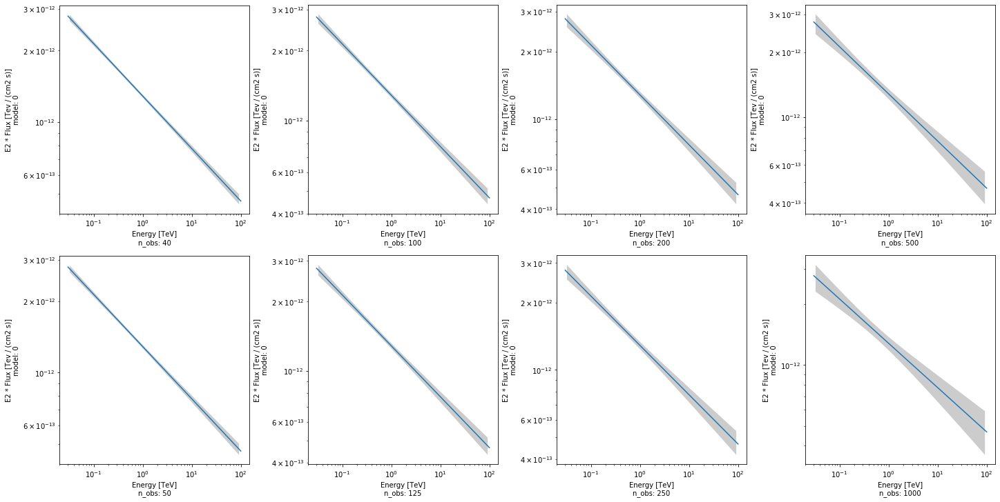

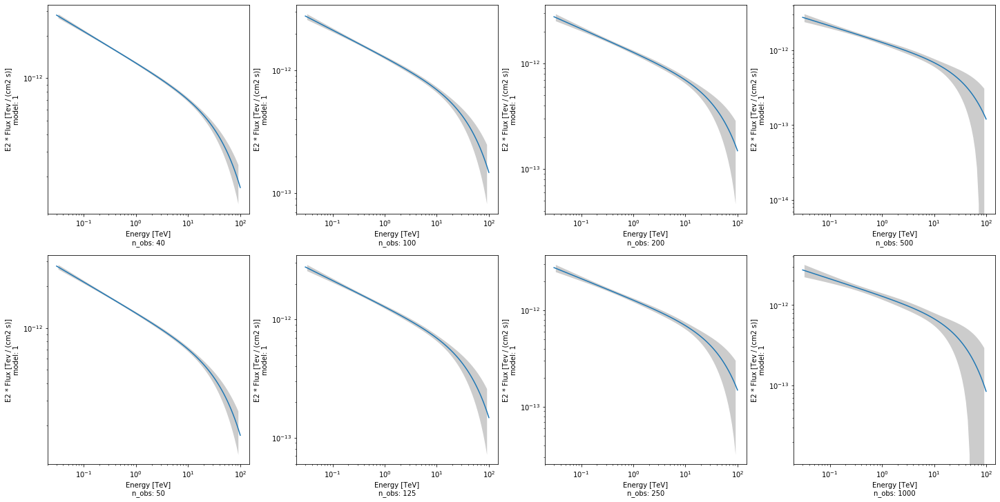

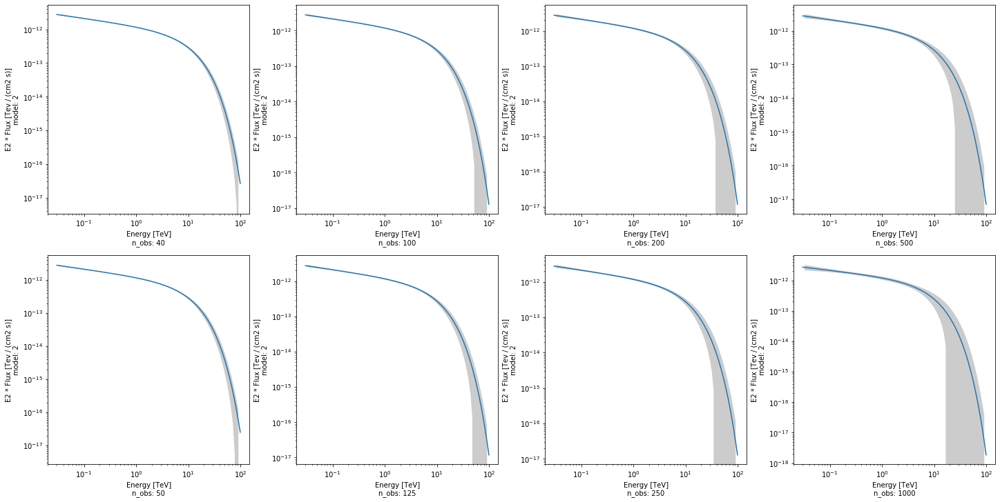

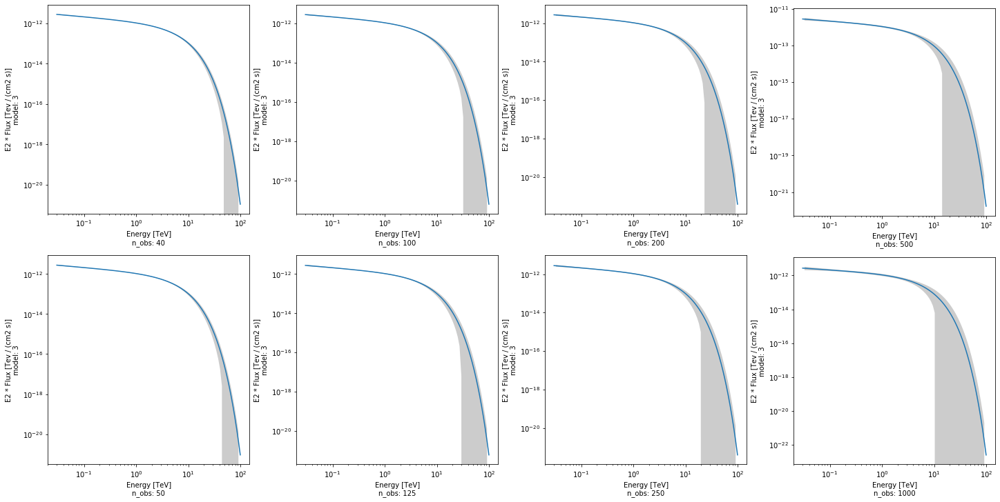

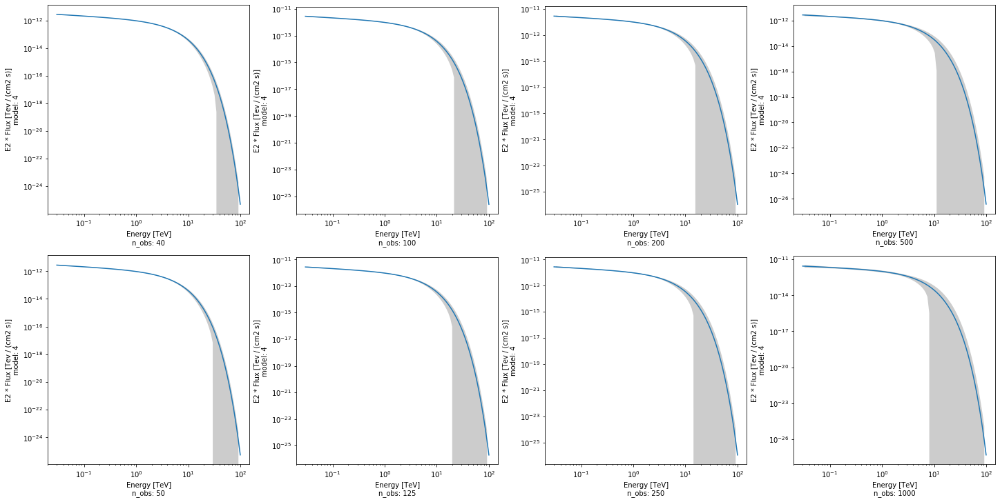

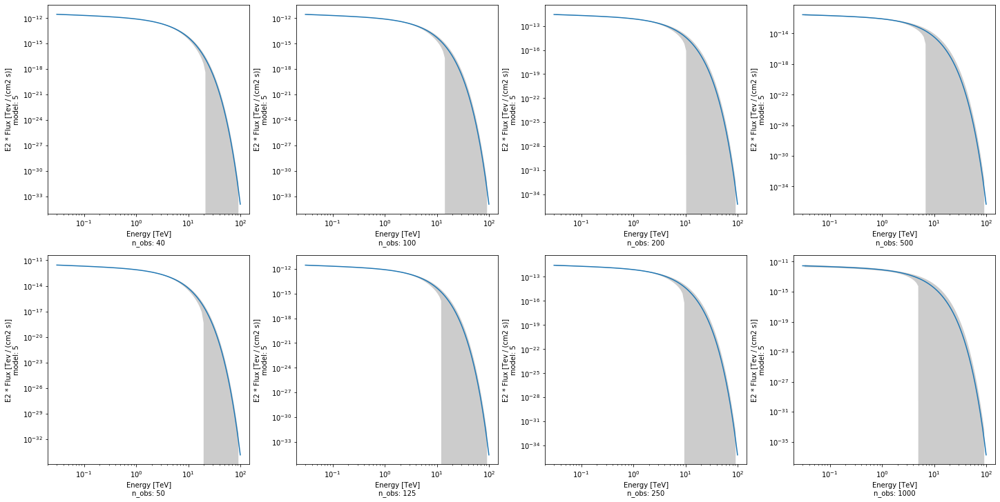

In [43]:
for i in range(6):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 4, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim_1[n][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim_1[n][i], covar=np.mean(covar_1[n][i], axis = 0),energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim_1[n+2][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim_1[n+2][i], covar=np.mean(covar_1[n+2][i], axis = 0),energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(2):
        ax = fig.add_subplot(gs3[n])
        sim_1[n+4][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim_1[n+4][i], covar=np.mean(covar_1[n+4][i], axis = 0),energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    gs4 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[3])
    for n in range(2):
        ax = fig.add_subplot(gs4[n])
        sim_1[n+6][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim_1[n+6][i], covar=np.mean(covar_1[n+6][i], axis = 0),energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+6]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    plt.show()